In [ ]:
import numpy as np
from collections import namedtuple, deque
import datetime
import gym
import glob
import io
import base64
import matplotlib.pyplot as plt
import tensorflow as tf
from PIL import Image
import tensorflow_probability as tfp
import seaborn as sbn
import os

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## One-Step Actor-Critic Algorithm

**Actor-Critic methods** learn both a policy $\pi(a|s;\theta)$ and a state-value function $v(s;w)$ simultaneously. The policy is referred to as the actor that suggests actions given a state. The estimated value function is referred to as the critic. It evaluates actions taken by the actor based on the given policy. In this exercise, both functions are approximated by feedforward neural networks. 

- The policy network is parametrized by $\theta$ - it takes a state $s$ as input and outputs the probabilities $\pi(a|s;\theta)\ \forall\ a$
- The value network is parametrized by $w$ - it takes a state $s$ as input and outputs a scalar value associated with the state, i.e., $v(s;w)$
- The single step TD error can be defined as follows:
$$\delta_t  = R_{t+1} + \gamma v(s_{t+1};w) - v(s_t;w)$$
- The loss function to be minimized at every step ($L_{tot}^{(t)}$) is a summation of two terms, as follows:
$$L_{tot}^{(t)} = L_{actor}^{(t)} + L_{critic}^{(t)}$$
where,
$$L_{actor}^{(t)} = -\log\pi(a_t|s_t; \theta)\delta_t$$
$$L_{critic}^{(t)} = \delta_t^2$$
- **NOTE: Here, weights of the first two hidden layers are shared by the policy and the value network**
    - First two hidden layer sizes: [1024, 512]
    - Output size of policy network: 2 (Softmax activation)
    - Output size of value network: 1 (Linear activation)

<!-- $$\pi(a|s;\theta) = \phi_{\theta}(a,s)$$ -->

### Actor-Critic Network

In [ ]:
NUM_HIDDEN = 2
HIDDEN_SIZES = [1024, 512]

class ActorCriticModel(tf.keras.Model):
    """
    Defining policy and value networkss
    """
    def __init__(self, action_size):
        super(ActorCriticModel, self).__init__()

        self.fcls = []
        for i in range(NUM_HIDDEN):
            fc = tf.keras.layers.Dense(HIDDEN_SIZES[i], activation='relu')
            self.fcls.append(fc)

        self.pi_out = tf.keras.layers.Dense(action_size) #Output Layer for policy
        self.v_out = tf.keras.layers.Dense(1) #Output Layer for state-value

    def call(self, state):
        """
        Computes policy distribution and state-value for a given state
        """
        out = state
        for l in self.fcls:
            out = l(out)

        pi = self.pi_out(out)
        v = self.v_out(out)

        return pi, v


### Agent Class



In [ ]:
ENV = gym.make('CartPole-v1')
LR = 1e-4
STEP = 5

def env_step(action: np.ndarray):
  """Returns state, reward and done flag given an action."""
  state, reward, done, info = ENV.step(action)
  return (state.astype(np.float32), np.array(reward, np.int32), np.array(done, np.int32))

def tf_env_step(action: tf.Tensor):
  return tf.numpy_function(env_step, [action], [tf.float32, tf.int32, tf.int32])

eps = np.finfo(np.float32).eps.item()
class Agent:
    def __init__(self, action_size):
        self.model = ActorCriticModel(action_size)
        self.loss = tf.keras.losses.Huber(reduction=tf.keras.losses.Reduction.SUM)
        self.optimizer = tf.keras.optimizers.Adam(learning_rate=LR)

    def run_episode(self, initial_state, max_steps=800):
        """Runs a single episode to collect training data."""

        action_probs = tf.TensorArray(dtype=tf.float32, size=0, dynamic_size=True)
        values = tf.TensorArray(dtype=tf.float32, size=0, dynamic_size=True)
        rewards = tf.TensorArray(dtype=tf.int32, size=0, dynamic_size=True)

        initial_state_shape = initial_state.shape
        state = initial_state
        steps = 0
        for t in tf.range(max_steps):
            # Convert state into a batched tensor (batch size = 1)
            state = tf.expand_dims(state, 0)

            # Run the model and to get action probabilities and critic value; and sample next action
            action_logits_t, value = self.model(state)
            action = tf.random.categorical(action_logits_t, 1)[0, 0]
            action_probs_t = tf.nn.softmax(action_logits_t)

            # Store critic values
            values = values.write(t, tf.squeeze(value))

            # Store log probability of the action chosen
            action_probs = action_probs.write(t, action_probs_t[0, action])

            # Apply action to the environment to get next state and reward
            state, reward, done = tf_env_step(action)
            state.set_shape(initial_state_shape)

            rewards = rewards.write(t, reward)
            steps += 1
            if tf.cast(done, tf.bool):
                break

        action_probs = action_probs.stack()
        values = values.stack()
        rewards = rewards.stack()

        return action_probs, values, rewards, steps

    def compute_nstep_returns(self, rewards, values, gamma = 0.99):
        """Compute n step returns at all timesteps."""

        n = tf.shape(rewards)[0]
        returns = tf.TensorArray(dtype=tf.float32, size=n)
        rewards = tf.cast(rewards[::-1], dtype=tf.float32)
        disc_return = tf.constant(0.0)
        disc_ret_shape = disc_return.shape

        # loop to compute the return for every instant
        for i in tf.range(n):
            if i+STEP >= n:
                ret = tf.constant(0.0)
                ret_shape = ret.shape
                for j in tf.range(i,n):
                    ret = tf.math.pow(gamma,float(j-i))*rewards[j] + ret
                    ret.set_shape(ret_shape)
                disc_return = ret
            else:
                ret = tf.constant(0.0)
                ret_shape = ret.shape
                for j in tf.range(i,i+STEP):
                    ret = tf.math.pow(gamma,float(j-i)) * rewards[j] + ret
                    ret.set_shape(ret_shape)
                disc_return = ret + tf.math.pow(gamma,float(STEP)) * values[i+STEP]
            disc_return.set_shape(disc_ret_shape)
            returns = returns.write(i, disc_return)

        returns = returns.stack()
        return returns

    def compute_loss(self, action_probs, values, returns):
        """Computes the combined Actor-Critic loss."""
        advantage = returns - values
        action_log_probs = tf.math.log(action_probs)
        actor_loss = -tf.math.reduce_sum(action_log_probs * advantage)
        critic_loss = self.loss(values, returns)
        return actor_loss + critic_loss

    @tf.function
    def train_step(self, initial_state, gamma=0.99, max_steps=800):
        """Runs a model training step."""

        with tf.GradientTape() as tape:
            # Run the model for one episode to collect training data
            action_probs, values, rewards, steps = self.run_episode(initial_state,max_steps=max_steps) 
            # Calculate the expected returns
            returns = self.compute_nstep_returns(rewards, values, gamma)
            # Convert training data to appropriate TF tensor shapes
            action_probs, values, returns = [tf.expand_dims(x, 1) for x in [action_probs, values, returns]] 
            # Calculate the loss values to update our network
            loss = self.compute_loss(action_probs, values, returns)
        # Compute the gradients from the loss
        grads = tape.gradient(loss, self.model.trainable_variables)
        # Apply the gradients to the model's parameters
        self.optimizer.apply_gradients(zip(grads, self.model.trainable_variables))
        episode_reward = tf.math.reduce_sum(rewards)
        return episode_reward, steps

/usr/local/lib/python3.9/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.9/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(



### Code to train the agent

In [ ]:
NUM_EPISODES = 1800
AVG_NUM = 50
SOLVE_CUTOFF = 195

# do 1 run of the AC-agent in an environment for num_episodes
def run_ac_net(tf_seed=42):
    tf.keras.utils.set_random_seed(tf_seed)
    agent = Agent(action_size=ENV.action_space.n)
    
    tf.compat.v1.reset_default_graph()

    reward_list = []
    step_list = []
    begin_time = datetime.datetime.now()
    ep_count = NUM_EPISODES

    for ep in range(1, NUM_EPISODES + 1):
        state = ENV.reset()
        ep_rew, steps = agent.train_step(state, gamma=0.99, max_steps=800)
        reward_list.append(ep_rew)
        step_list.append(steps)
    
        if ep % 10 == 0:
            avg_rew = np.mean(reward_list[-10:])
            print('Episode ', ep, 'Reward %f' % ep_rew, 'Average Reward %f' % avg_rew)

        if ep % 100:
            avg_100 =  np.mean(reward_list[-100:])
            if avg_100 > SOLVE_CUTOFF:
                ep_count = min(ep_count, ep) # keep track of number of episodes to solve environment

    time_taken = datetime.datetime.now() - begin_time
    print(time_taken)
    return reward_list, step_list, ep_count

In [ ]:
def rolling_average(reward_list, avg_num=AVG_NUM):
    average_reward_list = np.zeros_like(reward_list)
    for i in range(0, len(reward_list)):
        if i < avg_num:
            average_reward_list[i] = np.mean(reward_list[:(i+1)])
        else:
            average_reward_list[i] = np.mean(reward_list[(i-avg_num+1):(i+1)])
    return average_reward_list

In [ ]:
def do_multiple_runs(env_name, num_runs):
    reward_lists, step_lists, comp_list = [], [], []
    ENV.seed(42)

    for r in range(num_runs):
        r, s, c = run_ac_net()
        reward_lists.append(r)
        step_lists.append(list(map(int,s)))
        comp_list.append(c)
    
    mean_rewards = np.mean(reward_lists, axis=0)
    var_rewards = np.sqrt(np.var(reward_lists, axis=0))

    return mean_rewards, var_rewards, comp_list, reward_lists, step_lists

## Plotting Functions and Other Helpers

In [ ]:
PATH = '/content/drive/MyDrive/Colab Notebooks/CS6700/Assignments/Assignment2/ACN/'

def gen_plots_and_save_data(fname, data, mean_rewards, var_rewards, reward_lists, step_lists):
    
    m_fig, m_ax = plt.subplots(figsize=(10,10))
    v_fig, v_ax = plt.subplots(figsize=(10,10))
    m_ax.set_title(f'Mean Reward over 10 runs')
    m_ax.set_xlabel('Episodes')
    m_ax.set_ylabel('Mean Reward')
    v_ax.set_title(f'Variance of Reward over 10 runs')
    v_ax.set_xlabel('Episodes')
    v_ax.set_ylabel('Variance')

    sbn.lineplot(data=mean_rewards, ax=m_ax)
    sbn.lineplot(data=var_rewards, ax=v_ax)
      
    m_fig.savefig(PATH+'/'+fname+'/mean_reward.png')
    v_fig.savefig(PATH+'/'+fname+'/var_reward.png')

    sc_fig, sc_ax = plt.subplots(figsize=(10,10))
    st_fig, st_ax = plt.subplots(figsize=(10,10))
    sc_ax.set_title(f'Running average of previous {AVG_NUM} rewards')
    sc_ax.set_xlabel('Episodes')
    sc_ax.set_ylabel('Reward')
    st_ax.set_title(f'Number of steps curve')
    st_ax.set_xlabel('Episodes')
    st_ax.set_ylabel('Steps')
    
    run_count = len(reward_lists)
    labels = [f'run {i+1}' for i in range(3)]
    for idx in range(min(run_count, 3)):

        score_list = rolling_average(reward_lists[idx])
        step_list = step_lists[idx]
        sbn.lineplot(data=score_list, label=labels[idx], ax=sc_ax)
        sbn.lineplot(data=step_list, label=labels[idx], ax=st_ax)

    sc_fig.savefig(PATH+'/'+fname+'/sc_fig.png')
    st_fig.savefig(PATH+'/'+fname+'/st_fig.png')

    with open(PATH+'/'+fname+'/'+'config.txt', 'w') as f:
        for s in data:
            f.write(s + '\n')

## Experiments

### STEP(N) = 5

#### CartPole

Episode  10 Reward 15.000000 Average Reward 28.500000
Episode  20 Reward 15.000000 Average Reward 27.500000
Episode  30 Reward 29.000000 Average Reward 25.100000
Episode  40 Reward 47.000000 Average Reward 18.300000
Episode  50 Reward 53.000000 Average Reward 27.400000
Episode  60 Reward 18.000000 Average Reward 20.400000
Episode  70 Reward 17.000000 Average Reward 19.700000
Episode  80 Reward 20.000000 Average Reward 18.500000
Episode  90 Reward 26.000000 Average Reward 14.800000
Episode  100 Reward 17.000000 Average Reward 24.600000
Episode  110 Reward 28.000000 Average Reward 33.400000
Episode  120 Reward 14.000000 Average Reward 20.900000
Episode  130 Reward 9.000000 Average Reward 21.100000
Episode  140 Reward 22.000000 Average Reward 20.100000
Episode  150 Reward 19.000000 Average Reward 19.800000
Episode  160 Reward 24.000000 Average Reward 18.500000
Episode  170 Reward 23.000000 Average Reward 25.200000
Episode  180 Reward 40.000000 Average Reward 24.800000
Episode  190 Reward 

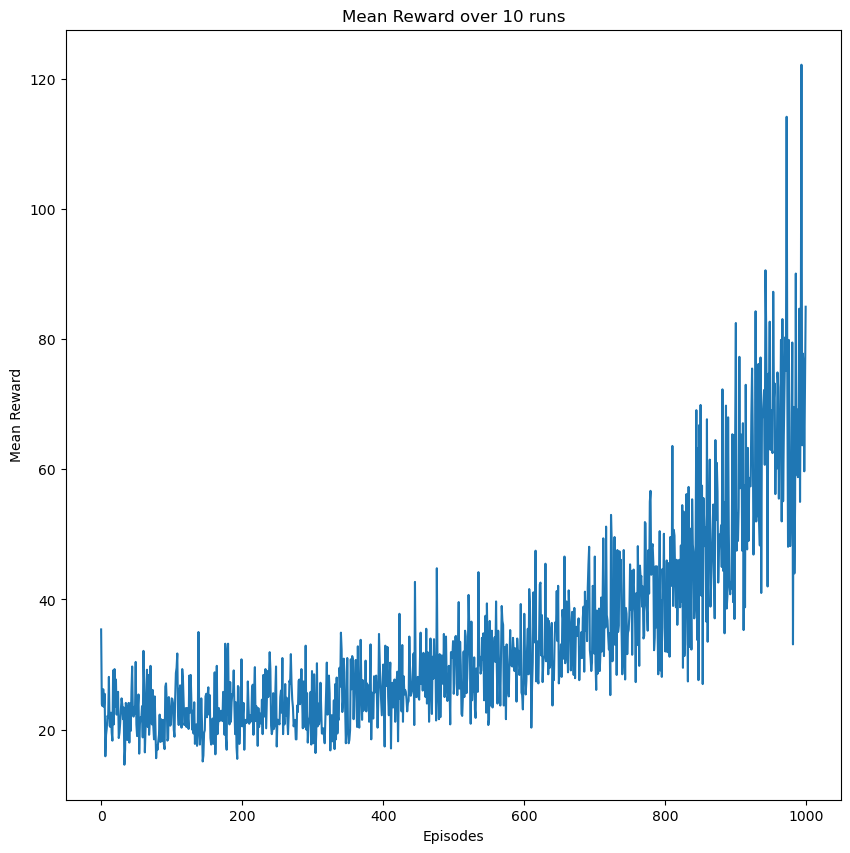

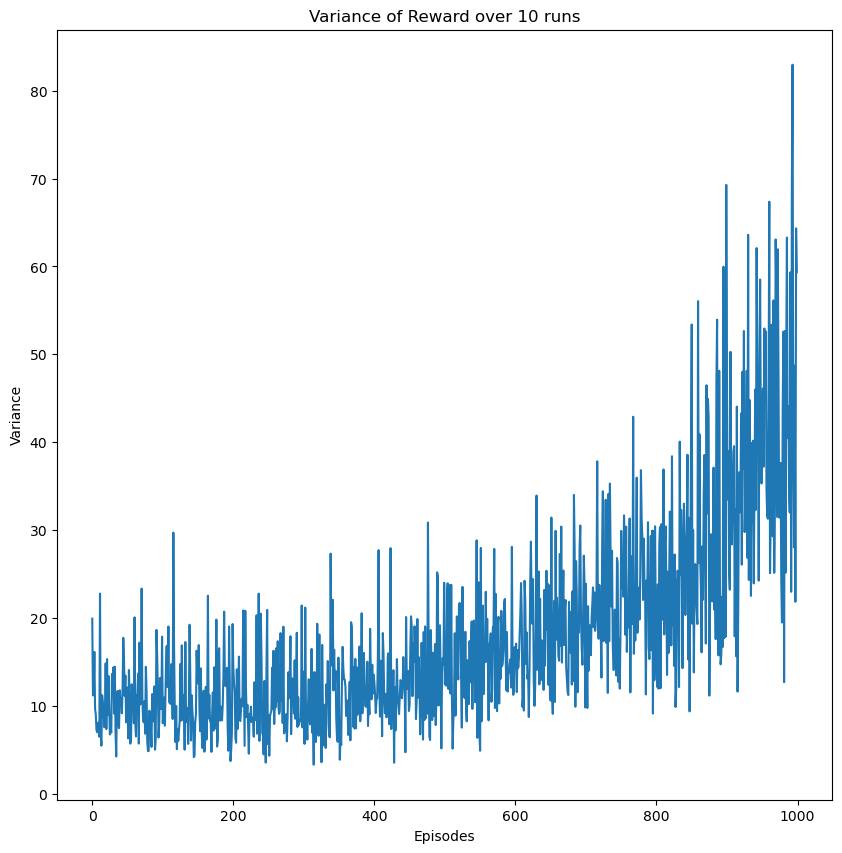

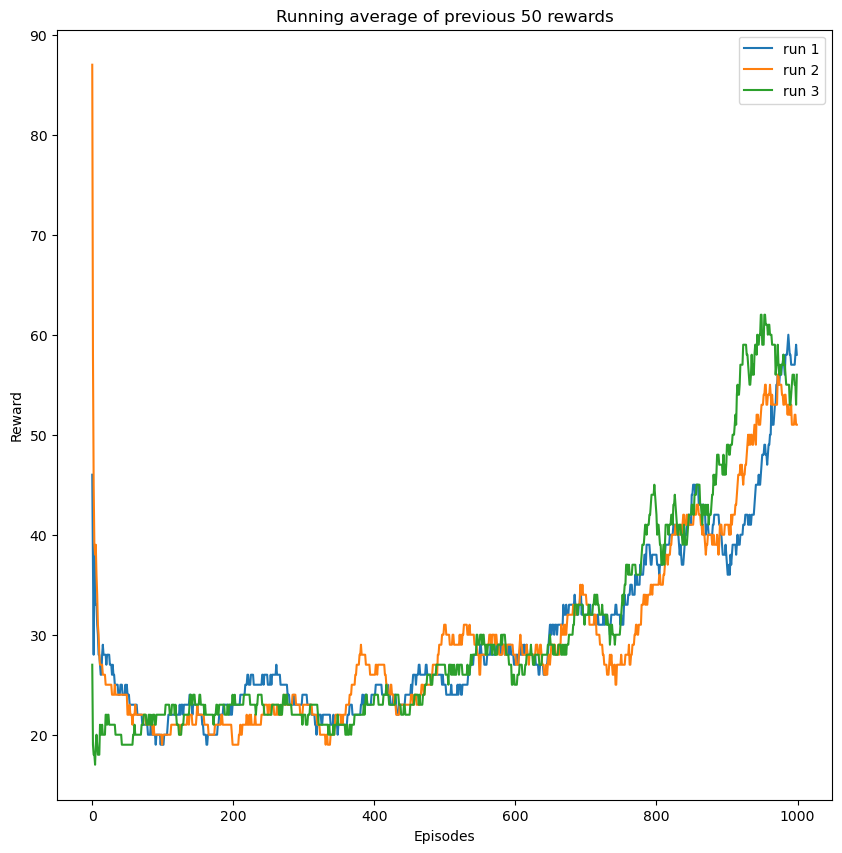

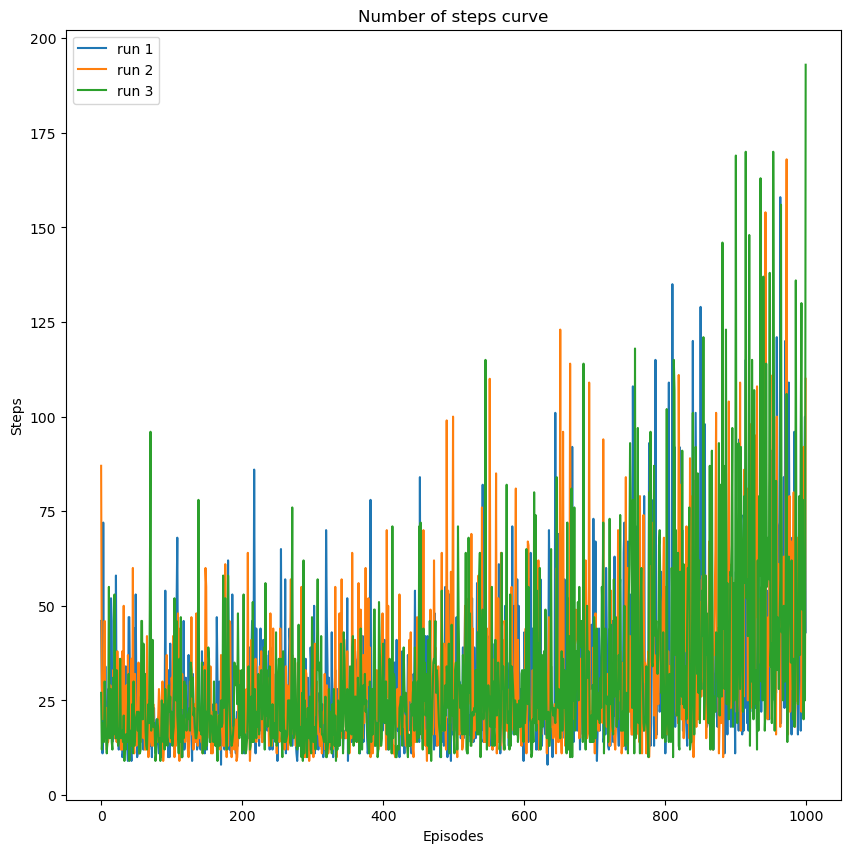

In [ ]:
NUM_HIDDEN = 1
HIDDEN_SIZES = [1024]
LR = 1e-4
NUM_EPISODES = 1000
AVG_NUM = 50
ENV_NAME = 'CartPole-v1'
SOLVE_CUTOFF = 195.0
STEP = 5

ENV = gym.make(ENV_NAME)
mean_rewards, var_rewards, comp_list, reward_lists, step_lists = do_multiple_runs(env_name=ENV_NAME, num_runs=10)

data = [f'Number of Hidden Layers - {NUM_HIDDEN}', f'Hidden Sizes - {HIDDEN_SIZES}', f'Learning Rate - {LR}', 
        f'Run number of episodes to solve - {comp_list}', f'Mean number of episodes to solve- {np.mean(comp_list)}', 
        f'Number of episodes - {NUM_EPISODES}', f'Environment Name - {ENV_NAME}', f'NSTEP = {STEP}']

fname = f'hl={NUM_HIDDEN}_hs={HIDDEN_SIZES}_lr={LR}_env={ENV_NAME}_numep={NUM_EPISODES}_nstep={STEP}'
os.mkdir(PATH+'/'+fname)
gen_plots_and_save_data(fname, data, mean_rewards, var_rewards, reward_lists, step_lists)

/opt/conda/lib/python3.7/site-packages/gym/core.py:173: DeprecationWarning: WARN: Function `env.seed(seed)` is marked as deprecated and will be removed in the future. Please use `env.reset(seed=seed) instead.
  "Function `env.seed(seed)` is marked as deprecated and will be removed in the future. "


Episode  10 Reward 14.000000 Average Reward 28.500000
Episode  20 Reward 15.000000 Average Reward 27.500000
Episode  30 Reward 30.000000 Average Reward 25.200000
Episode  40 Reward 28.000000 Average Reward 20.000000
Episode  50 Reward 18.000000 Average Reward 21.700000
Episode  60 Reward 8.000000 Average Reward 26.600000
Episode  70 Reward 21.000000 Average Reward 26.000000
Episode  80 Reward 13.000000 Average Reward 16.800000
Episode  90 Reward 23.000000 Average Reward 21.300000
Episode  100 Reward 45.000000 Average Reward 26.600000
Episode  110 Reward 21.000000 Average Reward 23.800000
Episode  120 Reward 38.000000 Average Reward 21.900000
Episode  130 Reward 30.000000 Average Reward 17.800000
Episode  140 Reward 19.000000 Average Reward 27.300000
Episode  150 Reward 14.000000 Average Reward 23.700000
Episode  160 Reward 34.000000 Average Reward 19.500000
Episode  170 Reward 15.000000 Average Reward 20.400000
Episode  180 Reward 15.000000 Average Reward 23.100000
Episode  190 Reward 

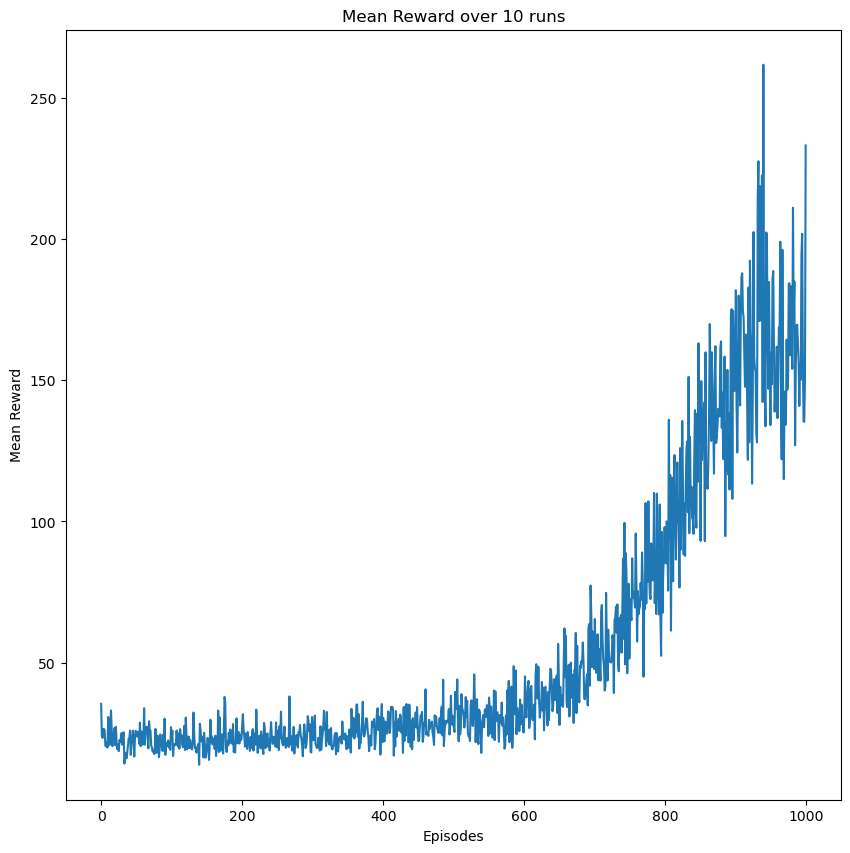

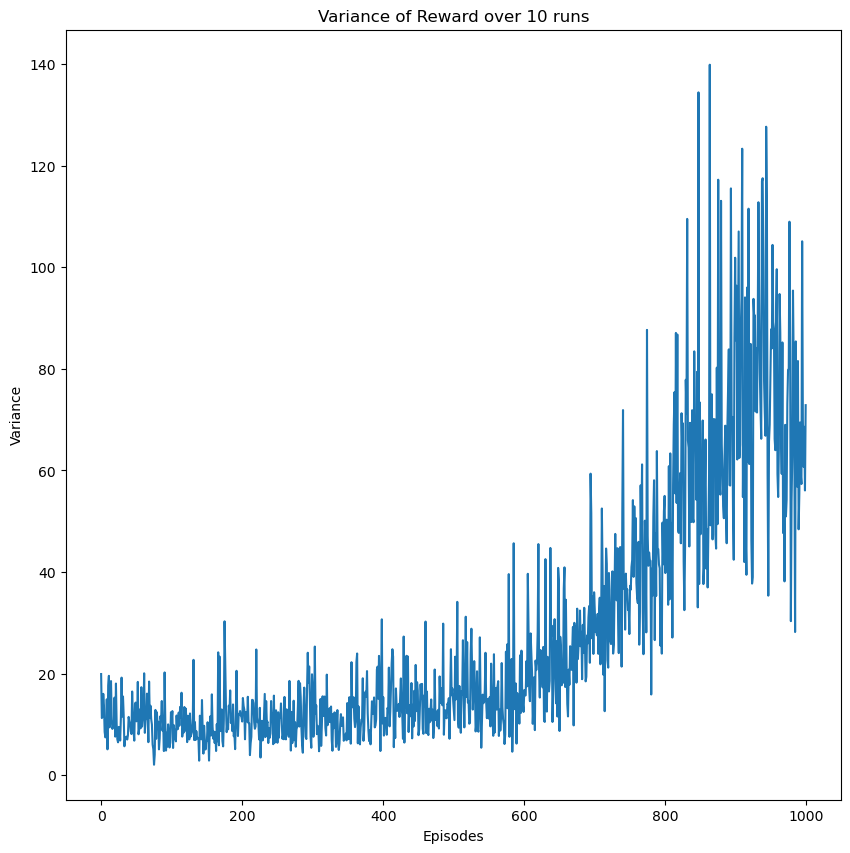

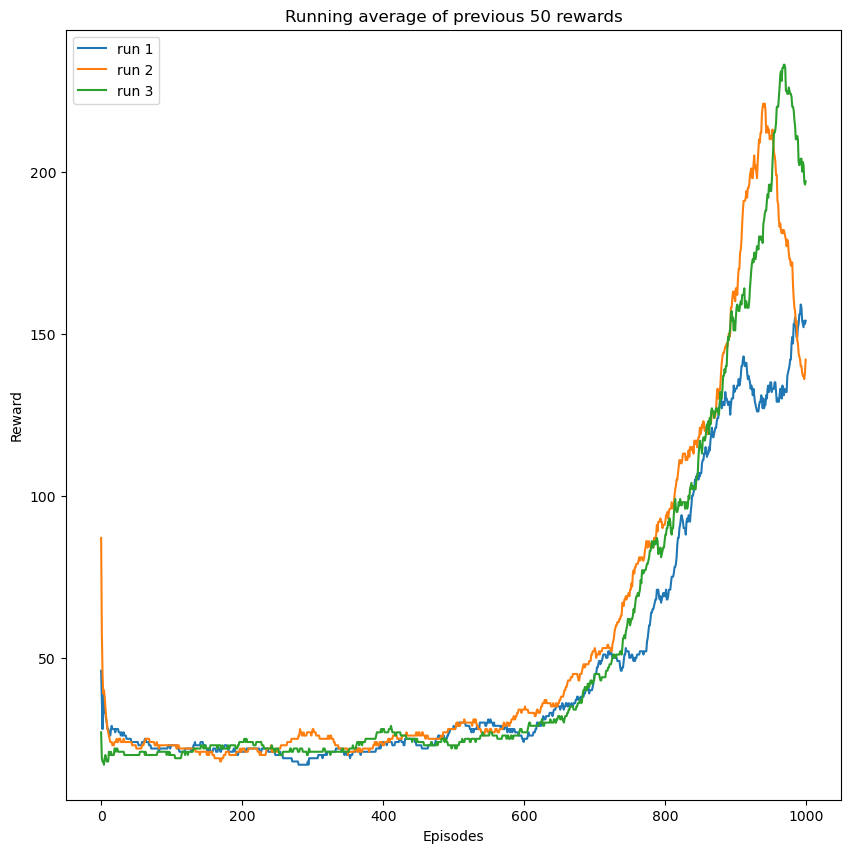

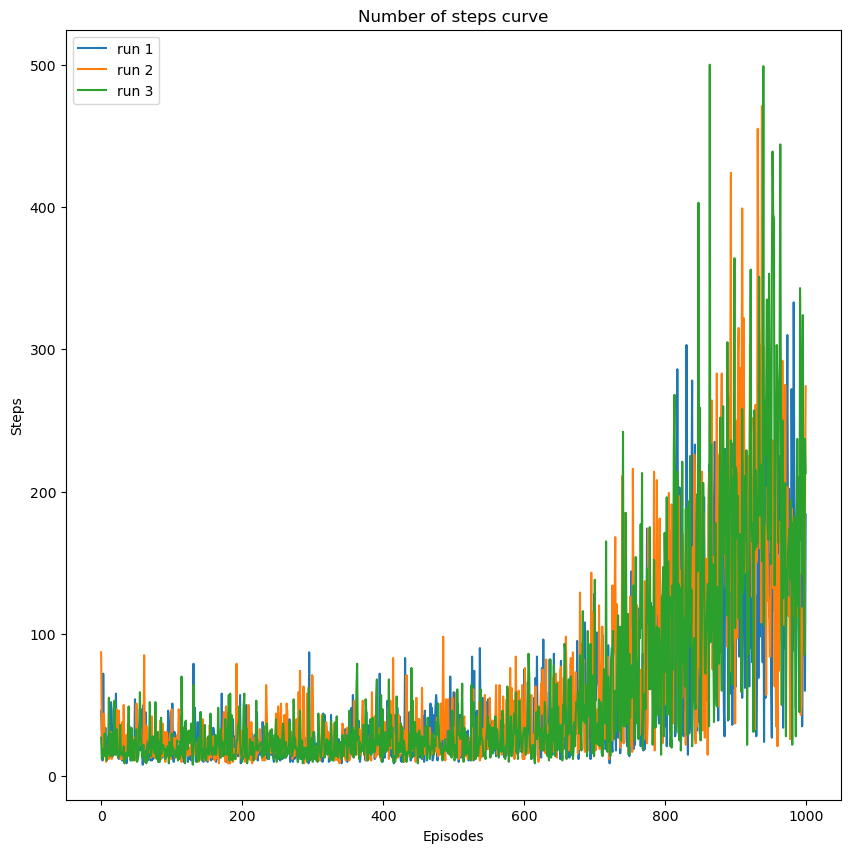

In [ ]:
NUM_HIDDEN = 2
HIDDEN_SIZES = [512, 512]
LR = 0.5e-4
NUM_EPISODES = 1000
AVG_NUM = 50
ENV_NAME = 'CartPole-v1'
SOLVE_CUTOFF = 195.0
STEP = 5

ENV = gym.make(ENV_NAME)
mean_rewards, var_rewards, comp_list, reward_lists, step_lists = do_multiple_runs(env_name=ENV_NAME, num_runs=10)

data = [f'Number of Hidden Layers - {NUM_HIDDEN}', f'Hidden Sizes - {HIDDEN_SIZES}', f'Learning Rate - {LR}', 
        f'Run number of episodes to solve - {comp_list}', f'Mean number of episodes to solve- {np.mean(comp_list)}', 
        f'Number of episodes - {NUM_EPISODES}', f'Environment Name - {ENV_NAME}', f'NSTEP = {STEP}']

fname = f'hl={NUM_HIDDEN}_hs={HIDDEN_SIZES}_lr={LR}_env={ENV_NAME}_numep={NUM_EPISODES}_nstep={STEP}'
os.mkdir(PATH+'/'+fname)
gen_plots_and_save_data(fname, data, mean_rewards, var_rewards, reward_lists, step_lists)

/opt/conda/lib/python3.7/site-packages/gym/core.py:173: DeprecationWarning: WARN: Function `env.seed(seed)` is marked as deprecated and will be removed in the future. Please use `env.reset(seed=seed) instead.
  "Function `env.seed(seed)` is marked as deprecated and will be removed in the future. "


Episode  10 Reward 40.000000 Average Reward 35.400000
Episode  20 Reward 22.000000 Average Reward 19.700000
Episode  30 Reward 28.000000 Average Reward 23.900000
Episode  40 Reward 28.000000 Average Reward 22.200000
Episode  50 Reward 25.000000 Average Reward 28.700000
Episode  60 Reward 15.000000 Average Reward 22.600000
Episode  70 Reward 18.000000 Average Reward 21.400000
Episode  80 Reward 31.000000 Average Reward 21.500000
Episode  90 Reward 50.000000 Average Reward 28.700000
Episode  100 Reward 19.000000 Average Reward 20.100000
Episode  110 Reward 19.000000 Average Reward 19.800000
Episode  120 Reward 32.000000 Average Reward 21.300000
Episode  130 Reward 23.000000 Average Reward 25.800000
Episode  140 Reward 88.000000 Average Reward 24.000000
Episode  150 Reward 11.000000 Average Reward 17.600000
Episode  160 Reward 24.000000 Average Reward 31.700000
Episode  170 Reward 15.000000 Average Reward 35.600000
Episode  180 Reward 10.000000 Average Reward 43.800000
Episode  190 Reward

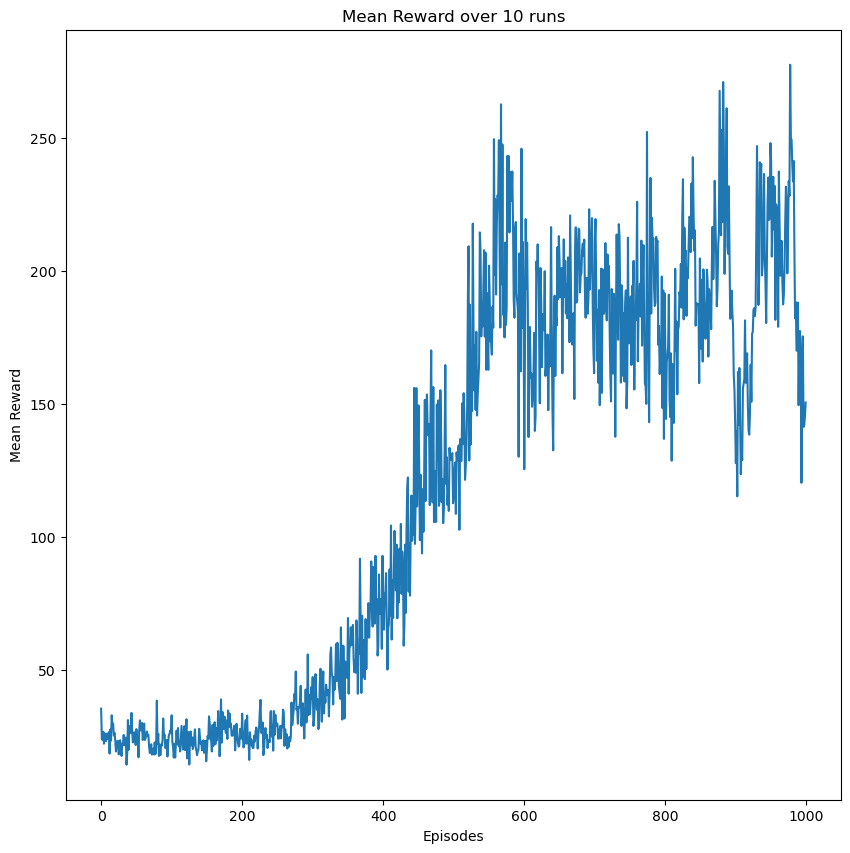

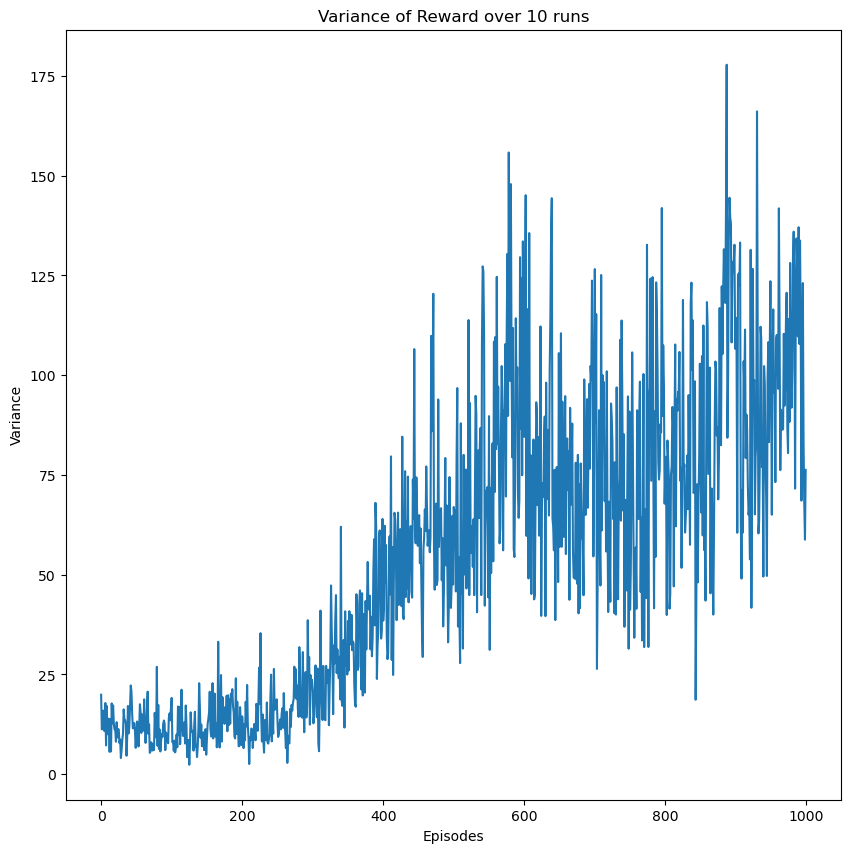

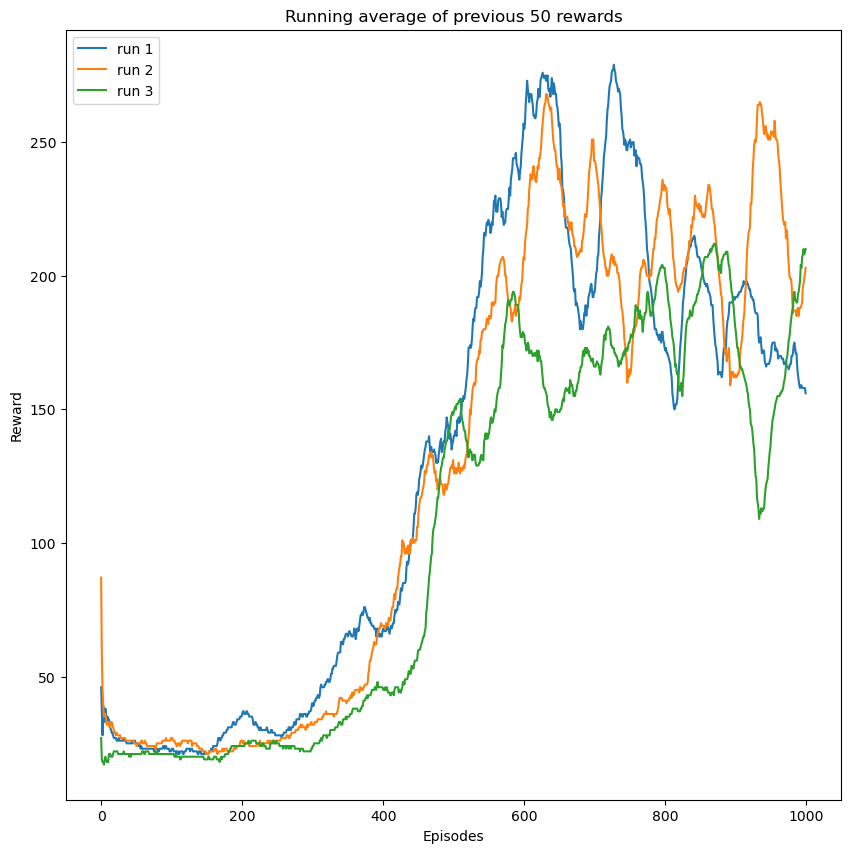

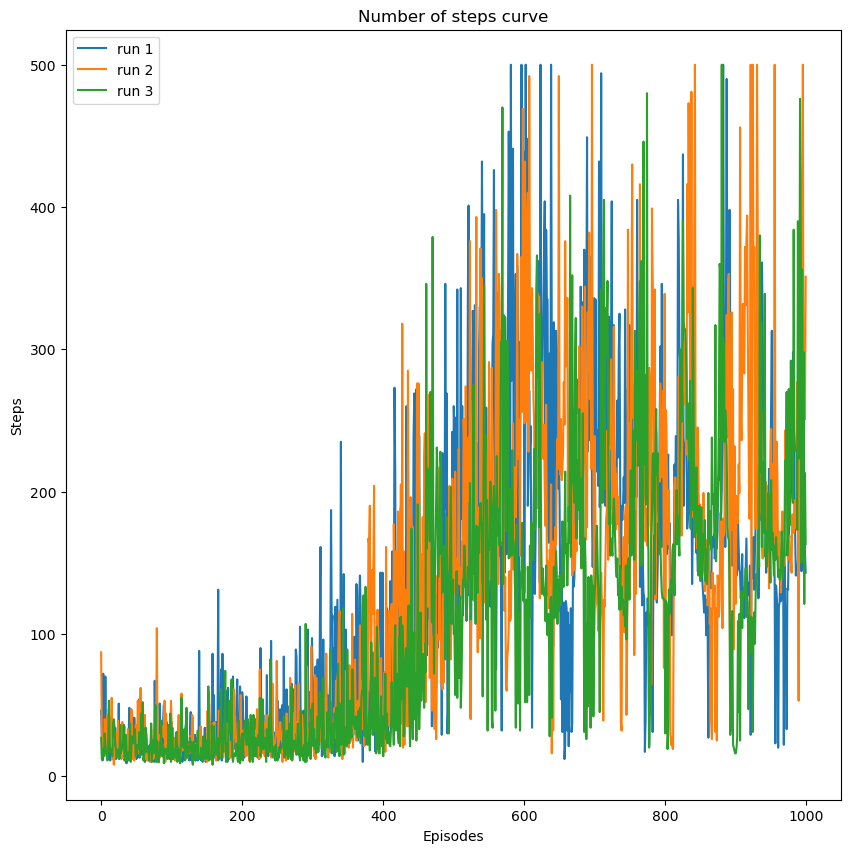

In [ ]:
NUM_HIDDEN = 2
HIDDEN_SIZES = [512, 512]
LR = 1e-4
NUM_EPISODES = 1000
AVG_NUM = 50
ENV_NAME = 'CartPole-v1'
SOLVE_CUTOFF = 195.0
STEP = 5

ENV = gym.make(ENV_NAME)
mean_rewards, var_rewards, comp_list, reward_lists, step_lists = do_multiple_runs(env_name=ENV_NAME, num_runs=10)

data = [f'Number of Hidden Layers - {NUM_HIDDEN}', f'Hidden Sizes - {HIDDEN_SIZES}', f'Learning Rate - {LR}', 
        f'Run number of episodes to solve - {comp_list}', f'Mean number of episodes to solve- {np.mean(comp_list)}', 
        f'Number of episodes - {NUM_EPISODES}', f'Environment Name - {ENV_NAME}', f'NSTEP = {STEP}']

fname = f'hl={NUM_HIDDEN}_hs={HIDDEN_SIZES}_lr={LR}_env={ENV_NAME}_numep={NUM_EPISODES}_nstep={STEP}'
os.mkdir(PATH+'/'+fname)
gen_plots_and_save_data(fname, data, mean_rewards, var_rewards, reward_lists, step_lists)

/opt/conda/lib/python3.7/site-packages/gym/core.py:173: DeprecationWarning: WARN: Function `env.seed(seed)` is marked as deprecated and will be removed in the future. Please use `env.reset(seed=seed) instead.
  "Function `env.seed(seed)` is marked as deprecated and will be removed in the future. "


Episode  10 Reward 60.000000 Average Reward 37.400000
Episode  20 Reward 19.000000 Average Reward 27.300000
Episode  30 Reward 12.000000 Average Reward 25.700000
Episode  40 Reward 42.000000 Average Reward 25.700000
Episode  50 Reward 26.000000 Average Reward 30.100000
Episode  60 Reward 21.000000 Average Reward 37.500000
Episode  70 Reward 61.000000 Average Reward 30.100000
Episode  80 Reward 34.000000 Average Reward 26.000000
Episode  90 Reward 34.000000 Average Reward 26.900000
Episode  100 Reward 24.000000 Average Reward 18.600000
Episode  110 Reward 46.000000 Average Reward 28.000000
Episode  120 Reward 19.000000 Average Reward 30.200000
Episode  130 Reward 21.000000 Average Reward 26.600000
Episode  140 Reward 40.000000 Average Reward 27.000000
Episode  150 Reward 30.000000 Average Reward 45.600000
Episode  160 Reward 12.000000 Average Reward 31.800000
Episode  170 Reward 35.000000 Average Reward 31.400000
Episode  180 Reward 17.000000 Average Reward 29.900000
Episode  190 Reward

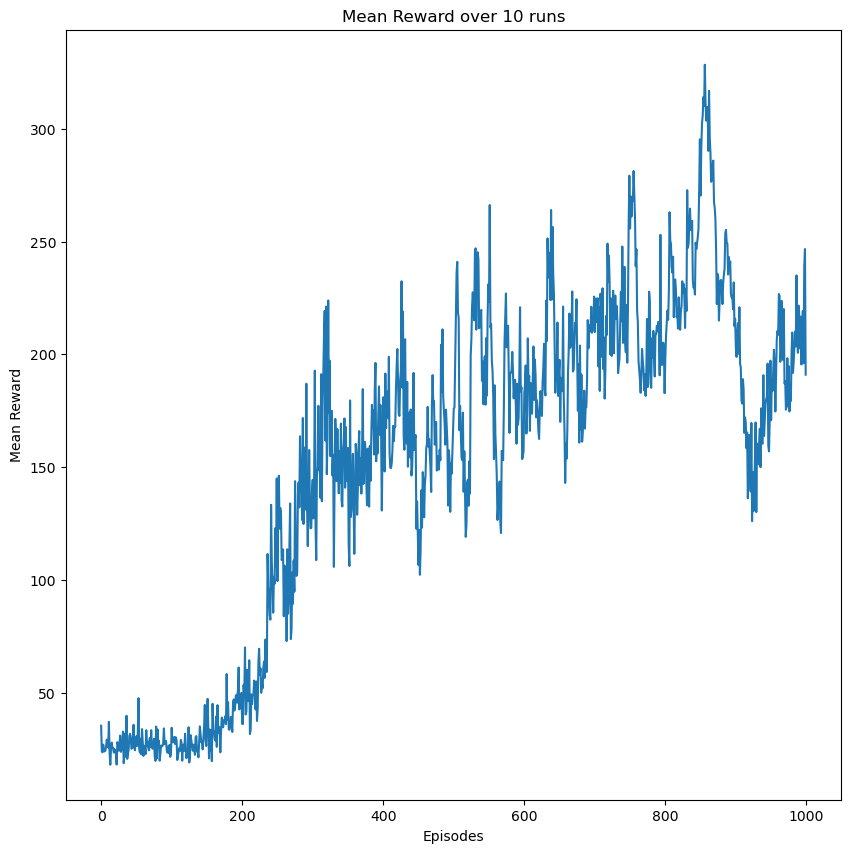

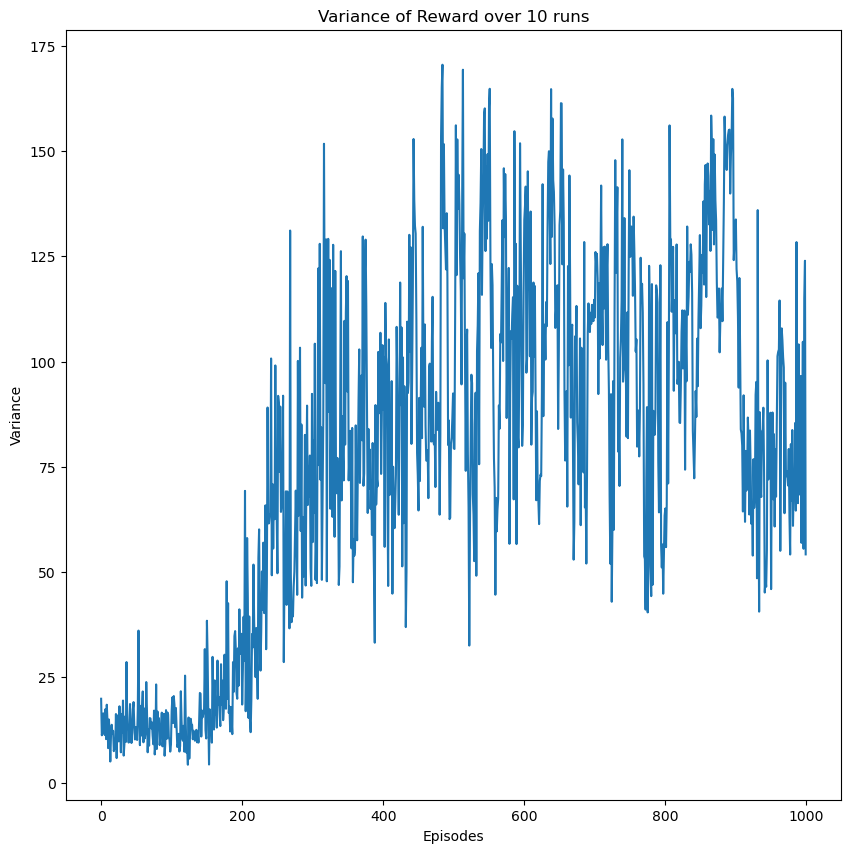

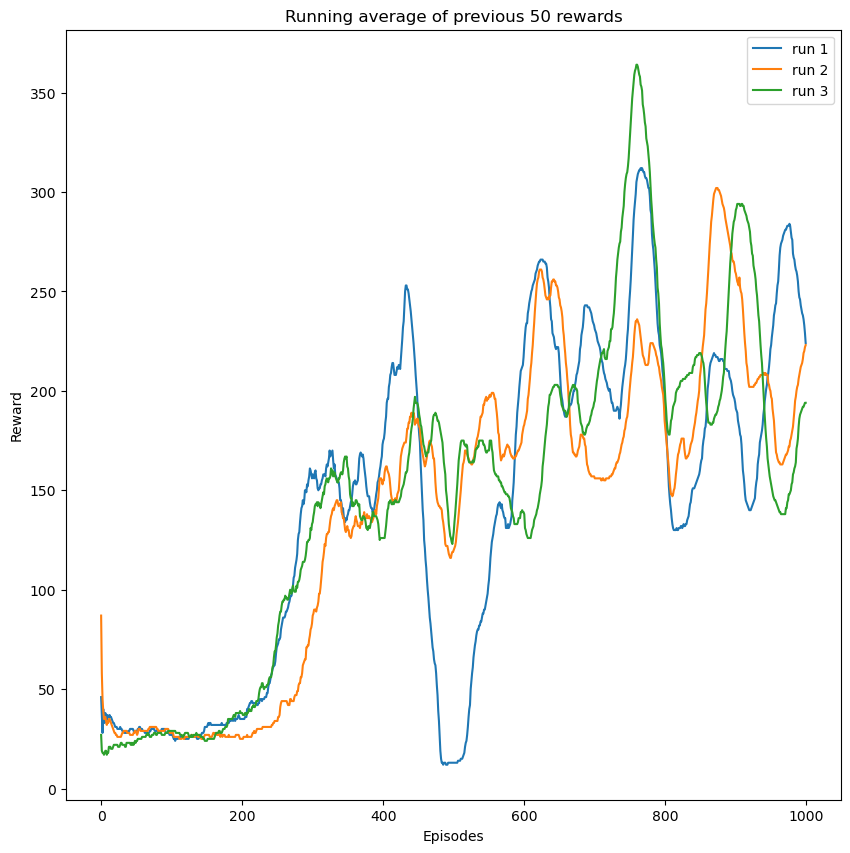

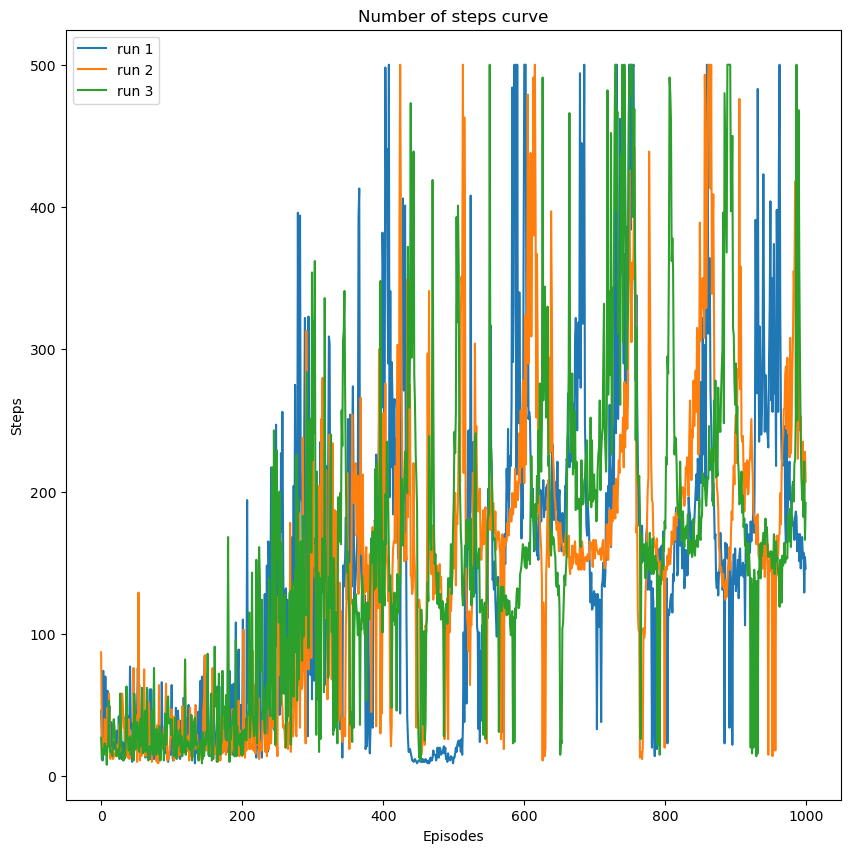

In [ ]:
NUM_HIDDEN = 2
HIDDEN_SIZES = [512, 512]
LR = 2e-4
NUM_EPISODES = 1000
AVG_NUM = 50
ENV_NAME = 'CartPole-v1'
SOLVE_CUTOFF = 195.0
STEP = 5

ENV = gym.make(ENV_NAME)
mean_rewards, var_rewards, comp_list, reward_lists, step_lists = do_multiple_runs(env_name=ENV_NAME, num_runs=10)

data = [f'Number of Hidden Layers - {NUM_HIDDEN}', f'Hidden Sizes - {HIDDEN_SIZES}', f'Learning Rate - {LR}', 
        f'Run number of episodes to solve - {comp_list}', f'Mean number of episodes to solve- {np.mean(comp_list)}', 
        f'Number of episodes - {NUM_EPISODES}', f'Environment Name - {ENV_NAME}', f'NSTEP = {STEP}']

fname = f'hl={NUM_HIDDEN}_hs={HIDDEN_SIZES}_lr={LR}_env={ENV_NAME}_numep={NUM_EPISODES}_nstep={STEP}'
os.mkdir(PATH+'/'+fname)
gen_plots_and_save_data(fname, data, mean_rewards, var_rewards, reward_lists, step_lists)

/opt/conda/lib/python3.7/site-packages/gym/core.py:173: DeprecationWarning: WARN: Function `env.seed(seed)` is marked as deprecated and will be removed in the future. Please use `env.reset(seed=seed) instead.
  "Function `env.seed(seed)` is marked as deprecated and will be removed in the future. "


Episode  10 Reward 15.000000 Average Reward 28.800000
Episode  20 Reward 73.000000 Average Reward 33.000000
Episode  30 Reward 13.000000 Average Reward 24.000000
Episode  40 Reward 12.000000 Average Reward 22.000000
Episode  50 Reward 20.000000 Average Reward 28.400000
Episode  60 Reward 28.000000 Average Reward 37.000000
Episode  70 Reward 13.000000 Average Reward 24.600000
Episode  80 Reward 32.000000 Average Reward 26.000000
Episode  90 Reward 33.000000 Average Reward 31.200000
Episode  100 Reward 78.000000 Average Reward 38.200000
Episode  110 Reward 23.000000 Average Reward 22.300000
Episode  120 Reward 22.000000 Average Reward 30.400000
Episode  130 Reward 20.000000 Average Reward 23.200000
Episode  140 Reward 17.000000 Average Reward 23.700000
Episode  150 Reward 20.000000 Average Reward 25.200000
Episode  160 Reward 20.000000 Average Reward 22.200000
Episode  170 Reward 31.000000 Average Reward 26.800000
Episode  180 Reward 14.000000 Average Reward 22.200000
Episode  190 Reward

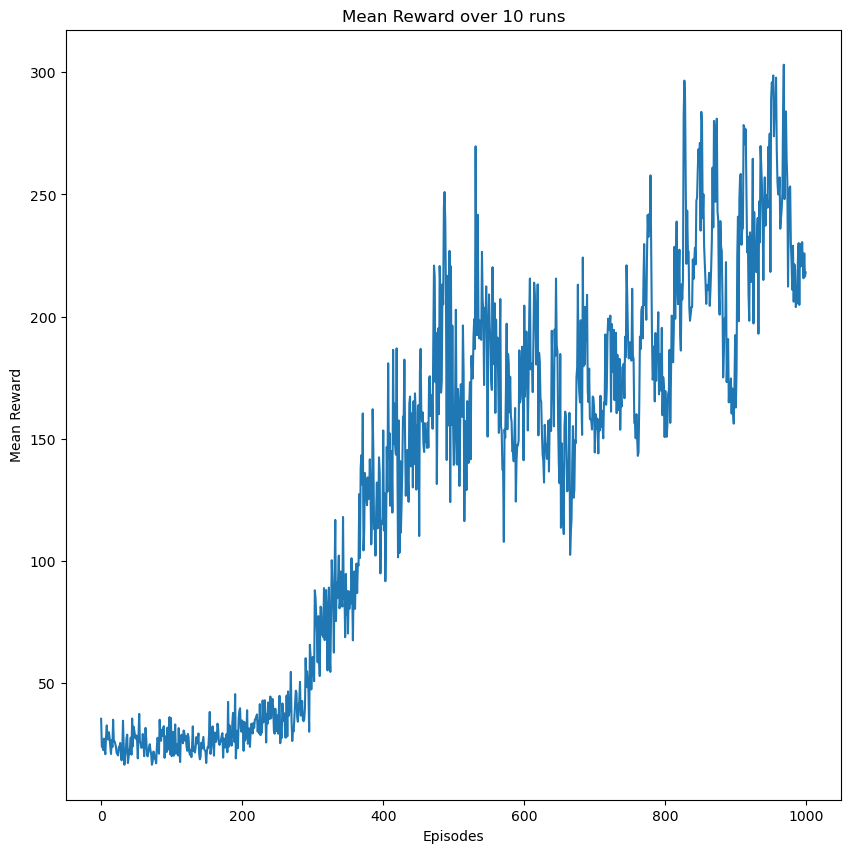

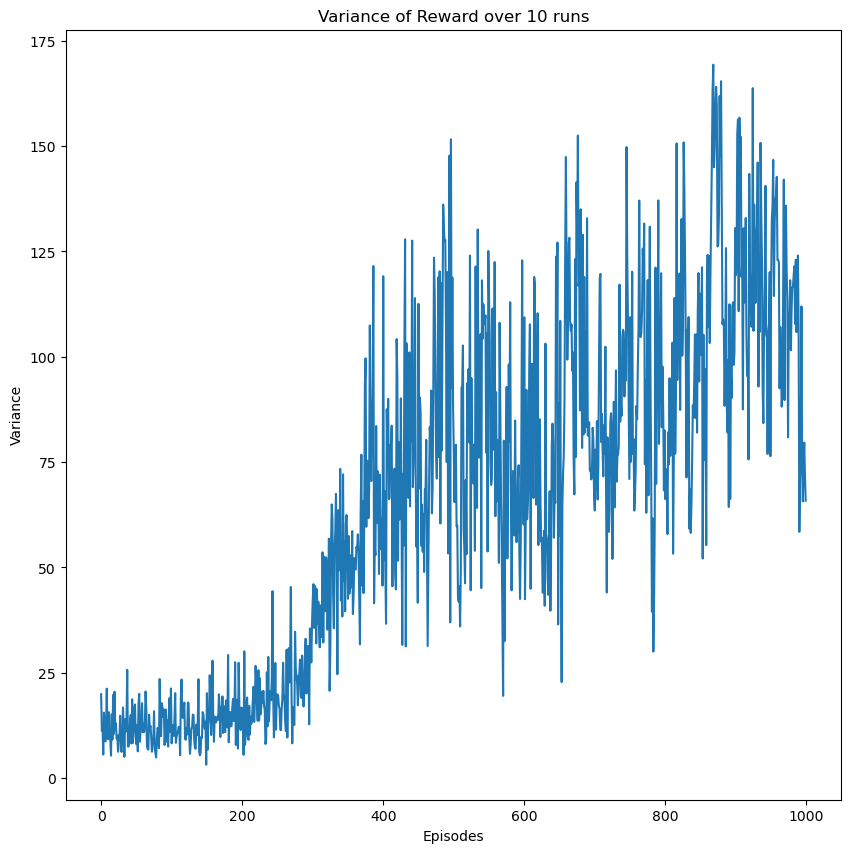

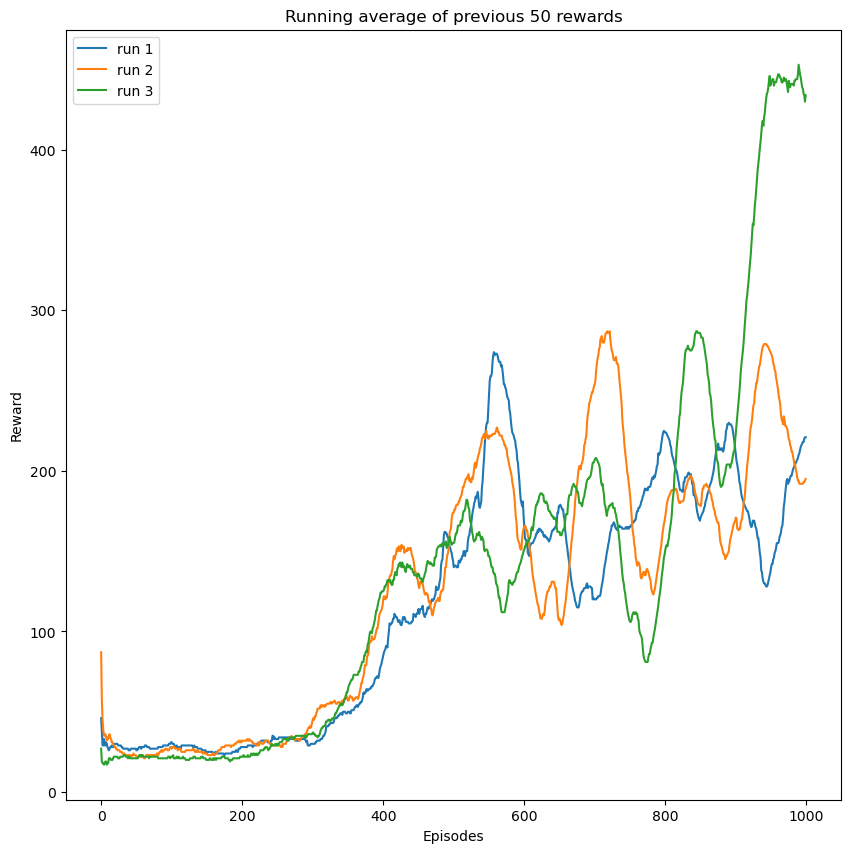

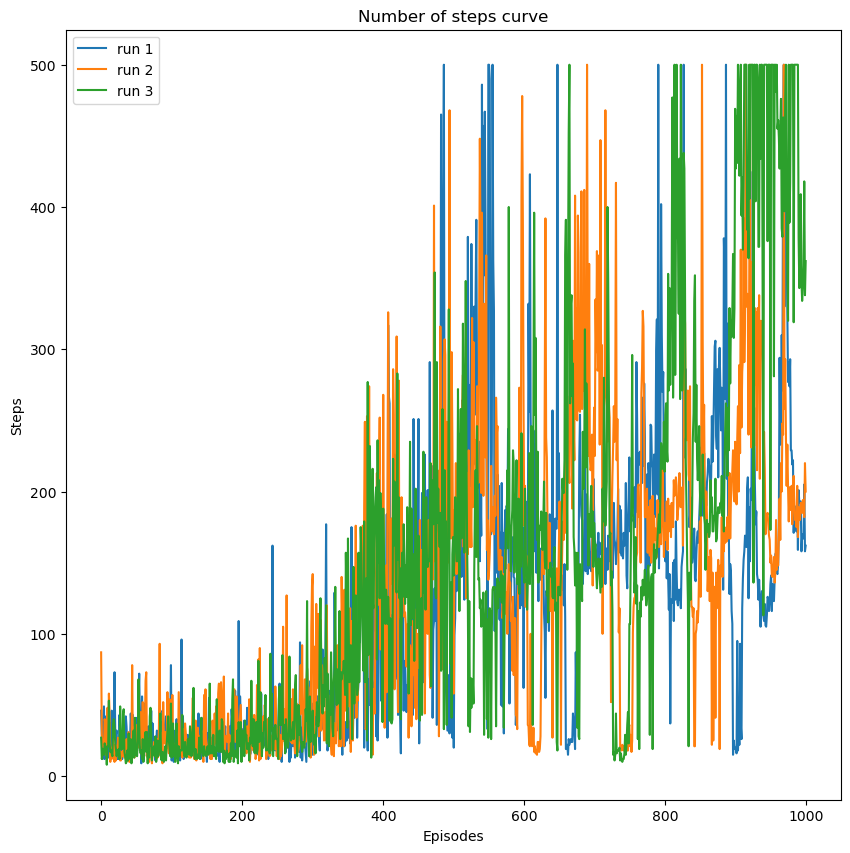

In [ ]:
NUM_HIDDEN = 2
HIDDEN_SIZES = [1024, 512]
LR = 1e-4
NUM_EPISODES = 1000
AVG_NUM = 50
ENV_NAME = 'CartPole-v1'
SOLVE_CUTOFF = 195.0
STEP = 5

ENV = gym.make(ENV_NAME)
mean_rewards, var_rewards, comp_list, reward_lists, step_lists = do_multiple_runs(env_name=ENV_NAME, num_runs=10)

data = [f'Number of Hidden Layers - {NUM_HIDDEN}', f'Hidden Sizes - {HIDDEN_SIZES}', f'Learning Rate - {LR}', 
        f'Run number of episodes to solve - {comp_list}', f'Mean number of episodes to solve- {np.mean(comp_list)}', 
        f'Number of episodes - {NUM_EPISODES}', f'Environment Name - {ENV_NAME}', f'NSTEP = {STEP}']

fname = f'hl={NUM_HIDDEN}_hs={HIDDEN_SIZES}_lr={LR}_env={ENV_NAME}_numep={NUM_EPISODES}_nstep={STEP}'
os.mkdir(PATH+'/'+fname)
gen_plots_and_save_data(fname, data, mean_rewards, var_rewards, reward_lists, step_lists)

/opt/conda/lib/python3.7/site-packages/gym/core.py:173: DeprecationWarning: WARN: Function `env.seed(seed)` is marked as deprecated and will be removed in the future. Please use `env.reset(seed=seed) instead.
  "Function `env.seed(seed)` is marked as deprecated and will be removed in the future. "


Episode  10 Reward 33.000000 Average Reward 28.600000
Episode  20 Reward 12.000000 Average Reward 21.500000
Episode  30 Reward 12.000000 Average Reward 26.200000
Episode  40 Reward 22.000000 Average Reward 31.500000
Episode  50 Reward 14.000000 Average Reward 24.000000
Episode  60 Reward 13.000000 Average Reward 24.500000
Episode  70 Reward 16.000000 Average Reward 20.600000
Episode  80 Reward 17.000000 Average Reward 20.800000
Episode  90 Reward 31.000000 Average Reward 27.700000
Episode  100 Reward 12.000000 Average Reward 28.700000
Episode  110 Reward 26.000000 Average Reward 30.900000
Episode  120 Reward 26.000000 Average Reward 26.200000
Episode  130 Reward 31.000000 Average Reward 21.000000
Episode  140 Reward 16.000000 Average Reward 26.100000
Episode  150 Reward 21.000000 Average Reward 20.400000
Episode  160 Reward 23.000000 Average Reward 24.200000
Episode  170 Reward 14.000000 Average Reward 36.300000
Episode  180 Reward 10.000000 Average Reward 25.000000
Episode  190 Reward

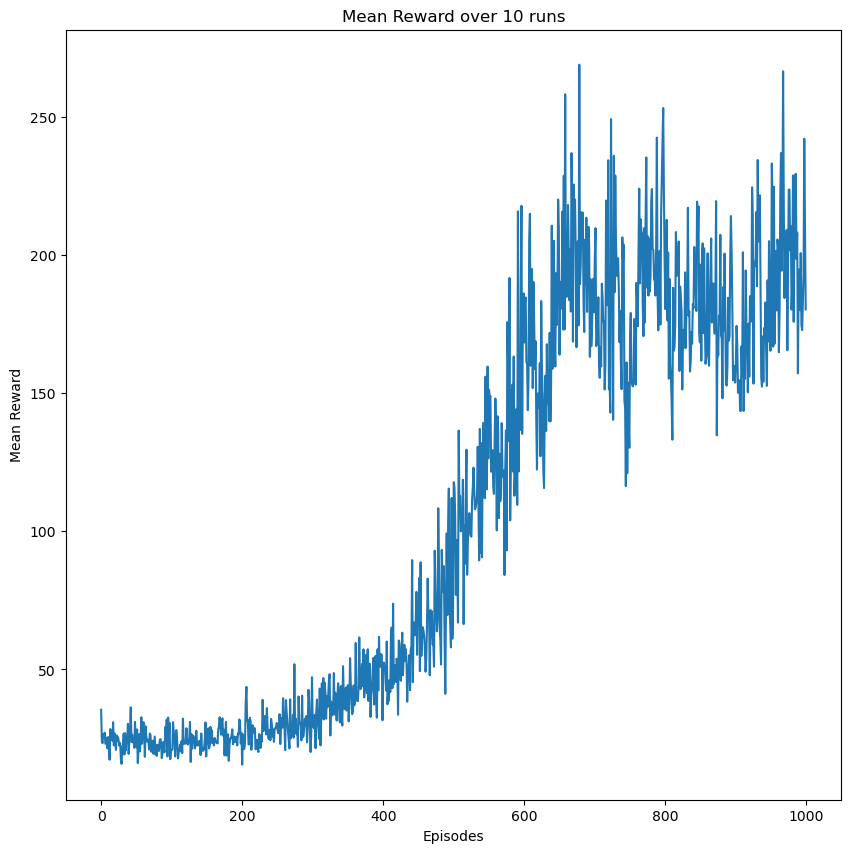

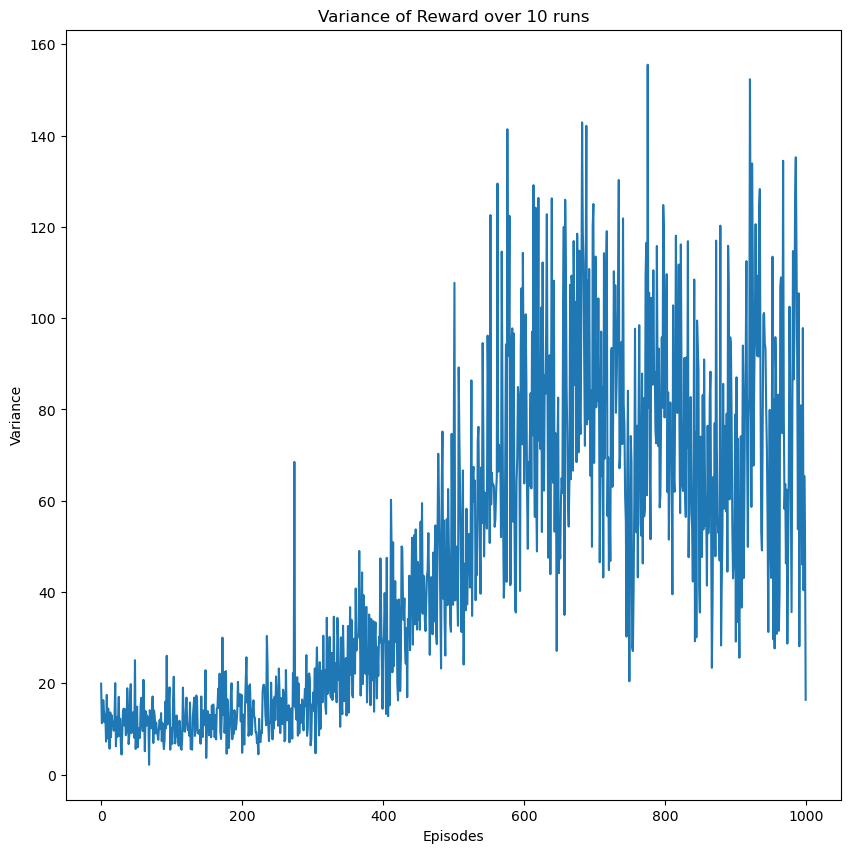

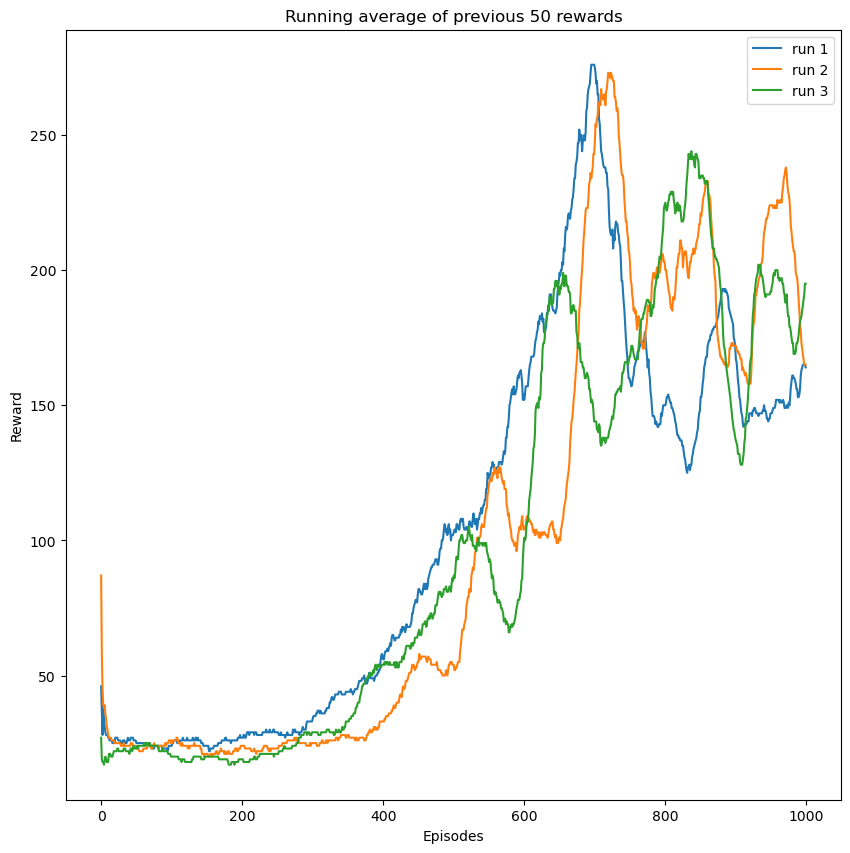

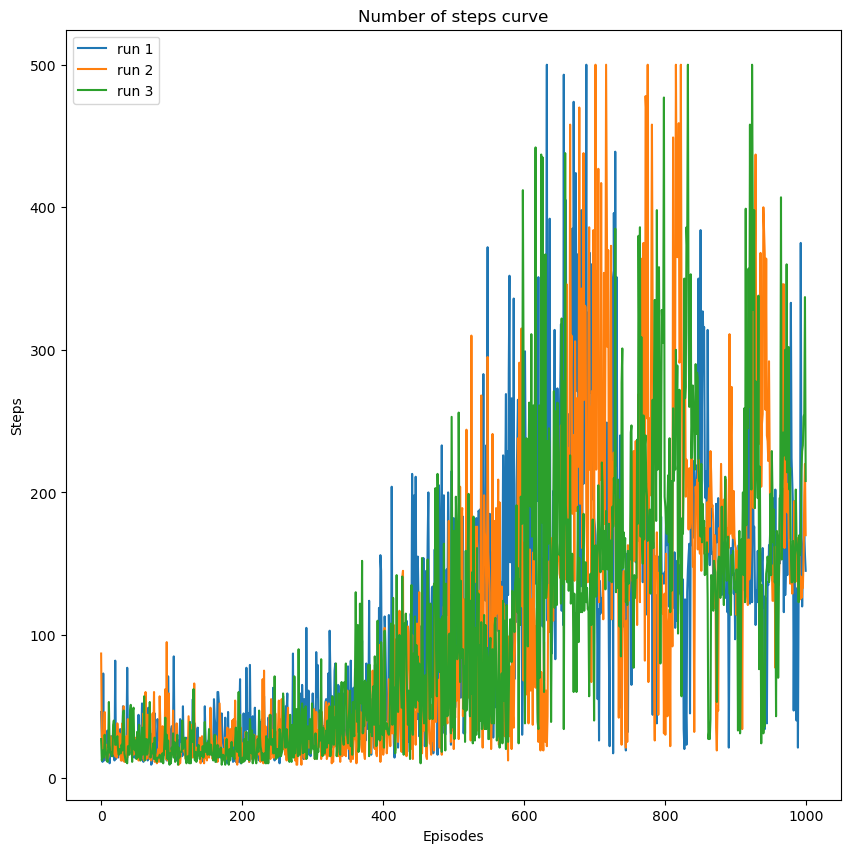

In [ ]:
NUM_HIDDEN = 2
HIDDEN_SIZES = [1024, 1024]
LR = 0.5e-4
NUM_EPISODES = 1000
AVG_NUM = 50
ENV_NAME = 'CartPole-v1'
SOLVE_CUTOFF = 195.0
STEP = 5

ENV = gym.make(ENV_NAME)
mean_rewards, var_rewards, comp_list, reward_lists, step_lists = do_multiple_runs(env_name=ENV_NAME, num_runs=10)

data = [f'Number of Hidden Layers - {NUM_HIDDEN}', f'Hidden Sizes - {HIDDEN_SIZES}', f'Learning Rate - {LR}', 
        f'Run number of episodes to solve - {comp_list}', f'Mean number of episodes to solve- {np.mean(comp_list)}', 
        f'Number of episodes - {NUM_EPISODES}', f'Environment Name - {ENV_NAME}', f'NSTEP = {STEP}']

fname = f'hl={NUM_HIDDEN}_hs={HIDDEN_SIZES}_lr={LR}_env={ENV_NAME}_numep={NUM_EPISODES}_nstep={STEP}'
os.mkdir(PATH+'/'+fname)
gen_plots_and_save_data(fname, data, mean_rewards, var_rewards, reward_lists, step_lists)

Episode  10 Reward 44.000000 Average Reward 35.800000
Episode  20 Reward 44.000000 Average Reward 22.800000
Episode  30 Reward 15.000000 Average Reward 21.300000
Episode  40 Reward 28.000000 Average Reward 28.500000
Episode  50 Reward 22.000000 Average Reward 28.700000
Episode  60 Reward 46.000000 Average Reward 36.000000
Episode  70 Reward 34.000000 Average Reward 35.700000
Episode  80 Reward 30.000000 Average Reward 24.400000
Episode  90 Reward 99.000000 Average Reward 34.500000
Episode  100 Reward 33.000000 Average Reward 43.800000
Episode  110 Reward 25.000000 Average Reward 25.100000
Episode  120 Reward 51.000000 Average Reward 27.000000
Episode  130 Reward 21.000000 Average Reward 26.400000
Episode  140 Reward 12.000000 Average Reward 29.700000
Episode  150 Reward 57.000000 Average Reward 32.900000
Episode  160 Reward 17.000000 Average Reward 32.800000
Episode  170 Reward 17.000000 Average Reward 44.100000
Episode  180 Reward 35.000000 Average Reward 38.200000
Episode  190 Reward

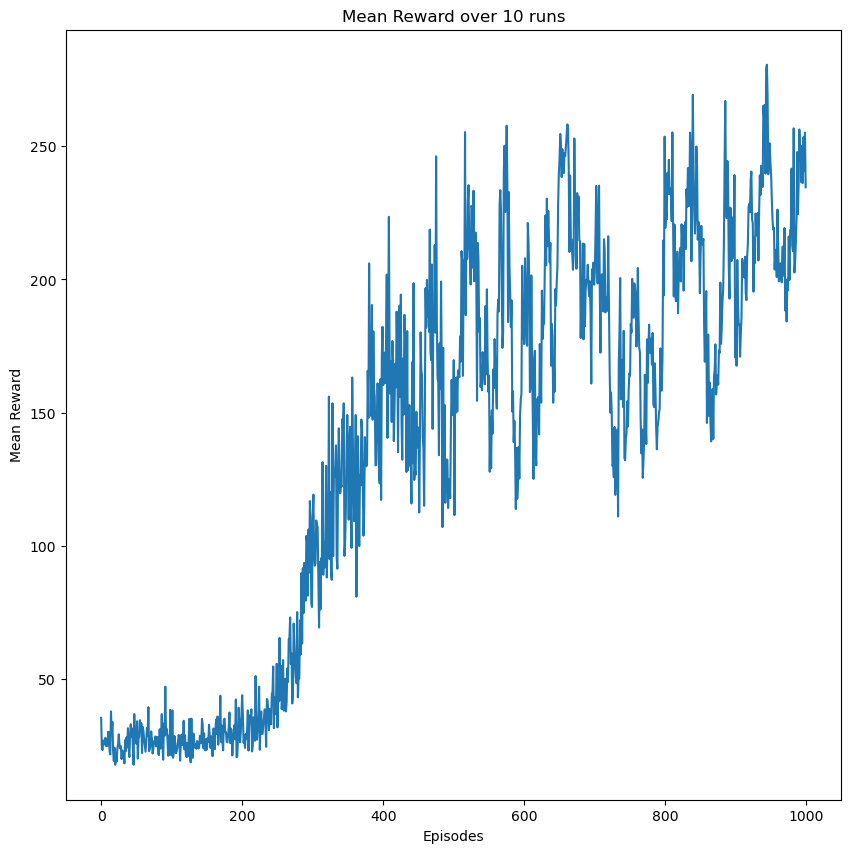

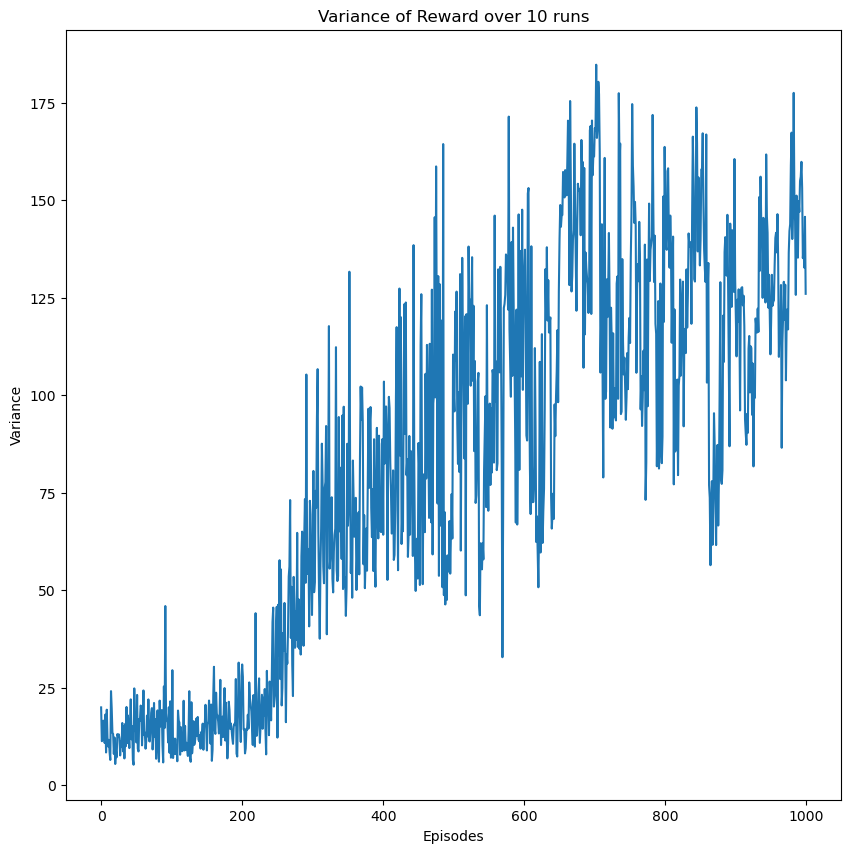

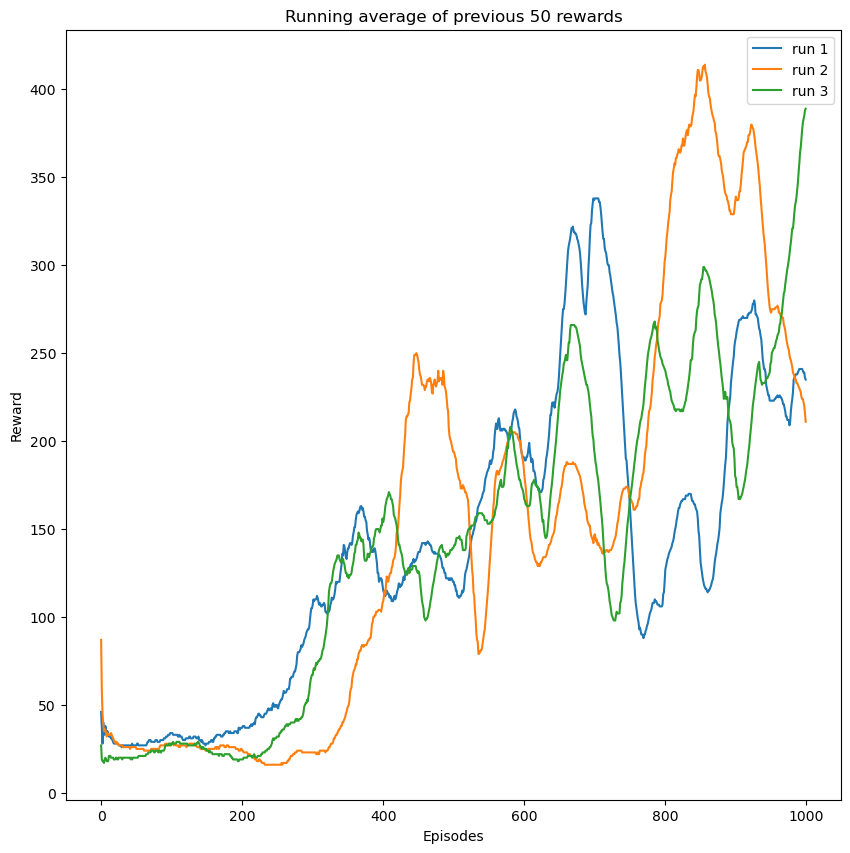

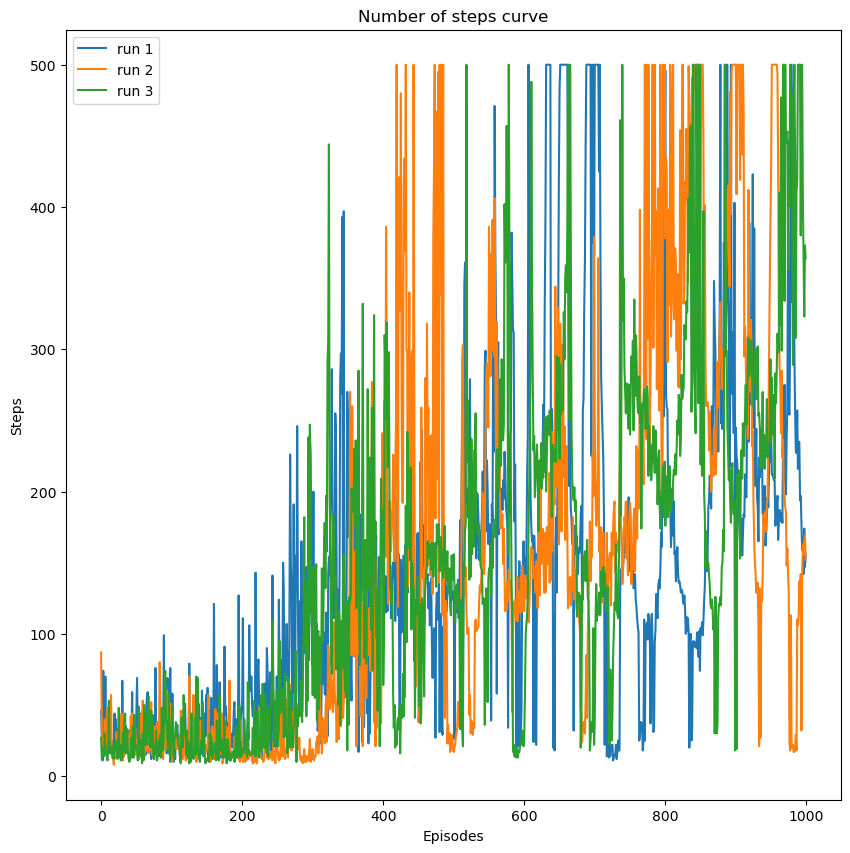

In [ ]:
NUM_HIDDEN = 2
HIDDEN_SIZES = [1024, 1024]
LR = 1e-4
NUM_EPISODES = 1000
AVG_NUM = 50
ENV_NAME = 'CartPole-v1'
SOLVE_CUTOFF = 195.0
STEP = 5

ENV = gym.make(ENV_NAME)
mean_rewards, var_rewards, comp_list, reward_lists, step_lists = do_multiple_runs(env_name=ENV_NAME, num_runs=10)

data = [f'Number of Hidden Layers - {NUM_HIDDEN}', f'Hidden Sizes - {HIDDEN_SIZES}', f'Learning Rate - {LR}', 
        f'Run number of episodes to solve - {comp_list}', f'Mean number of episodes to solve- {np.mean(comp_list)}', 
        f'Number of episodes - {NUM_EPISODES}', f'Environment Name - {ENV_NAME}', f'NSTEP = {STEP}']

fname = f'hl={NUM_HIDDEN}_hs={HIDDEN_SIZES}_lr={LR}_env={ENV_NAME}_numep={NUM_EPISODES}_nstep={STEP}'
os.mkdir(PATH+'/'+fname)
gen_plots_and_save_data(fname, data, mean_rewards, var_rewards, reward_lists, step_lists)

/opt/conda/lib/python3.7/site-packages/gym/core.py:173: DeprecationWarning: WARN: Function `env.seed(seed)` is marked as deprecated and will be removed in the future. Please use `env.reset(seed=seed) instead.
  "Function `env.seed(seed)` is marked as deprecated and will be removed in the future. "


Episode  10 Reward 47.000000 Average Reward 43.000000
Episode  20 Reward 35.000000 Average Reward 29.200000
Episode  30 Reward 24.000000 Average Reward 24.500000
Episode  40 Reward 30.000000 Average Reward 28.200000
Episode  50 Reward 29.000000 Average Reward 44.700000
Episode  60 Reward 33.000000 Average Reward 32.600000
Episode  70 Reward 58.000000 Average Reward 37.700000
Episode  80 Reward 42.000000 Average Reward 47.700000
Episode  90 Reward 24.000000 Average Reward 40.100000
Episode  100 Reward 30.000000 Average Reward 44.700000
Episode  110 Reward 16.000000 Average Reward 42.100000
Episode  120 Reward 48.000000 Average Reward 37.200000
Episode  130 Reward 23.000000 Average Reward 41.300000
Episode  140 Reward 20.000000 Average Reward 22.900000
Episode  150 Reward 31.000000 Average Reward 24.500000
Episode  160 Reward 25.000000 Average Reward 36.500000
Episode  170 Reward 44.000000 Average Reward 38.400000
Episode  180 Reward 231.000000 Average Reward 92.800000
Episode  190 Rewar

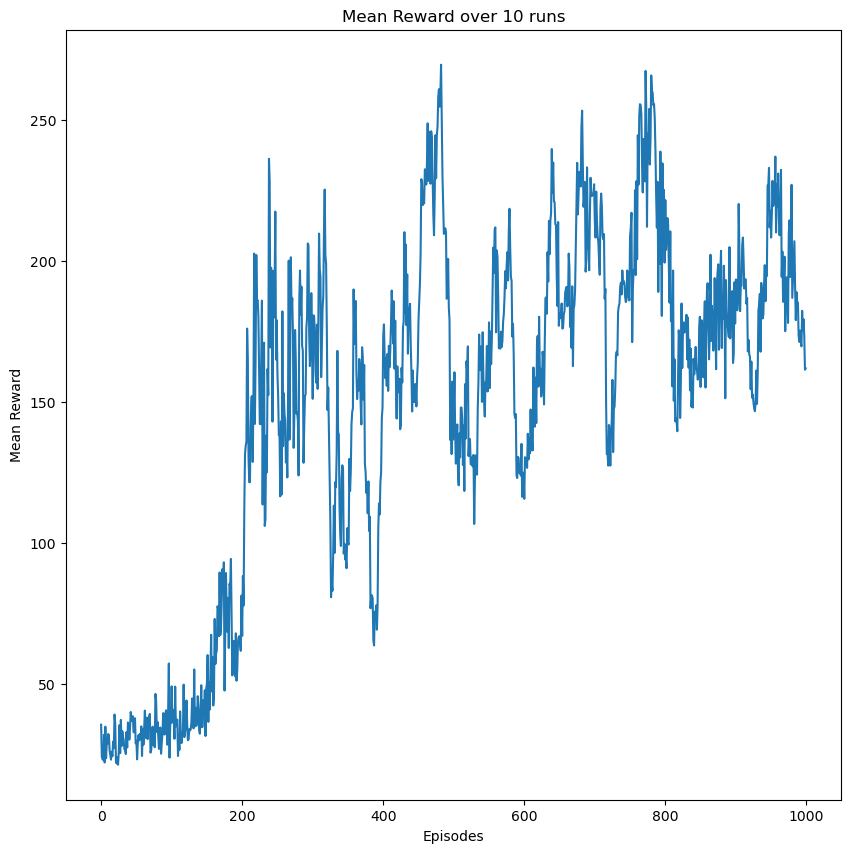

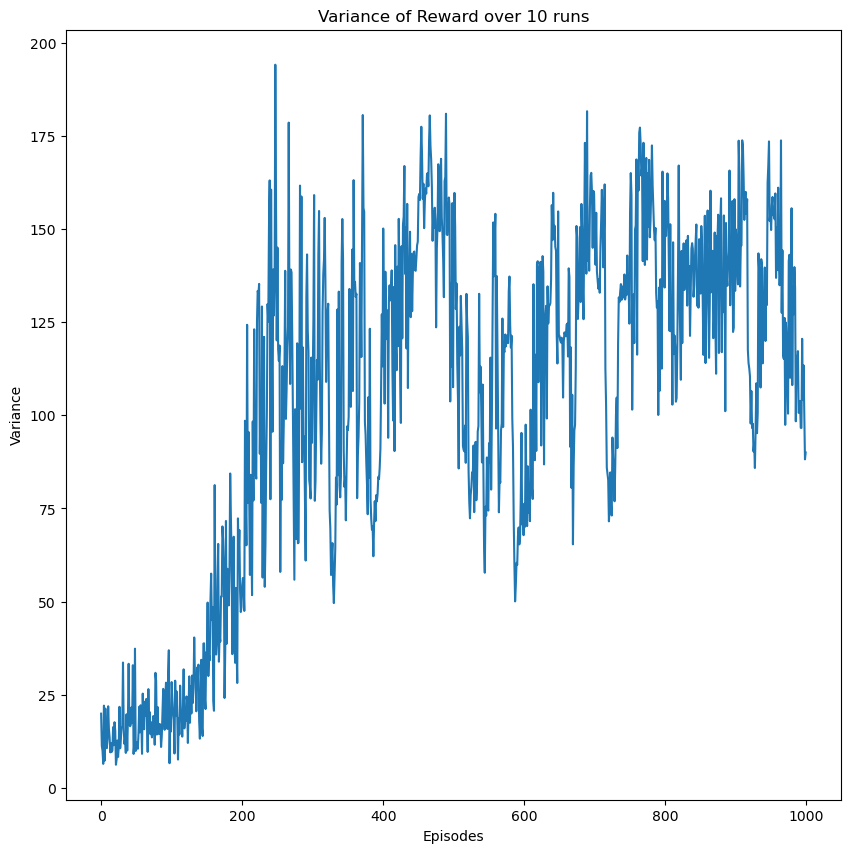

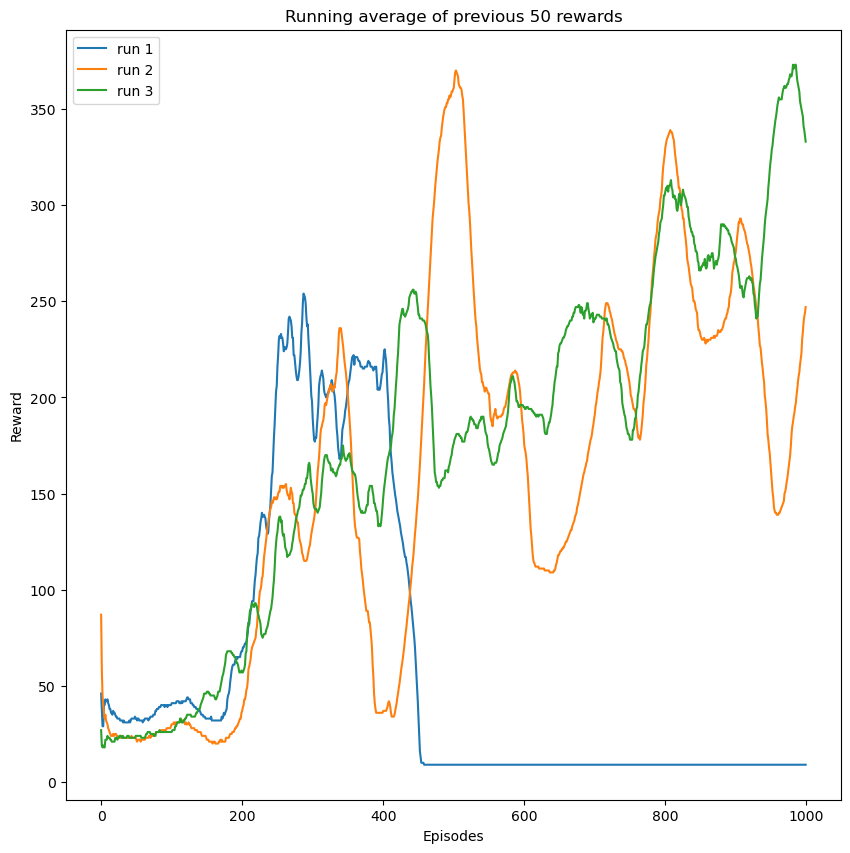

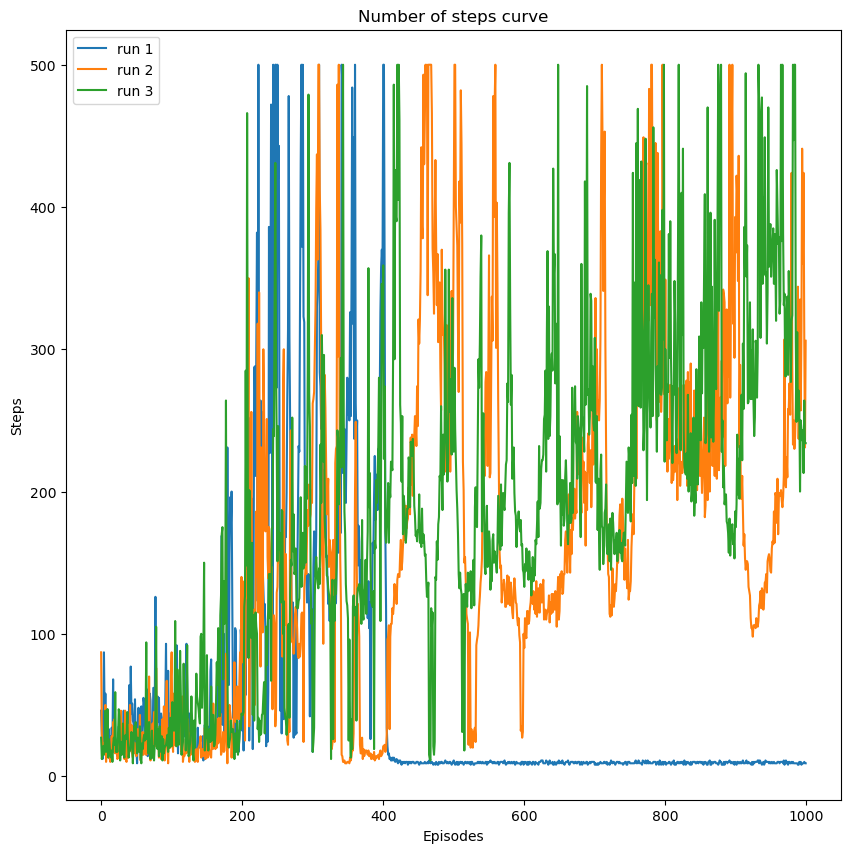

In [ ]:
NUM_HIDDEN = 2
HIDDEN_SIZES = [1024, 1024]
LR = 2e-4
NUM_EPISODES = 1000
AVG_NUM = 50
ENV_NAME = 'CartPole-v1'
SOLVE_CUTOFF = 195.0
STEP = 5

ENV = gym.make(ENV_NAME)
mean_rewards, var_rewards, comp_list, reward_lists, step_lists = do_multiple_runs(env_name=ENV_NAME, num_runs=10)

data = [f'Number of Hidden Layers - {NUM_HIDDEN}', f'Hidden Sizes - {HIDDEN_SIZES}', f'Learning Rate - {LR}', 
        f'Run number of episodes to solve - {comp_list}', f'Mean number of episodes to solve- {np.mean(comp_list)}', 
        f'Number of episodes - {NUM_EPISODES}', f'Environment Name - {ENV_NAME}', f'NSTEP = {STEP}']

fname = f'hl={NUM_HIDDEN}_hs={HIDDEN_SIZES}_lr={LR}_env={ENV_NAME}_numep={NUM_EPISODES}_nstep={STEP}'
os.mkdir(PATH+'/'+fname)
gen_plots_and_save_data(fname, data, mean_rewards, var_rewards, reward_lists, step_lists)

/opt/conda/lib/python3.7/site-packages/gym/core.py:173: DeprecationWarning: WARN: Function `env.seed(seed)` is marked as deprecated and will be removed in the future. Please use `env.reset(seed=seed) instead.
  "Function `env.seed(seed)` is marked as deprecated and will be removed in the future. "


Episode  10 Reward 15.000000 Average Reward 28.800000
Episode  20 Reward 96.000000 Average Reward 35.300000
Episode  30 Reward 14.000000 Average Reward 25.900000
Episode  40 Reward 42.000000 Average Reward 26.100000
Episode  50 Reward 29.000000 Average Reward 34.300000
Episode  60 Reward 18.000000 Average Reward 25.100000
Episode  70 Reward 16.000000 Average Reward 19.900000
Episode  80 Reward 14.000000 Average Reward 24.800000
Episode  90 Reward 18.000000 Average Reward 29.400000
Episode  100 Reward 13.000000 Average Reward 27.400000
Episode  110 Reward 21.000000 Average Reward 30.600000
Episode  120 Reward 21.000000 Average Reward 18.000000
Episode  130 Reward 15.000000 Average Reward 24.200000
Episode  140 Reward 15.000000 Average Reward 29.100000
Episode  150 Reward 20.000000 Average Reward 25.400000
Episode  160 Reward 11.000000 Average Reward 19.500000
Episode  170 Reward 25.000000 Average Reward 24.200000
Episode  180 Reward 28.000000 Average Reward 29.100000
Episode  190 Reward

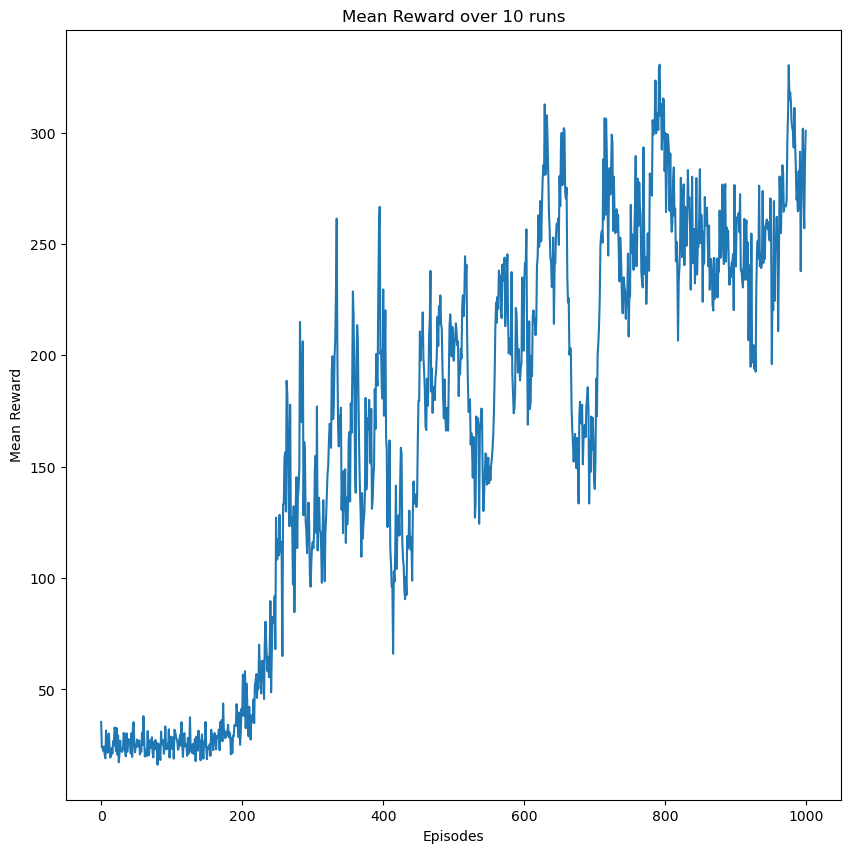

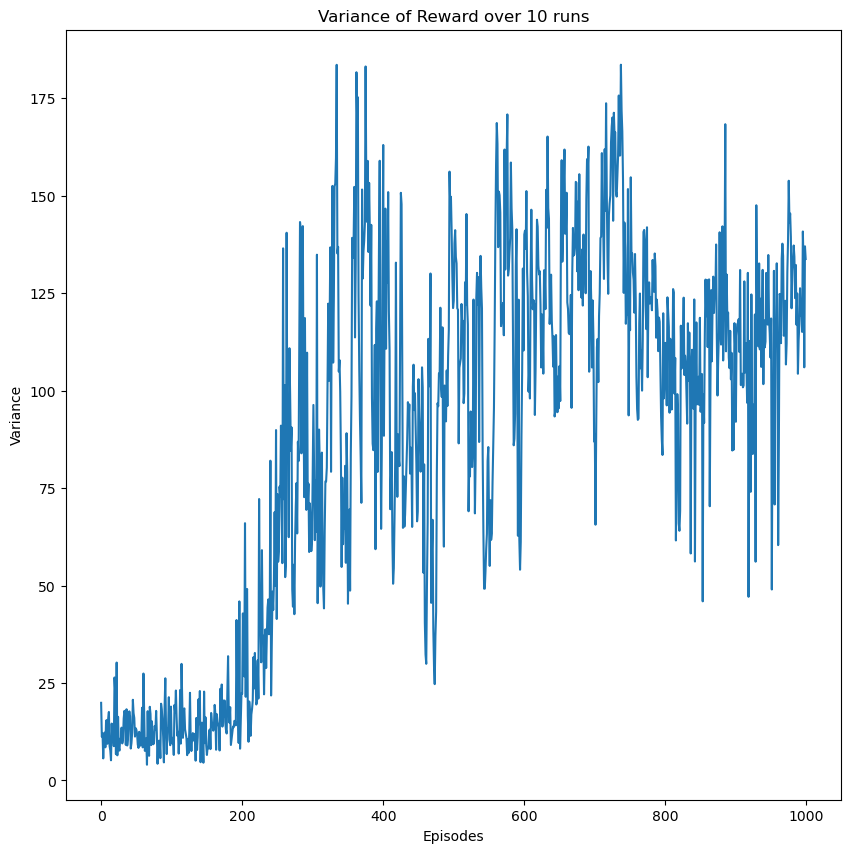

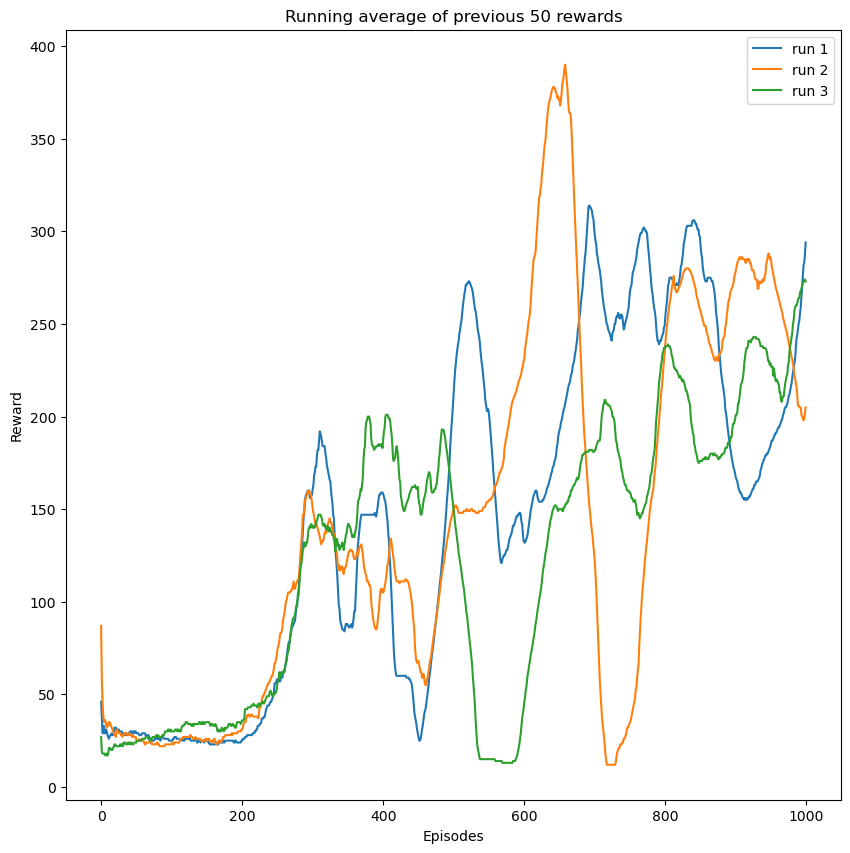

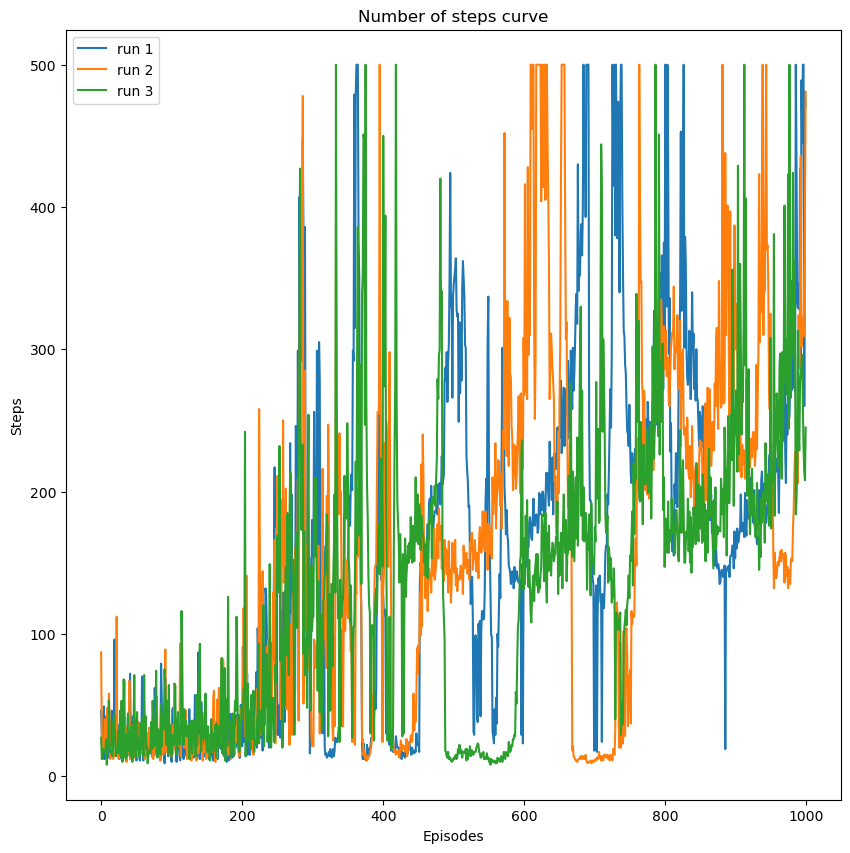

In [ ]:
NUM_HIDDEN = 3
HIDDEN_SIZES = [512, 1024, 512]
LR = 1e-4
NUM_EPISODES = 1000
AVG_NUM = 50
ENV_NAME = 'CartPole-v1'
SOLVE_CUTOFF = 195.0
STEP = 5

ENV = gym.make(ENV_NAME)
mean_rewards, var_rewards, comp_list, reward_lists, step_lists = do_multiple_runs(env_name=ENV_NAME, num_runs=10)

data = [f'Number of Hidden Layers - {NUM_HIDDEN}', f'Hidden Sizes - {HIDDEN_SIZES}', f'Learning Rate - {LR}', 
        f'Run number of episodes to solve - {comp_list}', f'Mean number of episodes to solve- {np.mean(comp_list)}', 
        f'Number of episodes - {NUM_EPISODES}', f'Environment Name - {ENV_NAME}', f'NSTEP = {STEP}']

fname = f'hl={NUM_HIDDEN}_hs={HIDDEN_SIZES}_lr={LR}_env={ENV_NAME}_numep={NUM_EPISODES}_nstep={STEP}'
os.mkdir(PATH+'/'+fname)
gen_plots_and_save_data(fname, data, mean_rewards, var_rewards, reward_lists, step_lists)

#### Acrobot

/opt/conda/lib/python3.7/site-packages/gym/core.py:173: DeprecationWarning: WARN: Function `env.seed(seed)` is marked as deprecated and will be removed in the future. Please use `env.reset(seed=seed) instead.
  "Function `env.seed(seed)` is marked as deprecated and will be removed in the future. "


Episode  10 Reward -500.000000 Average Reward -495.800000
Episode  20 Reward -500.000000 Average Reward -451.900000
Episode  30 Reward -283.000000 Average Reward -335.300000
Episode  40 Reward -500.000000 Average Reward -412.700000
Episode  50 Reward -300.000000 Average Reward -405.500000
Episode  60 Reward -500.000000 Average Reward -436.500000
Episode  70 Reward -500.000000 Average Reward -459.300000
Episode  80 Reward -321.000000 Average Reward -416.100000
Episode  90 Reward -500.000000 Average Reward -448.700000
Episode  100 Reward -500.000000 Average Reward -455.300000
Episode  110 Reward -500.000000 Average Reward -500.000000
Episode  120 Reward -393.000000 Average Reward -460.600000
Episode  130 Reward -419.000000 Average Reward -450.100000
Episode  140 Reward -487.000000 Average Reward -462.300000
Episode  150 Reward -500.000000 Average Reward -487.400000
Episode  160 Reward -473.000000 Average Reward -457.400000
Episode  170 Reward -500.000000 Average Reward -500.000000
Episod

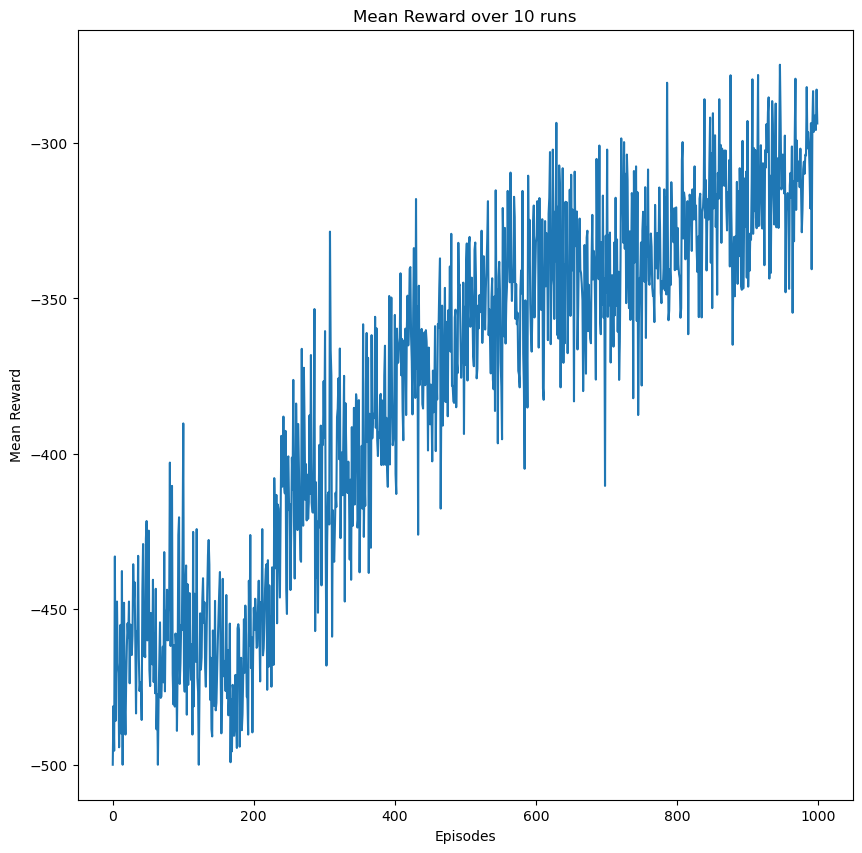

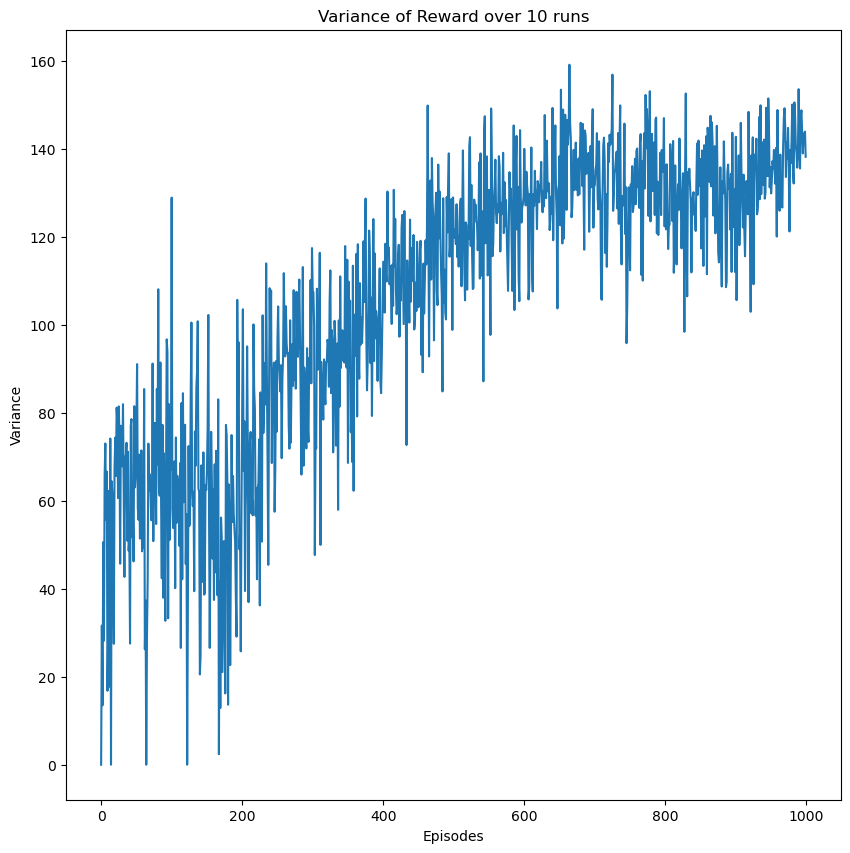

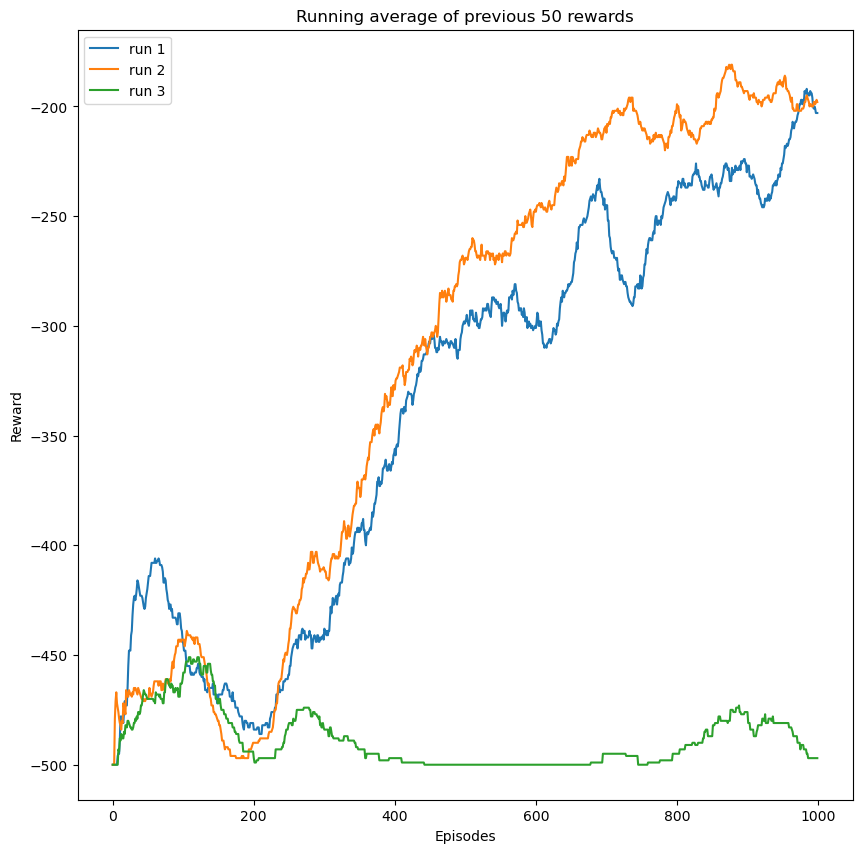

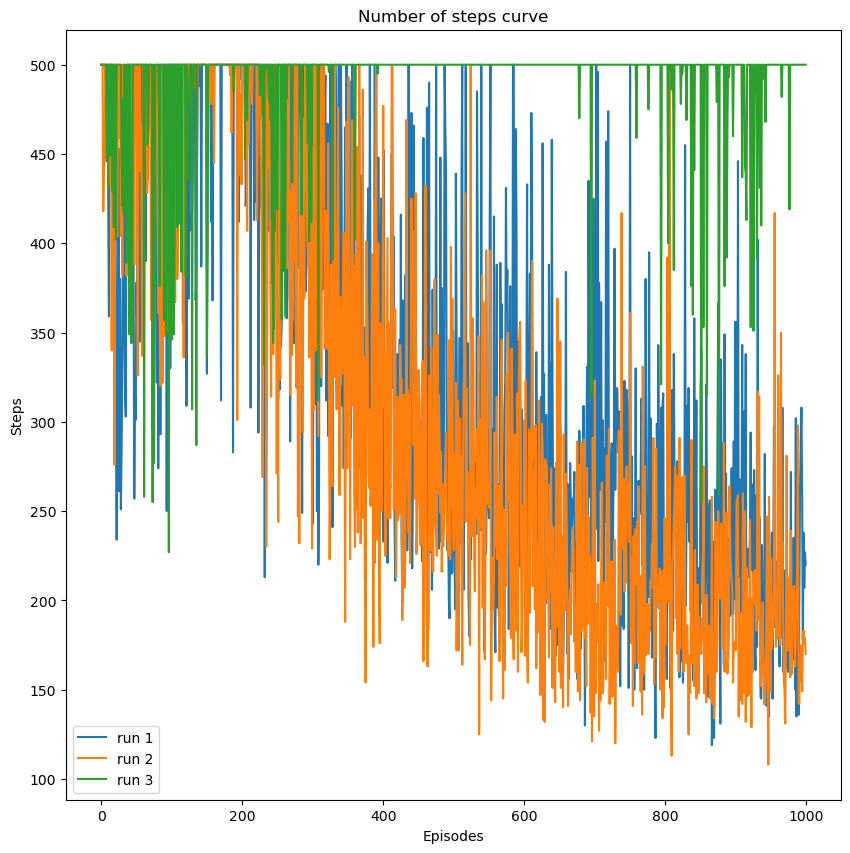

In [ ]:
NUM_HIDDEN = 1
HIDDEN_SIZES = [1024]
LR = 1e-4
NUM_EPISODES = 1000
AVG_NUM = 50
ENV_NAME = 'Acrobot-v1'
SOLVE_CUTOFF = -100.0
STEP = 5

ENV = gym.make(ENV_NAME)
mean_rewards, var_rewards, comp_list, reward_lists, step_lists = do_multiple_runs(env_name=ENV_NAME, num_runs=10)

data = [f'Number of Hidden Layers - {NUM_HIDDEN}', f'Hidden Sizes - {HIDDEN_SIZES}', f'Learning Rate - {LR}', 
        f'Run number of episodes to solve - {comp_list}', f'Mean number of episodes to solve- {np.mean(comp_list)}', 
        f'Number of episodes - {NUM_EPISODES}', f'Environment Name - {ENV_NAME}', f'NSTEP = {STEP}']

fname = f'hl={NUM_HIDDEN}_hs={HIDDEN_SIZES}_lr={LR}_env={ENV_NAME}_numep={NUM_EPISODES}_nstep={STEP}'
os.mkdir(PATH+'/'+fname)
gen_plots_and_save_data(fname, data, mean_rewards, var_rewards, reward_lists, step_lists)

/opt/conda/lib/python3.7/site-packages/gym/core.py:173: DeprecationWarning: WARN: Function `env.seed(seed)` is marked as deprecated and will be removed in the future. Please use `env.reset(seed=seed) instead.
  "Function `env.seed(seed)` is marked as deprecated and will be removed in the future. "


Episode  10 Reward -358.000000 Average Reward -485.800000
Episode  20 Reward -500.000000 Average Reward -453.700000
Episode  30 Reward -500.000000 Average Reward -457.700000
Episode  40 Reward -500.000000 Average Reward -487.600000
Episode  50 Reward -500.000000 Average Reward -463.600000
Episode  60 Reward -347.000000 Average Reward -484.700000
Episode  70 Reward -500.000000 Average Reward -498.700000
Episode  80 Reward -500.000000 Average Reward -453.300000
Episode  90 Reward -321.000000 Average Reward -463.300000
Episode  100 Reward -419.000000 Average Reward -431.100000
Episode  110 Reward -431.000000 Average Reward -485.900000
Episode  120 Reward -500.000000 Average Reward -467.700000
Episode  130 Reward -500.000000 Average Reward -443.700000
Episode  140 Reward -500.000000 Average Reward -463.700000
Episode  150 Reward -441.000000 Average Reward -460.700000
Episode  160 Reward -500.000000 Average Reward -485.200000
Episode  170 Reward -330.000000 Average Reward -417.700000
Episod

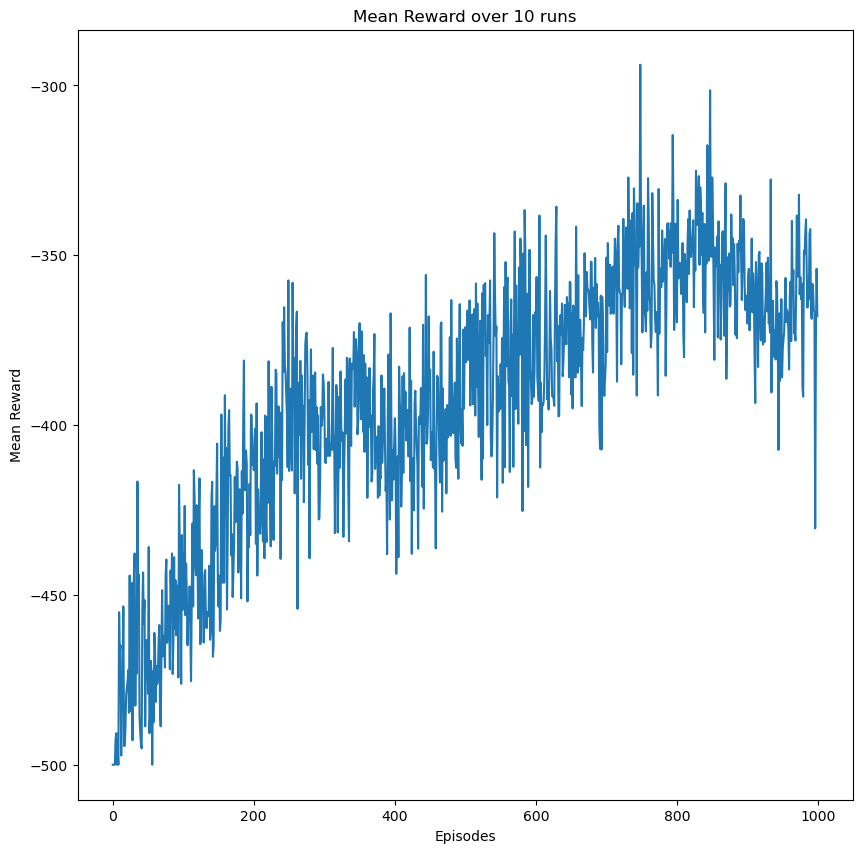

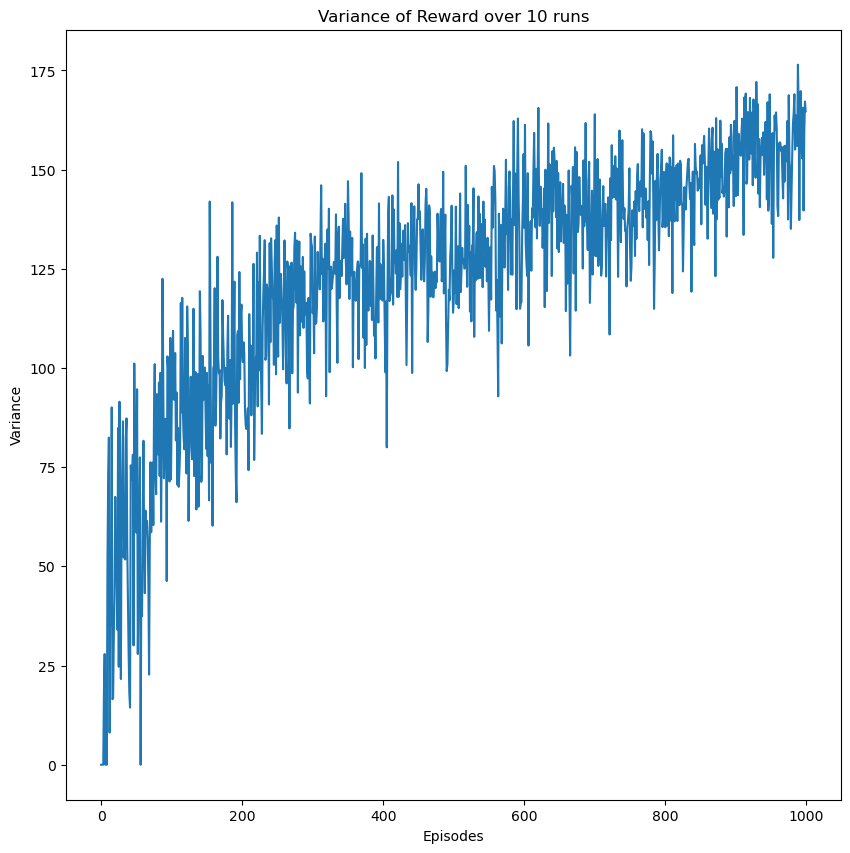

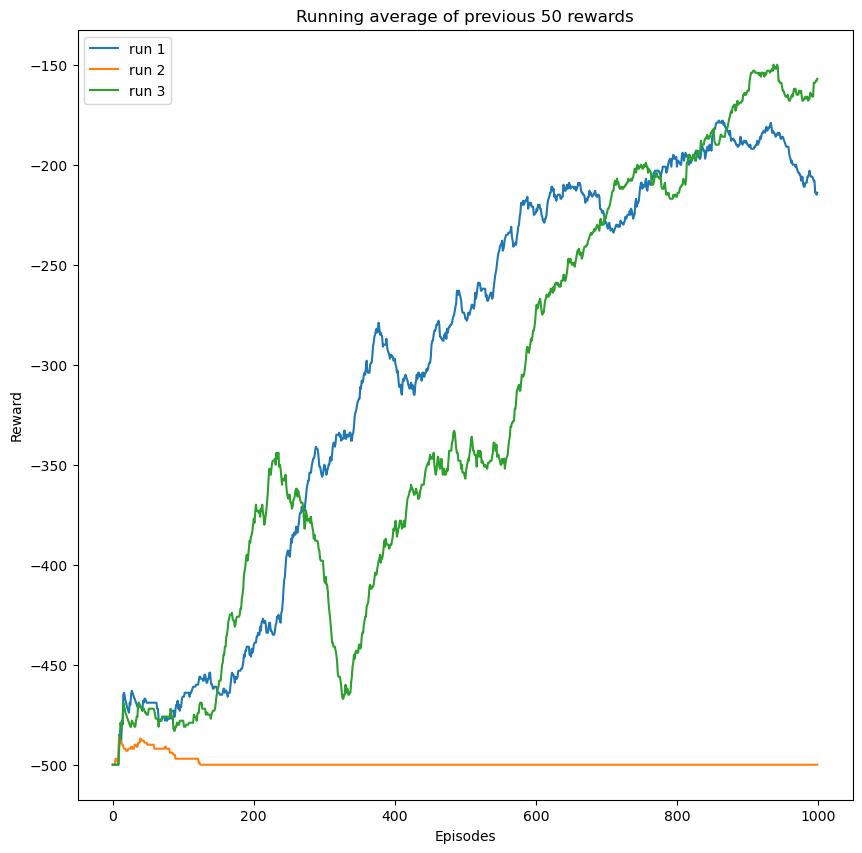

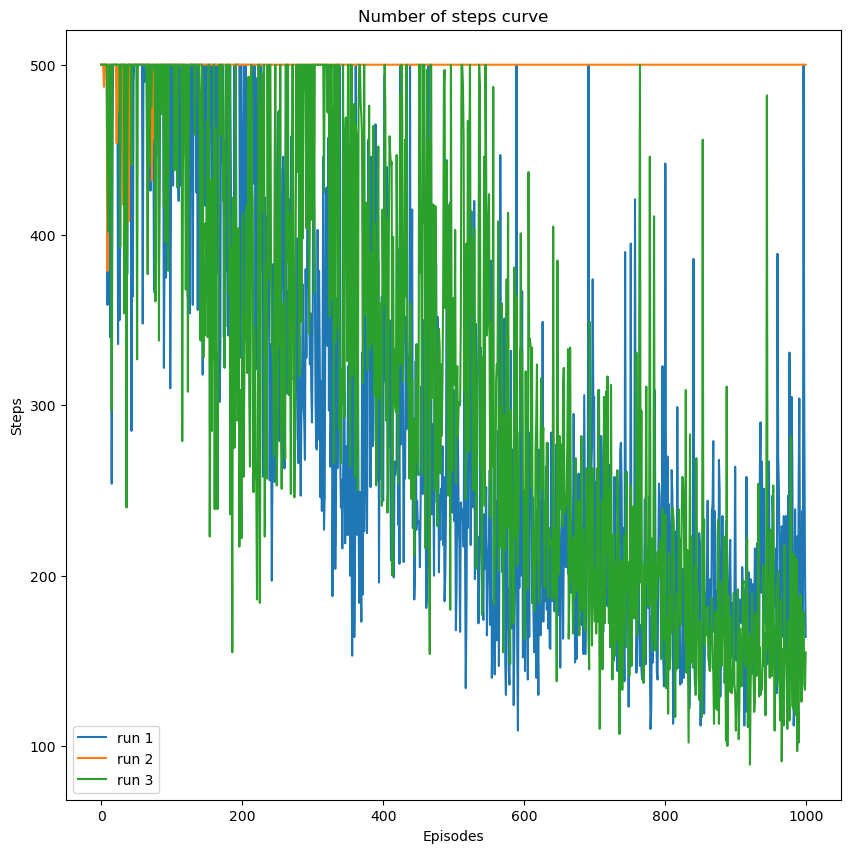

In [ ]:
NUM_HIDDEN = 2
HIDDEN_SIZES = [512, 512]
LR = 0.5e-4
NUM_EPISODES = 1000
AVG_NUM = 50
ENV_NAME = 'Acrobot-v1'
SOLVE_CUTOFF = -100.0
STEP = 5

ENV = gym.make(ENV_NAME)
mean_rewards, var_rewards, comp_list, reward_lists, step_lists = do_multiple_runs(env_name=ENV_NAME, num_runs=10)

data = [f'Number of Hidden Layers - {NUM_HIDDEN}', f'Hidden Sizes - {HIDDEN_SIZES}', f'Learning Rate - {LR}', 
        f'Run number of episodes to solve - {comp_list}', f'Mean number of episodes to solve- {np.mean(comp_list)}', 
        f'Number of episodes - {NUM_EPISODES}', f'Environment Name - {ENV_NAME}', f'NSTEP = {STEP}']

fname = f'hl={NUM_HIDDEN}_hs={HIDDEN_SIZES}_lr={LR}_env={ENV_NAME}_numep={NUM_EPISODES}_nstep={STEP}'
os.mkdir(PATH+'/'+fname)
gen_plots_and_save_data(fname, data, mean_rewards, var_rewards, reward_lists, step_lists)

/opt/conda/lib/python3.7/site-packages/gym/core.py:173: DeprecationWarning: WARN: Function `env.seed(seed)` is marked as deprecated and will be removed in the future. Please use `env.reset(seed=seed) instead.
  "Function `env.seed(seed)` is marked as deprecated and will be removed in the future. "


Episode  10 Reward -500.000000 Average Reward -479.600000
Episode  20 Reward -500.000000 Average Reward -406.300000
Episode  30 Reward -459.000000 Average Reward -454.100000
Episode  40 Reward -500.000000 Average Reward -440.000000
Episode  50 Reward -500.000000 Average Reward -479.900000
Episode  60 Reward -500.000000 Average Reward -500.000000
Episode  70 Reward -500.000000 Average Reward -493.200000
Episode  80 Reward -500.000000 Average Reward -500.000000
Episode  90 Reward -500.000000 Average Reward -492.800000
Episode  100 Reward -500.000000 Average Reward -487.700000
Episode  110 Reward -500.000000 Average Reward -439.800000
Episode  120 Reward -297.000000 Average Reward -402.600000
Episode  130 Reward -448.000000 Average Reward -380.700000
Episode  140 Reward -361.000000 Average Reward -358.200000
Episode  150 Reward -232.000000 Average Reward -376.900000
Episode  160 Reward -347.000000 Average Reward -281.800000
Episode  170 Reward -289.000000 Average Reward -283.300000
Episod

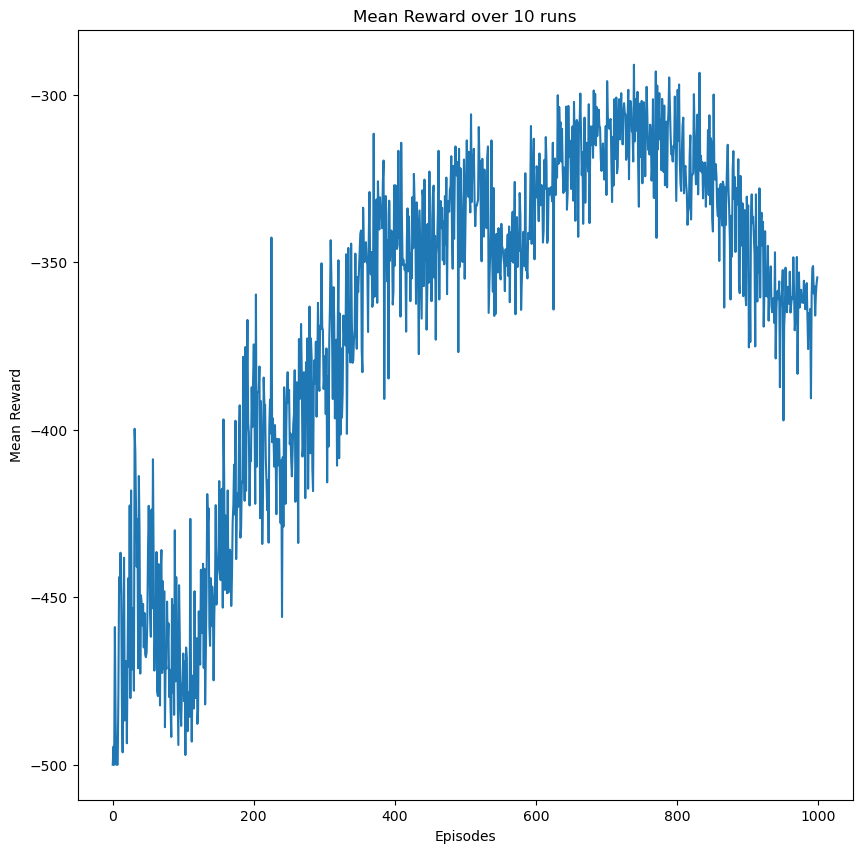

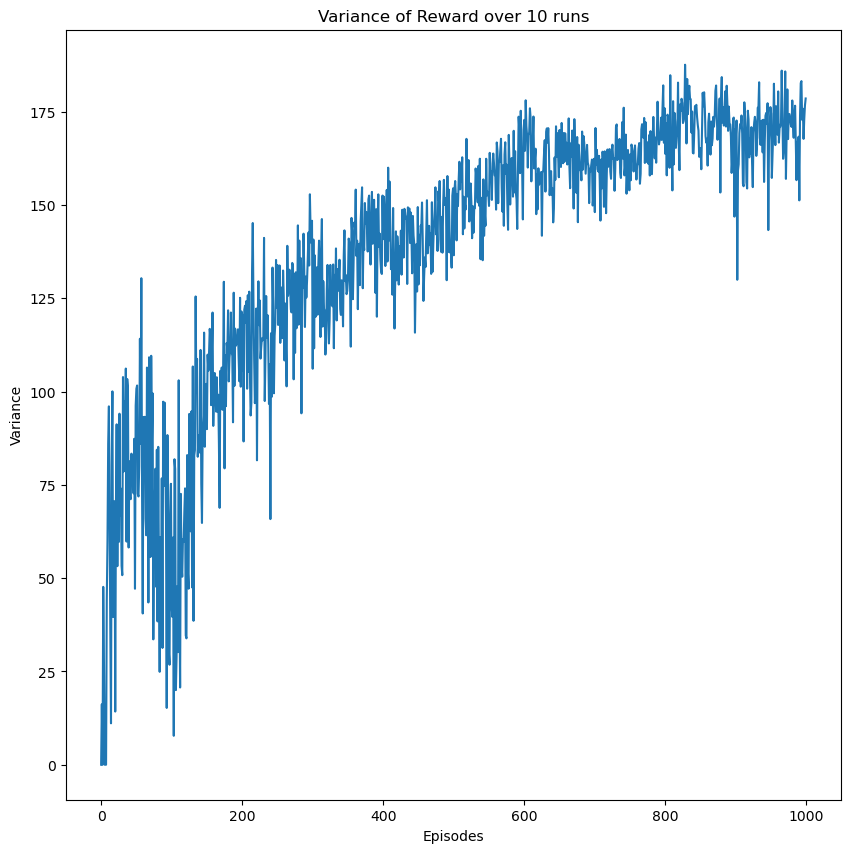

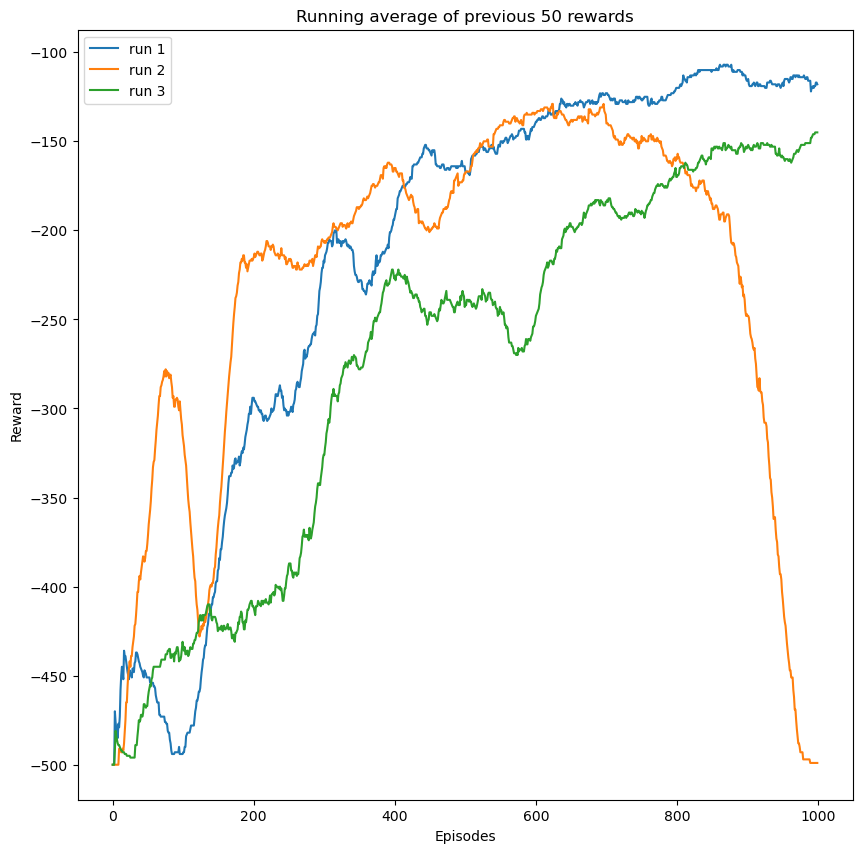

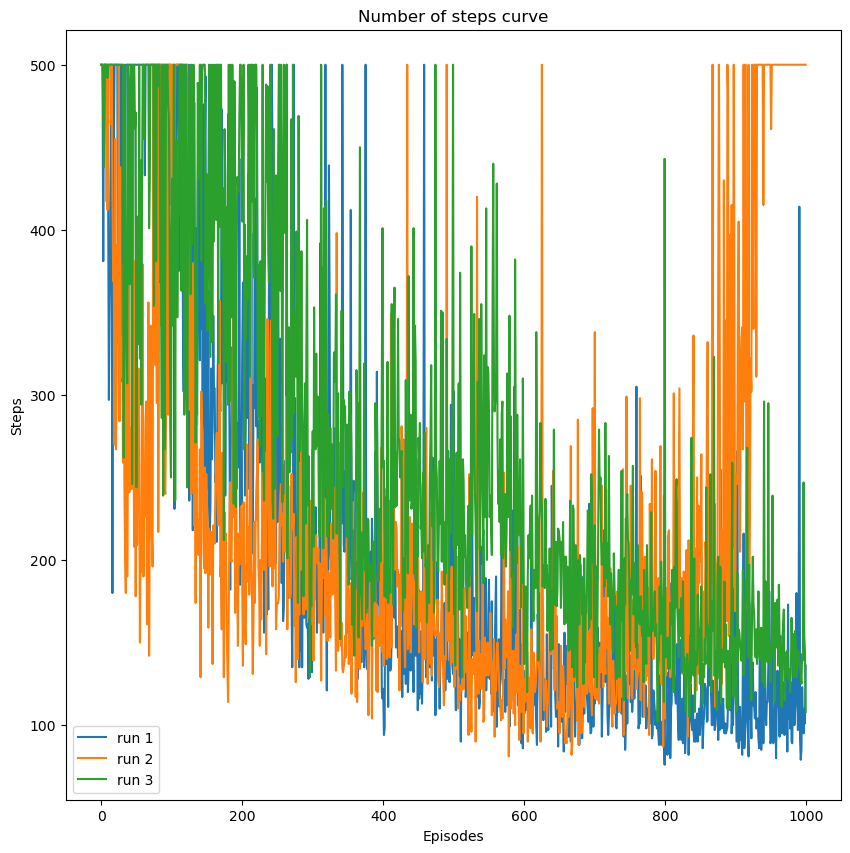

In [ ]:
NUM_HIDDEN = 2
HIDDEN_SIZES = [512, 512]
LR = 1e-4
NUM_EPISODES = 1000
AVG_NUM = 50
ENV_NAME = 'Acrobot-v1'
SOLVE_CUTOFF = -100.0
STEP = 5

ENV = gym.make(ENV_NAME)
mean_rewards, var_rewards, comp_list, reward_lists, step_lists = do_multiple_runs(env_name=ENV_NAME, num_runs=10)

data = [f'Number of Hidden Layers - {NUM_HIDDEN}', f'Hidden Sizes - {HIDDEN_SIZES}', f'Learning Rate - {LR}', 
        f'Run number of episodes to solve - {comp_list}', f'Mean number of episodes to solve- {np.mean(comp_list)}', 
        f'Number of episodes - {NUM_EPISODES}', f'Environment Name - {ENV_NAME}', f'NSTEP = {STEP}']

fname = f'hl={NUM_HIDDEN}_hs={HIDDEN_SIZES}_lr={LR}_env={ENV_NAME}_numep={NUM_EPISODES}_nstep={STEP}'
os.mkdir(PATH+'/'+fname)
gen_plots_and_save_data(fname, data, mean_rewards, var_rewards, reward_lists, step_lists)

/opt/conda/lib/python3.7/site-packages/gym/core.py:173: DeprecationWarning: WARN: Function `env.seed(seed)` is marked as deprecated and will be removed in the future. Please use `env.reset(seed=seed) instead.
  "Function `env.seed(seed)` is marked as deprecated and will be removed in the future. "


Episode  10 Reward -281.000000 Average Reward -437.900000
Episode  20 Reward -500.000000 Average Reward -429.700000
Episode  30 Reward -319.000000 Average Reward -423.500000
Episode  40 Reward -243.000000 Average Reward -294.000000
Episode  50 Reward -186.000000 Average Reward -217.600000
Episode  60 Reward -202.000000 Average Reward -213.800000
Episode  70 Reward -149.000000 Average Reward -186.500000
Episode  80 Reward -204.000000 Average Reward -220.500000
Episode  90 Reward -129.000000 Average Reward -201.900000
Episode  100 Reward -238.000000 Average Reward -228.000000
Episode  110 Reward -145.000000 Average Reward -228.600000
Episode  120 Reward -289.000000 Average Reward -234.400000
Episode  130 Reward -183.000000 Average Reward -229.000000
Episode  140 Reward -104.000000 Average Reward -203.800000
Episode  150 Reward -182.000000 Average Reward -199.700000
Episode  160 Reward -158.000000 Average Reward -210.000000
Episode  170 Reward -174.000000 Average Reward -208.000000
Episod

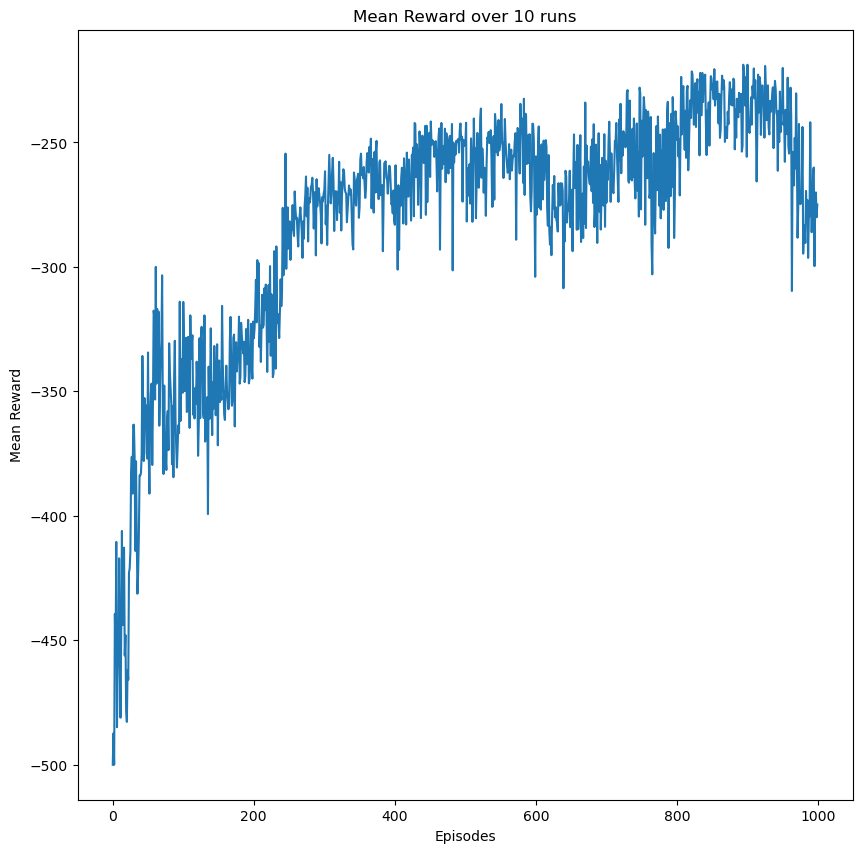

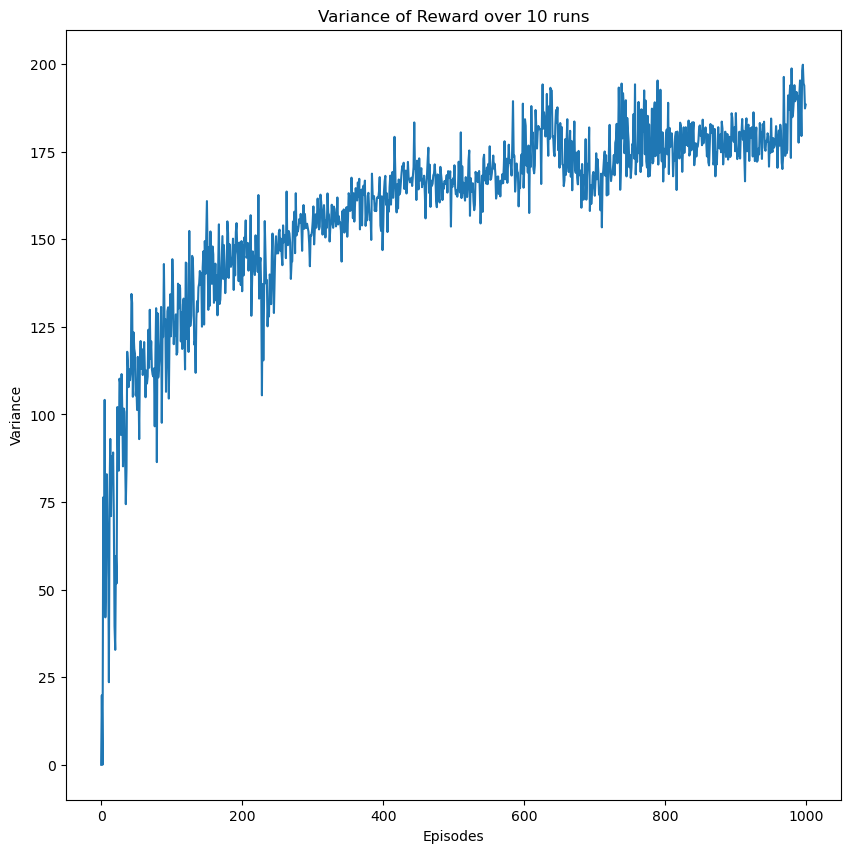

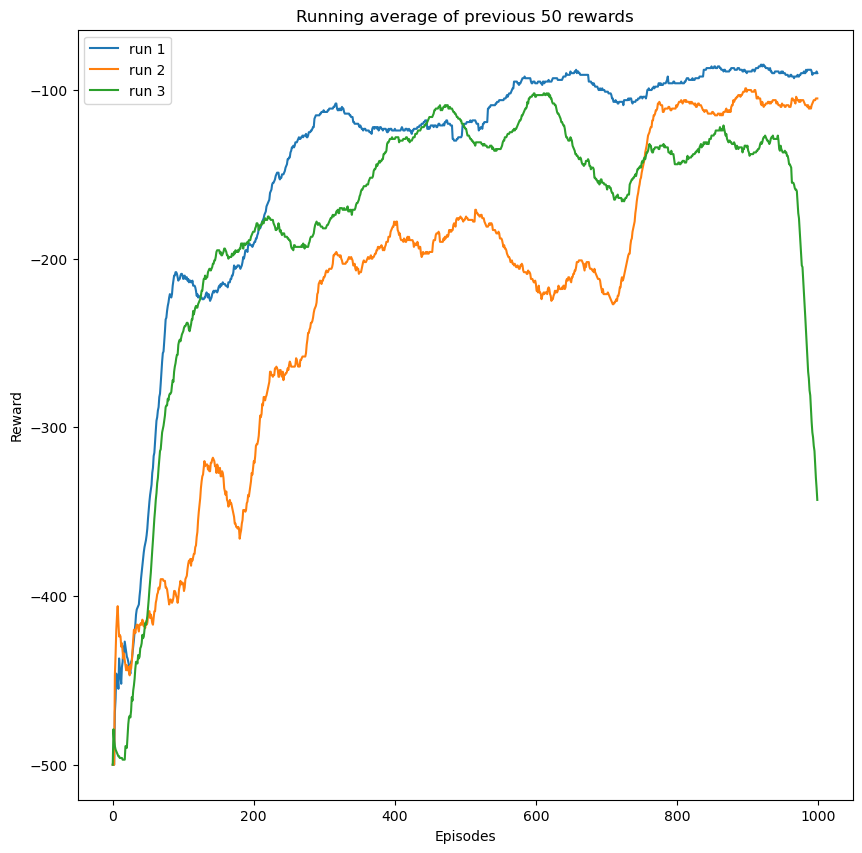

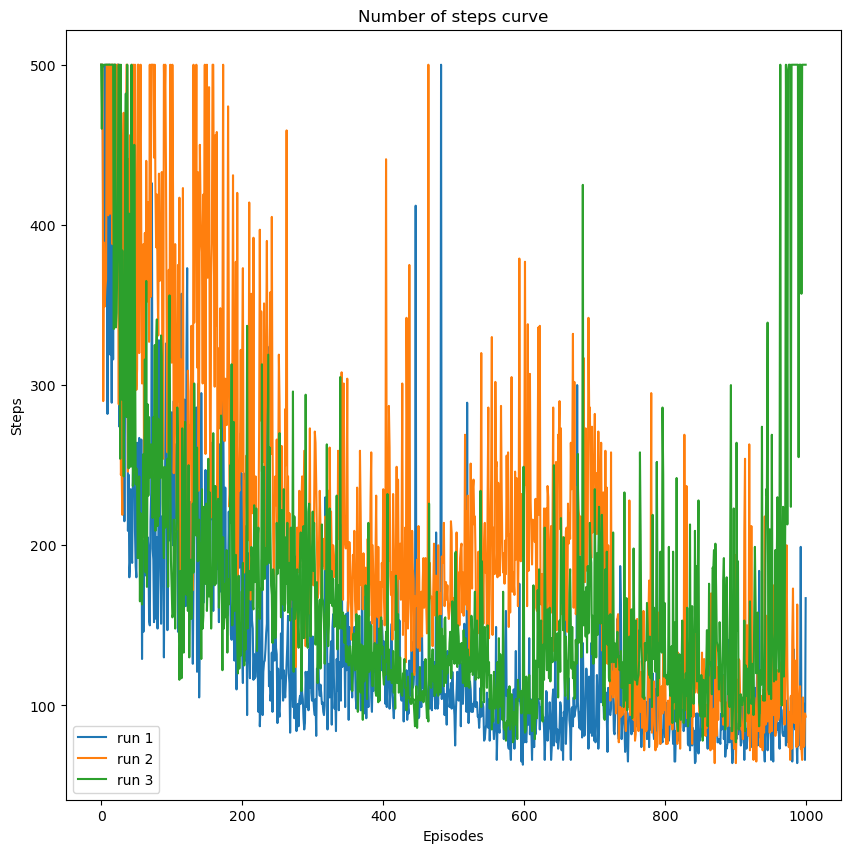

In [ ]:
NUM_HIDDEN = 2
HIDDEN_SIZES = [512, 512]
LR = 2e-4
NUM_EPISODES = 1000
AVG_NUM = 50
ENV_NAME = 'Acrobot-v1'
SOLVE_CUTOFF = -100.0
STEP = 5

ENV = gym.make(ENV_NAME)
mean_rewards, var_rewards, comp_list, reward_lists, step_lists = do_multiple_runs(env_name=ENV_NAME, num_runs=10)

data = [f'Number of Hidden Layers - {NUM_HIDDEN}', f'Hidden Sizes - {HIDDEN_SIZES}', f'Learning Rate - {LR}', 
        f'Run number of episodes to solve - {comp_list}', f'Mean number of episodes to solve- {np.mean(comp_list)}', 
        f'Number of episodes - {NUM_EPISODES}', f'Environment Name - {ENV_NAME}', f'NSTEP = {STEP}']

fname = f'hl={NUM_HIDDEN}_hs={HIDDEN_SIZES}_lr={LR}_env={ENV_NAME}_numep={NUM_EPISODES}_nstep={STEP}'
os.mkdir(PATH+'/'+fname)
gen_plots_and_save_data(fname, data, mean_rewards, var_rewards, reward_lists, step_lists)

Episode  10 Reward -492.000000 Average Reward -487.500000
Episode  20 Reward -402.000000 Average Reward -371.900000
Episode  30 Reward -330.000000 Average Reward -387.800000
Episode  40 Reward -500.000000 Average Reward -434.200000
Episode  50 Reward -500.000000 Average Reward -491.700000
Episode  60 Reward -500.000000 Average Reward -500.000000
Episode  70 Reward -500.000000 Average Reward -500.000000
Episode  80 Reward -500.000000 Average Reward -500.000000
Episode  90 Reward -319.000000 Average Reward -467.600000
Episode  100 Reward -483.000000 Average Reward -454.100000
Episode  110 Reward -380.000000 Average Reward -361.100000
Episode  120 Reward -374.000000 Average Reward -347.000000
Episode  130 Reward -418.000000 Average Reward -434.200000
Episode  140 Reward -500.000000 Average Reward -430.300000
Episode  150 Reward -425.000000 Average Reward -466.200000
Episode  160 Reward -500.000000 Average Reward -458.500000
Episode  170 Reward -499.000000 Average Reward -468.800000
Episod

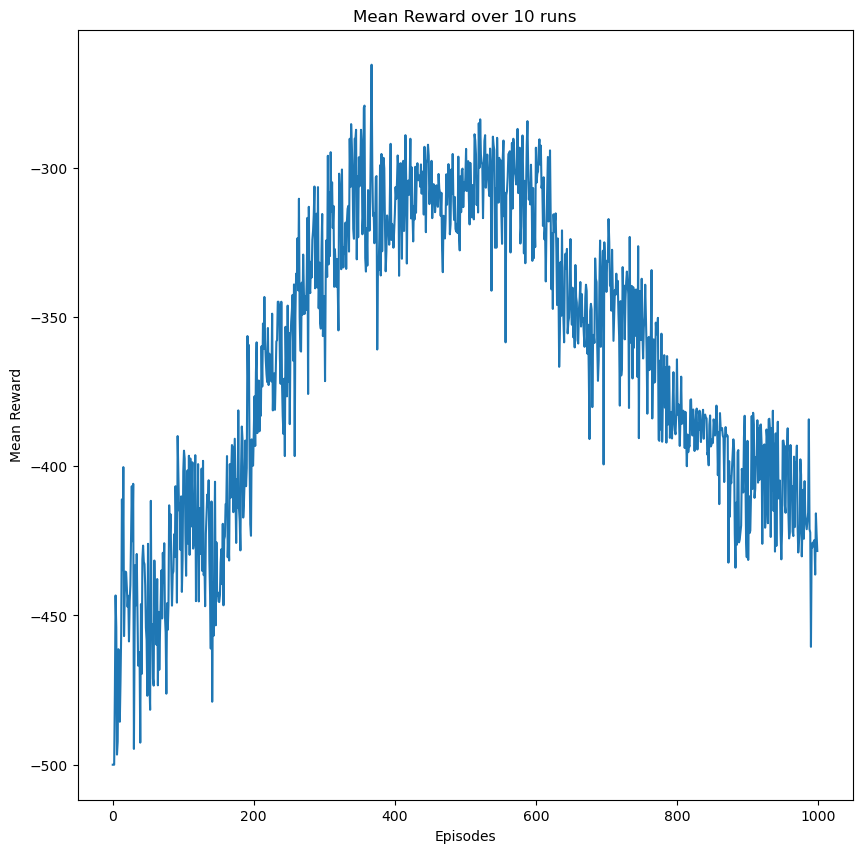

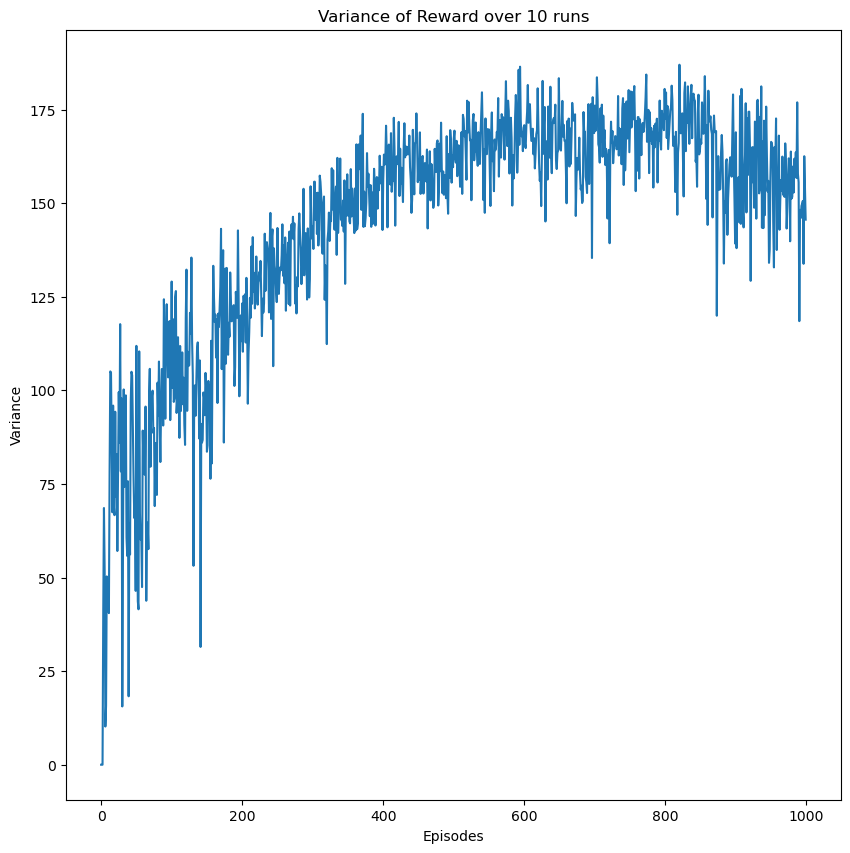

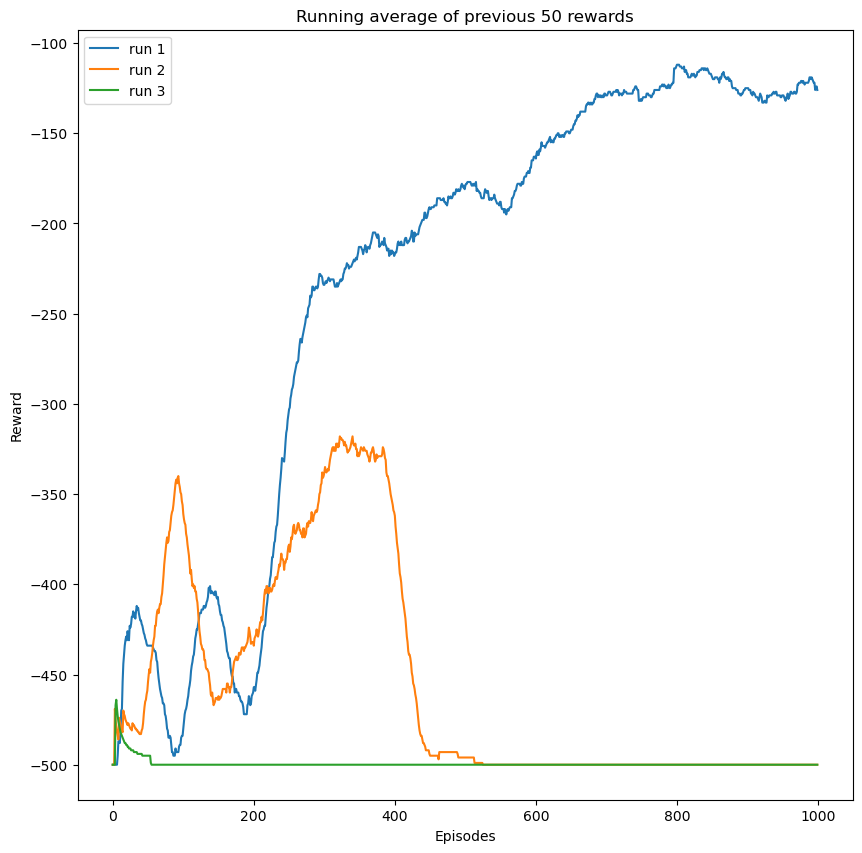

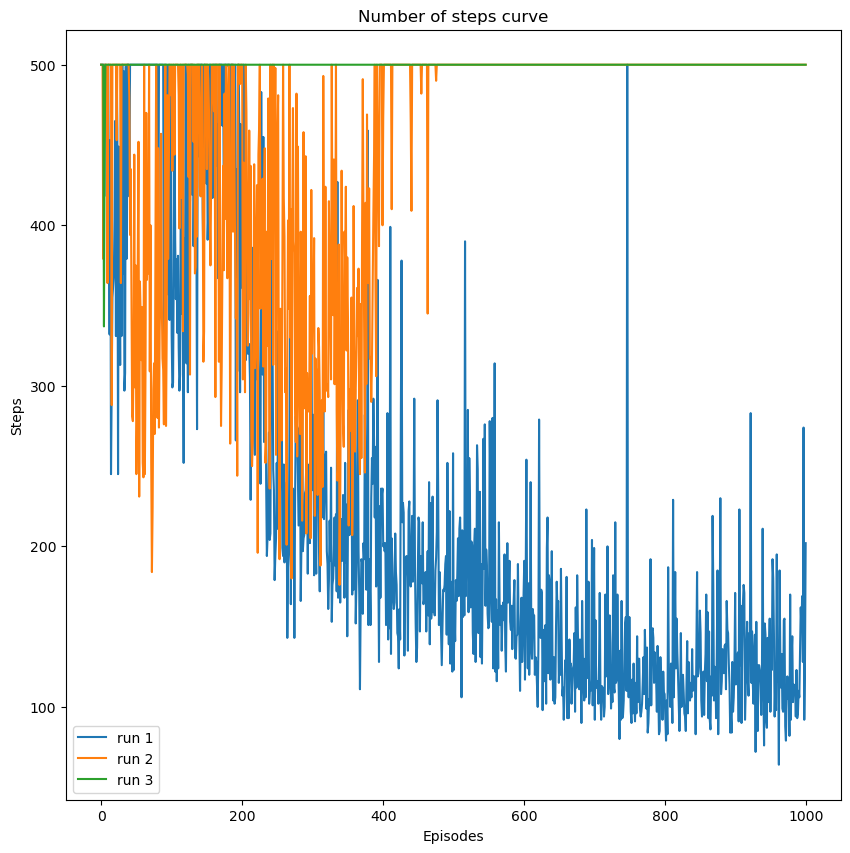

In [ ]:
NUM_HIDDEN = 2
HIDDEN_SIZES = [1024, 512]
LR = 1e-4
NUM_EPISODES = 1000
AVG_NUM = 50
ENV_NAME = 'Acrobot-v1'
SOLVE_CUTOFF = -100.0
STEP = 5

ENV = gym.make(ENV_NAME)
mean_rewards, var_rewards, comp_list, reward_lists, step_lists = do_multiple_runs(env_name=ENV_NAME, num_runs=10)

data = [f'Number of Hidden Layers - {NUM_HIDDEN}', f'Hidden Sizes - {HIDDEN_SIZES}', f'Learning Rate - {LR}', 
        f'Run number of episodes to solve - {comp_list}', f'Mean number of episodes to solve- {np.mean(comp_list)}', 
        f'Number of episodes - {NUM_EPISODES}', f'Environment Name - {ENV_NAME}', f'NSTEP = {STEP}']

fname = f'hl={NUM_HIDDEN}_hs={HIDDEN_SIZES}_lr={LR}_env={ENV_NAME}_numep={NUM_EPISODES}_nstep={STEP}'
os.mkdir(PATH+'/'+fname)
gen_plots_and_save_data(fname, data, mean_rewards, var_rewards, reward_lists, step_lists)

/opt/conda/lib/python3.7/site-packages/gym/core.py:173: DeprecationWarning: WARN: Function `env.seed(seed)` is marked as deprecated and will be removed in the future. Please use `env.reset(seed=seed) instead.
  "Function `env.seed(seed)` is marked as deprecated and will be removed in the future. "


Episode  10 Reward -500.000000 Average Reward -491.900000
Episode  20 Reward -180.000000 Average Reward -298.800000
Episode  30 Reward -191.000000 Average Reward -263.300000
Episode  40 Reward -260.000000 Average Reward -257.600000
Episode  50 Reward -244.000000 Average Reward -229.200000
Episode  60 Reward -145.000000 Average Reward -187.800000
Episode  70 Reward -188.000000 Average Reward -197.800000
Episode  80 Reward -351.000000 Average Reward -196.200000
Episode  90 Reward -231.000000 Average Reward -190.600000
Episode  100 Reward -167.000000 Average Reward -221.000000
Episode  110 Reward -196.000000 Average Reward -230.000000
Episode  120 Reward -247.000000 Average Reward -229.100000
Episode  130 Reward -159.000000 Average Reward -230.200000
Episode  140 Reward -167.000000 Average Reward -195.600000
Episode  150 Reward -285.000000 Average Reward -198.800000
Episode  160 Reward -156.000000 Average Reward -183.200000
Episode  170 Reward -143.000000 Average Reward -169.600000
Episod

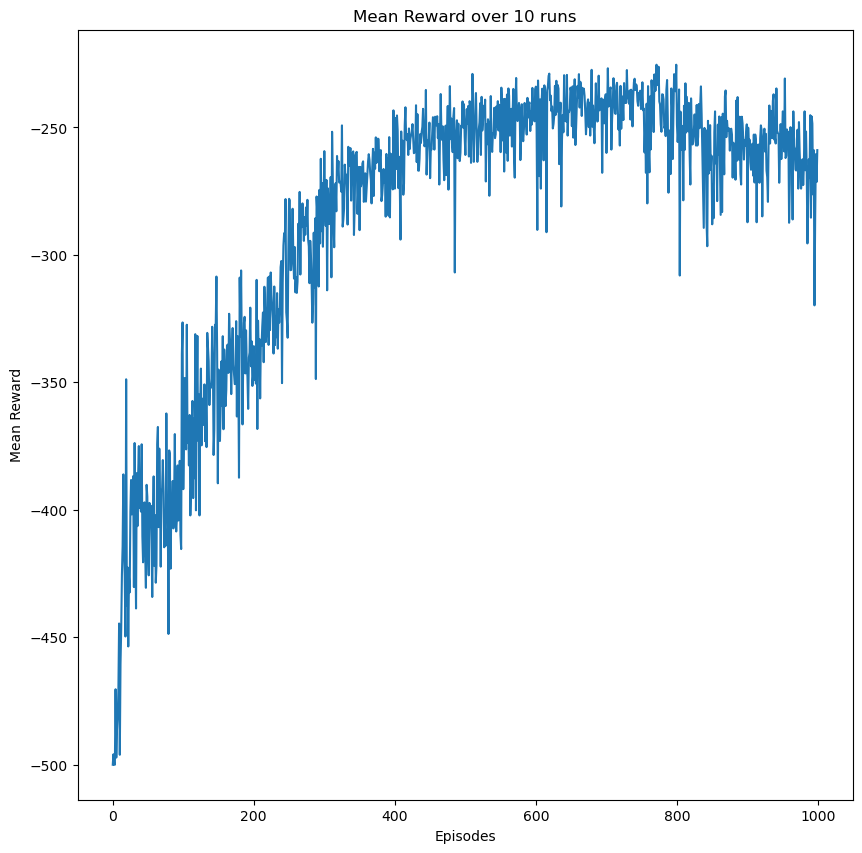

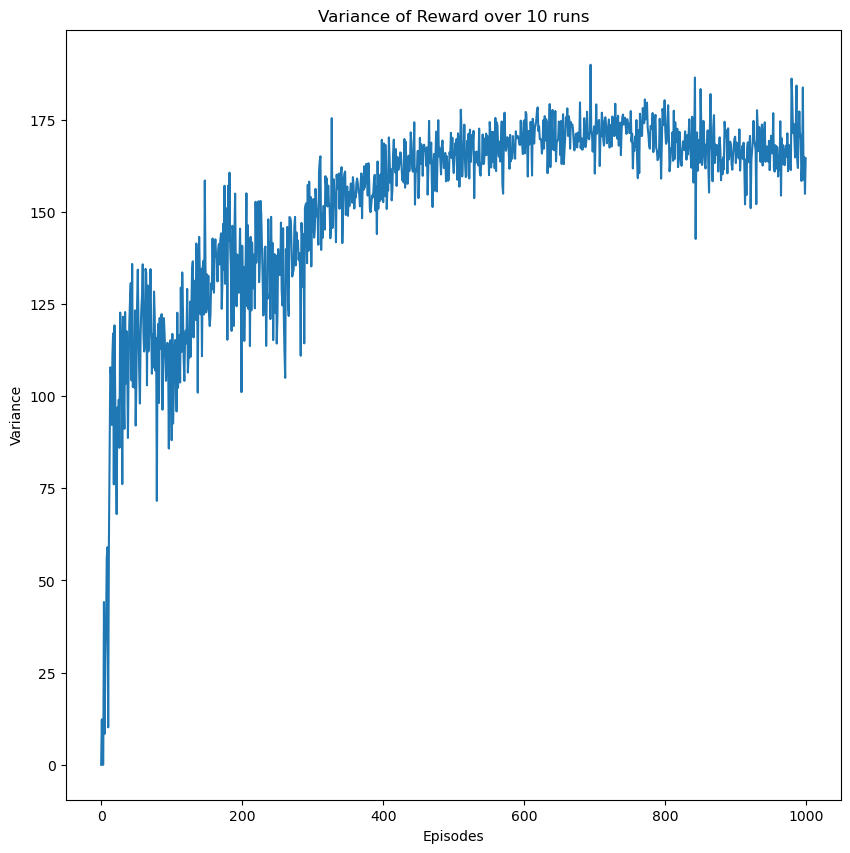

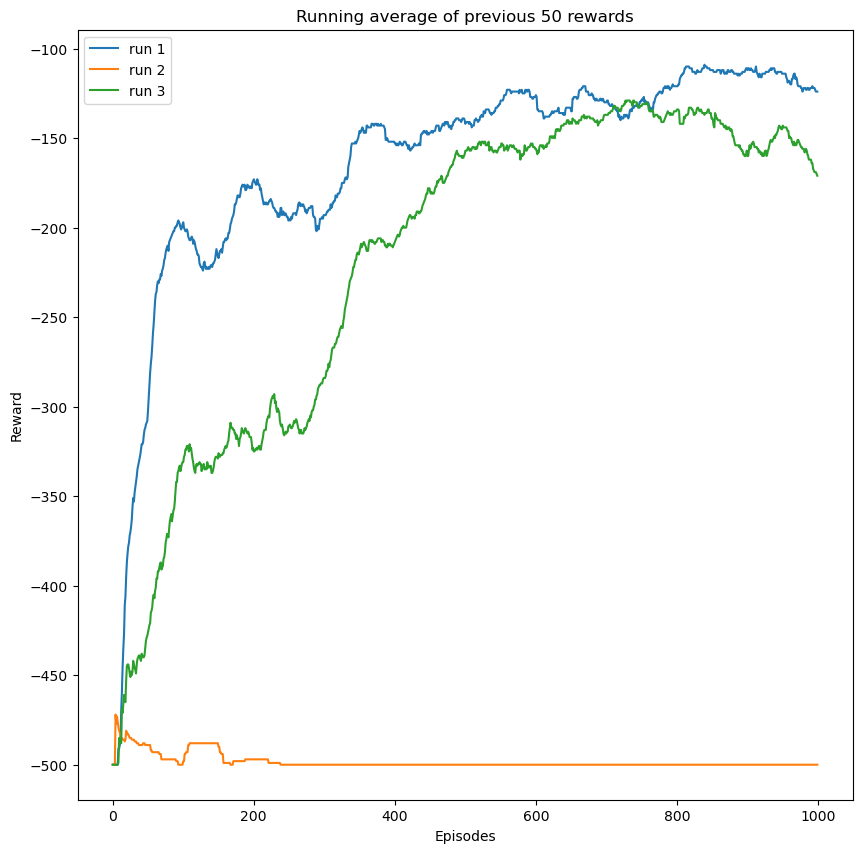

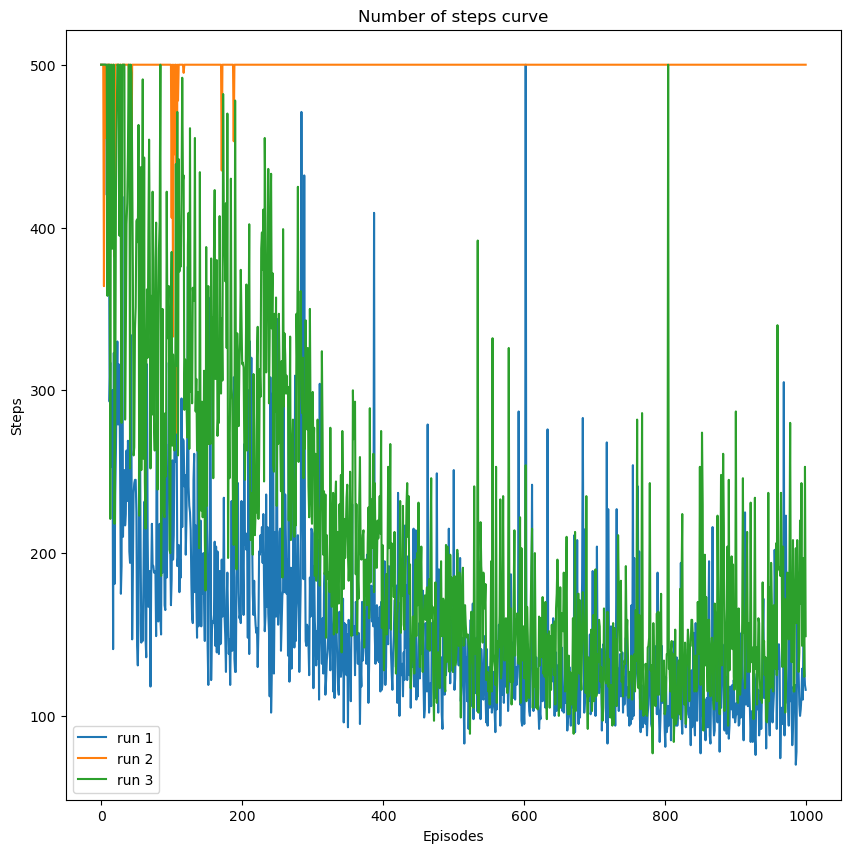

In [ ]:
NUM_HIDDEN = 2
HIDDEN_SIZES = [1024, 1024]
LR = 0.5e-4
NUM_EPISODES = 1000
AVG_NUM = 50
ENV_NAME = 'Acrobot-v1'
SOLVE_CUTOFF = -100.0
STEP = 5

ENV = gym.make(ENV_NAME)
mean_rewards, var_rewards, comp_list, reward_lists, step_lists = do_multiple_runs(env_name=ENV_NAME, num_runs=10)

data = [f'Number of Hidden Layers - {NUM_HIDDEN}', f'Hidden Sizes - {HIDDEN_SIZES}', f'Learning Rate - {LR}', 
        f'Run number of episodes to solve - {comp_list}', f'Mean number of episodes to solve- {np.mean(comp_list)}', 
        f'Number of episodes - {NUM_EPISODES}', f'Environment Name - {ENV_NAME}', f'NSTEP = {STEP}']

fname = f'hl={NUM_HIDDEN}_hs={HIDDEN_SIZES}_lr={LR}_env={ENV_NAME}_numep={NUM_EPISODES}_nstep={STEP}'
os.mkdir(PATH+'/'+fname)
gen_plots_and_save_data(fname, data, mean_rewards, var_rewards, reward_lists, step_lists)

/opt/conda/lib/python3.7/site-packages/gym/core.py:173: DeprecationWarning: WARN: Function `env.seed(seed)` is marked as deprecated and will be removed in the future. Please use `env.reset(seed=seed) instead.
  "Function `env.seed(seed)` is marked as deprecated and will be removed in the future. "


Episode  10 Reward -334.000000 Average Reward -390.600000
Episode  20 Reward -245.000000 Average Reward -300.200000
Episode  30 Reward -422.000000 Average Reward -330.100000
Episode  40 Reward -227.000000 Average Reward -274.400000
Episode  50 Reward -405.000000 Average Reward -302.300000
Episode  60 Reward -500.000000 Average Reward -437.300000
Episode  70 Reward -265.000000 Average Reward -422.400000
Episode  80 Reward -500.000000 Average Reward -420.200000
Episode  90 Reward -500.000000 Average Reward -500.000000
Episode  100 Reward -500.000000 Average Reward -500.000000
Episode  110 Reward -500.000000 Average Reward -500.000000
Episode  120 Reward -500.000000 Average Reward -500.000000
Episode  130 Reward -500.000000 Average Reward -500.000000
Episode  140 Reward -500.000000 Average Reward -500.000000
Episode  150 Reward -500.000000 Average Reward -500.000000
Episode  160 Reward -500.000000 Average Reward -500.000000
Episode  170 Reward -500.000000 Average Reward -500.000000
Episod

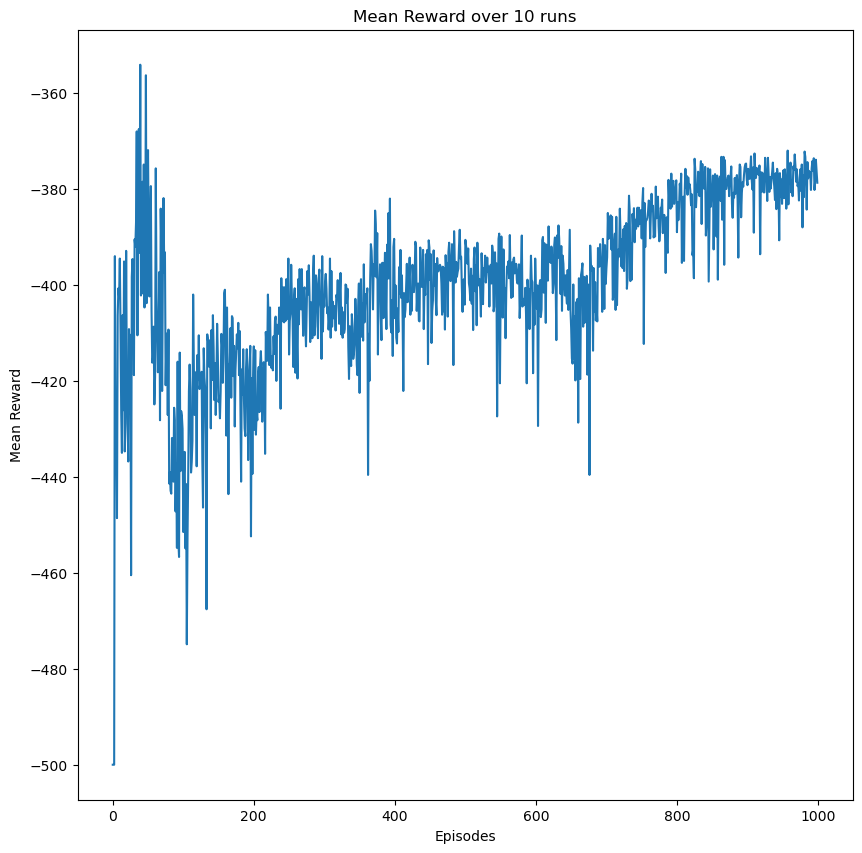

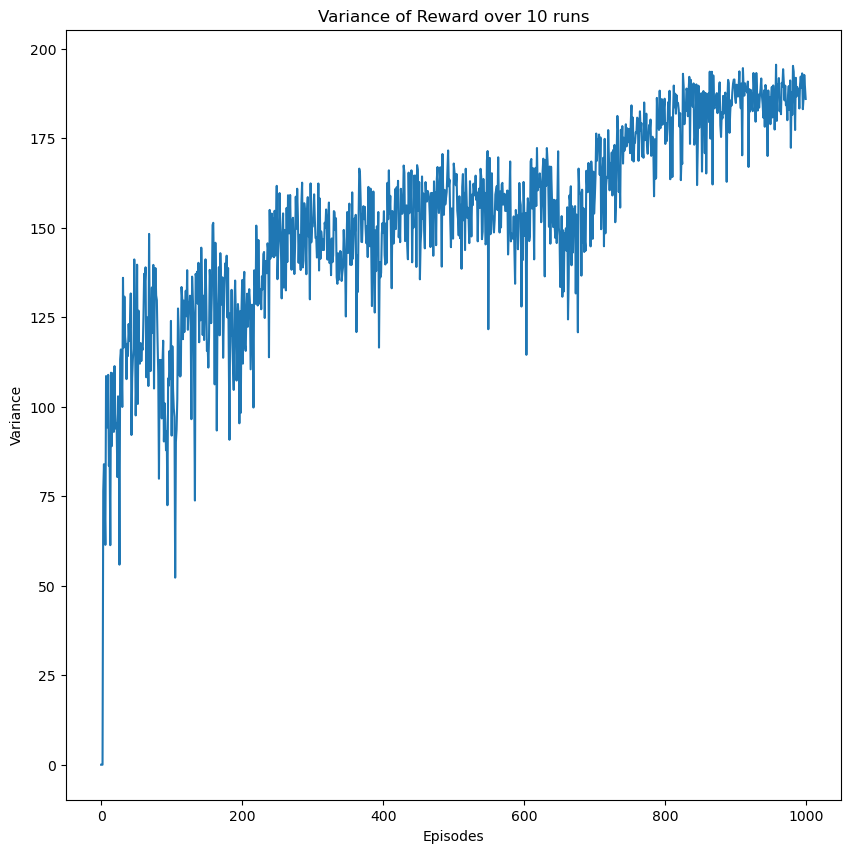

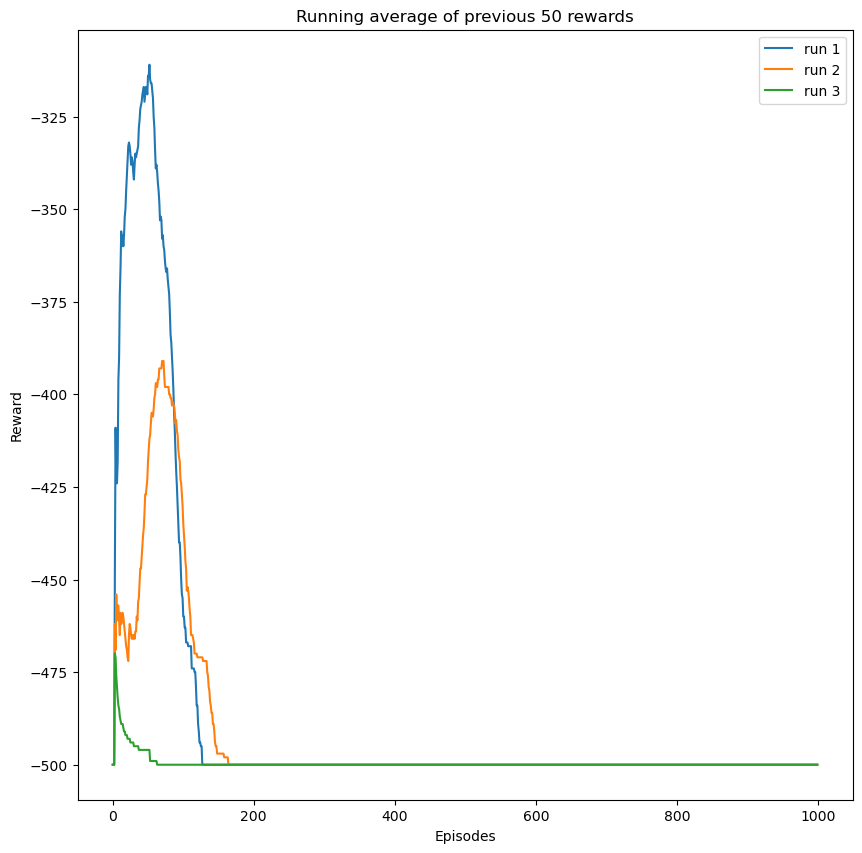

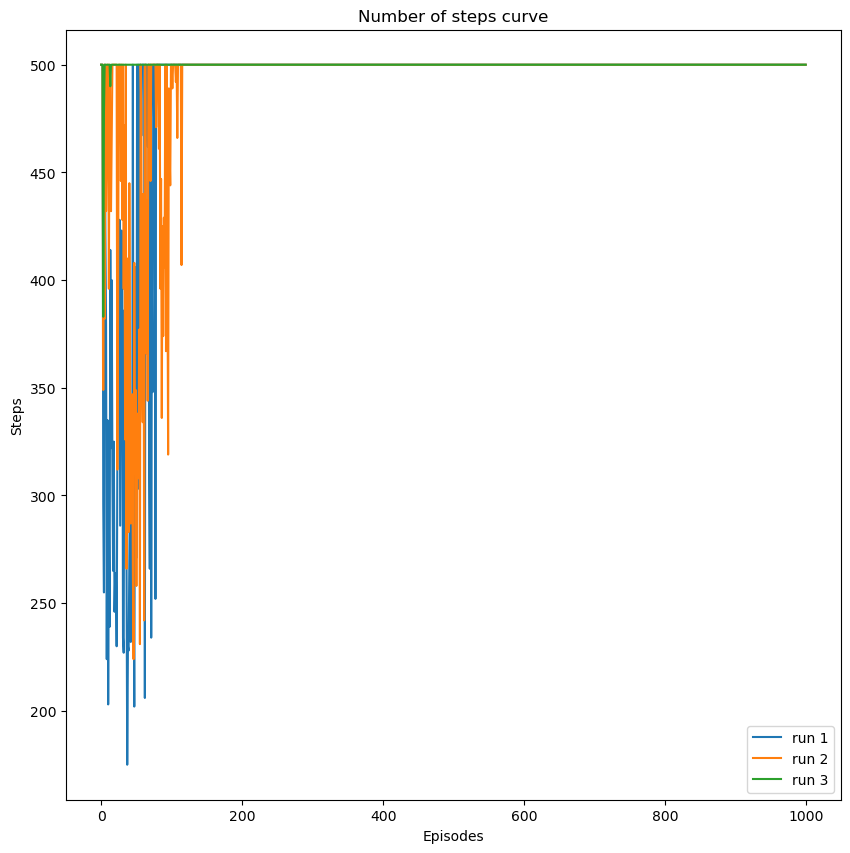

In [ ]:
NUM_HIDDEN = 2
HIDDEN_SIZES = [1024, 1024]
LR = 1e-4
NUM_EPISODES = 1000
AVG_NUM = 50
ENV_NAME = 'Acrobot-v1'
SOLVE_CUTOFF = -100.0
STEP = 5

ENV = gym.make(ENV_NAME)
mean_rewards, var_rewards, comp_list, reward_lists, step_lists = do_multiple_runs(env_name=ENV_NAME, num_runs=10)

data = [f'Number of Hidden Layers - {NUM_HIDDEN}', f'Hidden Sizes - {HIDDEN_SIZES}', f'Learning Rate - {LR}', 
        f'Run number of episodes to solve - {comp_list}', f'Mean number of episodes to solve- {np.mean(comp_list)}', 
        f'Number of episodes - {NUM_EPISODES}', f'Environment Name - {ENV_NAME}', f'NSTEP = {STEP}']

fname = f'hl={NUM_HIDDEN}_hs={HIDDEN_SIZES}_lr={LR}_env={ENV_NAME}_numep={NUM_EPISODES}_nstep={STEP}'
os.mkdir(PATH+'/'+fname)
gen_plots_and_save_data(fname, data, mean_rewards, var_rewards, reward_lists, step_lists)

/opt/conda/lib/python3.7/site-packages/gym/core.py:173: DeprecationWarning: WARN: Function `env.seed(seed)` is marked as deprecated and will be removed in the future. Please use `env.reset(seed=seed) instead.
  "Function `env.seed(seed)` is marked as deprecated and will be removed in the future. "


Episode  10 Reward -193.000000 Average Reward -281.100000
Episode  20 Reward -193.000000 Average Reward -169.200000
Episode  30 Reward -258.000000 Average Reward -184.200000
Episode  40 Reward -111.000000 Average Reward -162.800000
Episode  50 Reward -131.000000 Average Reward -157.000000
Episode  60 Reward -146.000000 Average Reward -138.700000
Episode  70 Reward -131.000000 Average Reward -138.000000
Episode  80 Reward -106.000000 Average Reward -140.900000
Episode  90 Reward -105.000000 Average Reward -128.700000
Episode  100 Reward -108.000000 Average Reward -147.500000
Episode  110 Reward -143.000000 Average Reward -156.800000
Episode  120 Reward -127.000000 Average Reward -144.900000
Episode  130 Reward -117.000000 Average Reward -151.800000
Episode  140 Reward -134.000000 Average Reward -136.000000
Episode  150 Reward -193.000000 Average Reward -159.700000
Episode  160 Reward -177.000000 Average Reward -186.100000
Episode  170 Reward -406.000000 Average Reward -252.600000
Episod

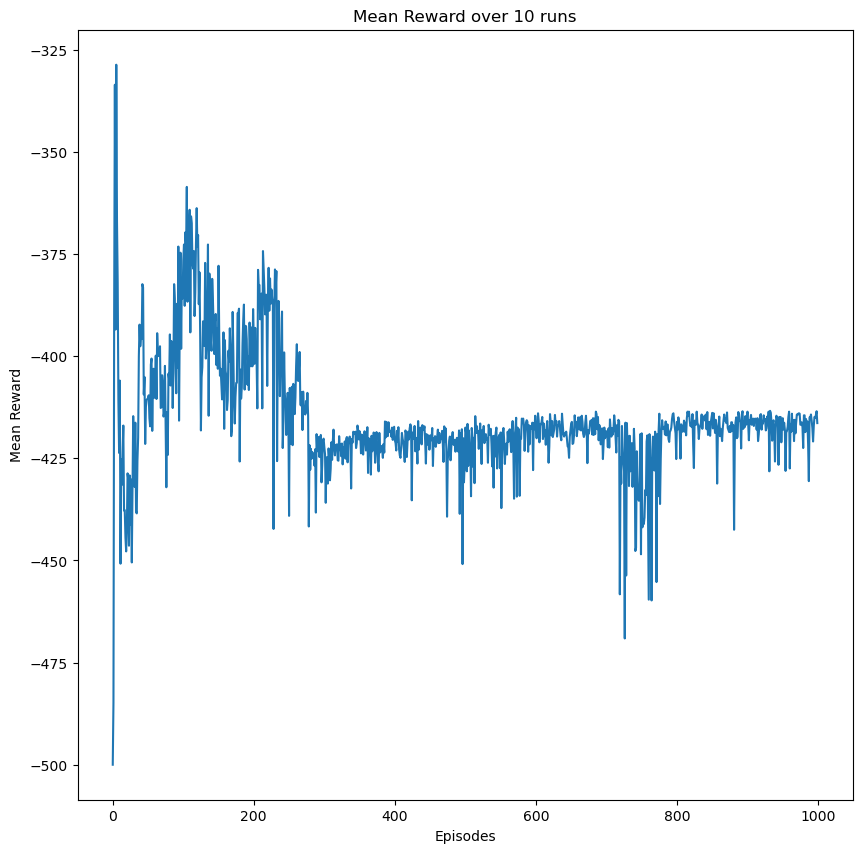

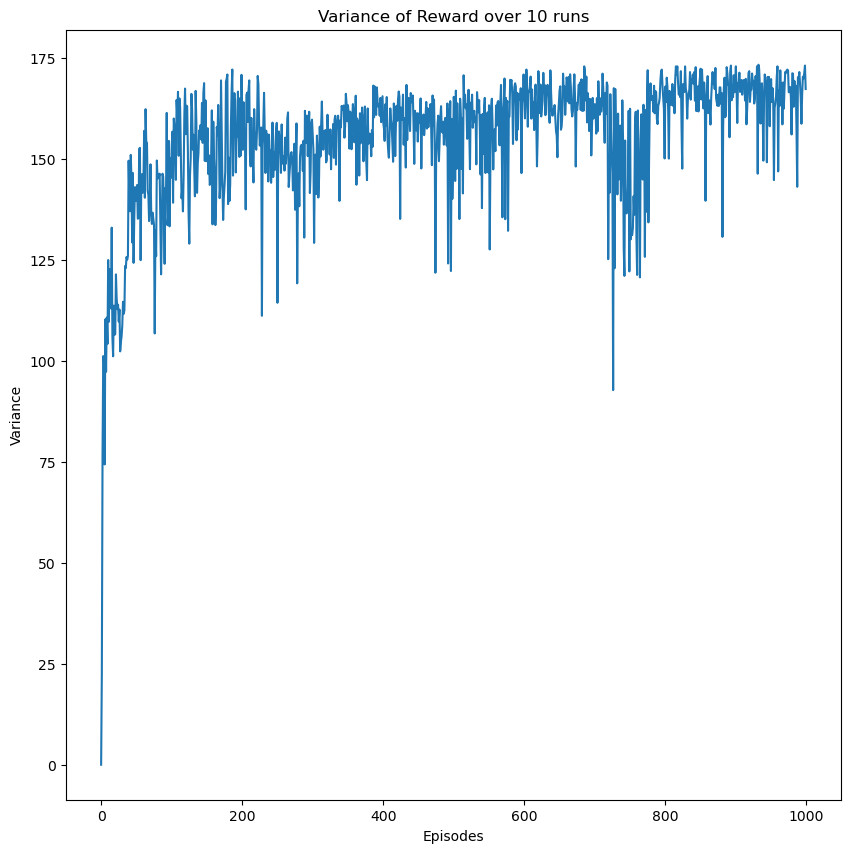

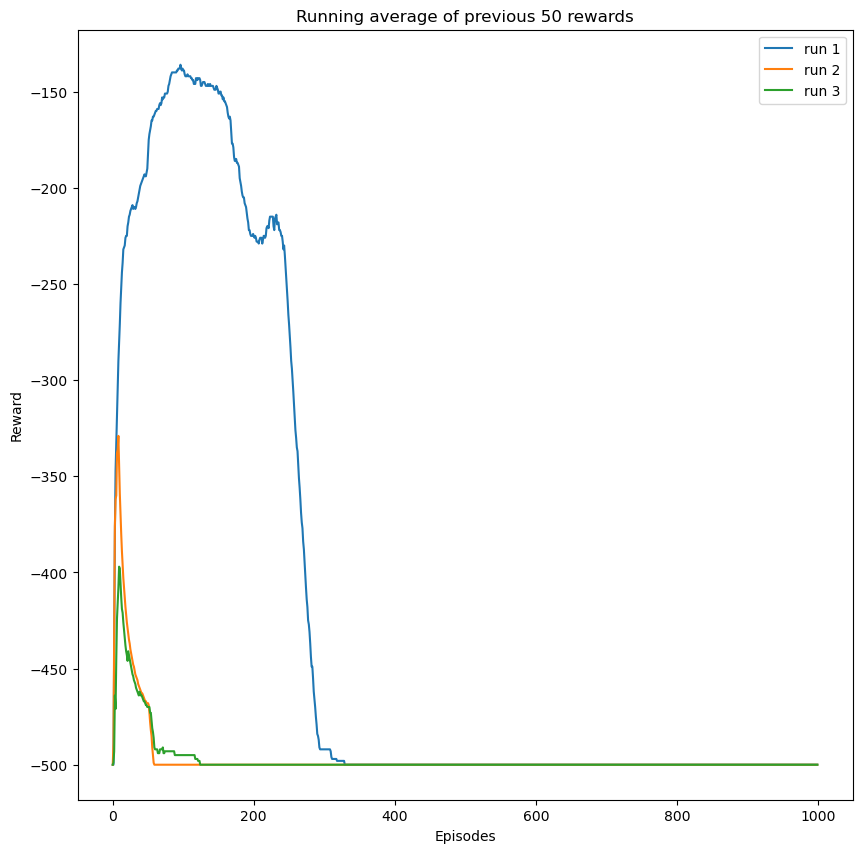

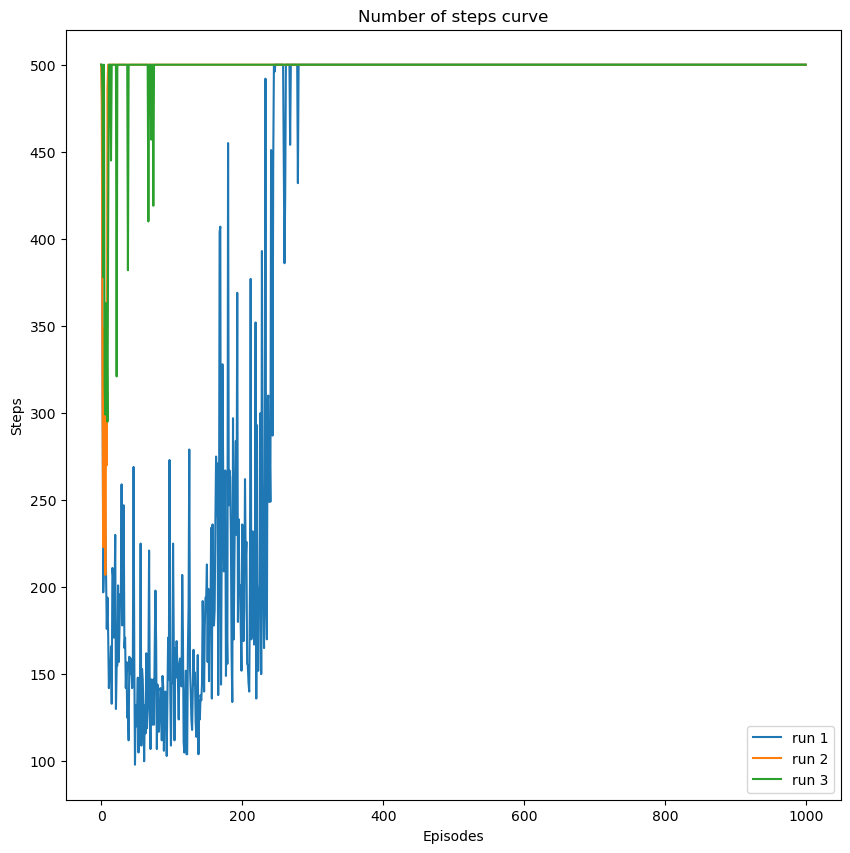

In [ ]:
NUM_HIDDEN = 2
HIDDEN_SIZES = [1024, 1024]
LR = 2e-4
NUM_EPISODES = 1000
AVG_NUM = 50
ENV_NAME = 'Acrobot-v1'
SOLVE_CUTOFF = -100.0
STEP = 5

ENV = gym.make(ENV_NAME)
mean_rewards, var_rewards, comp_list, reward_lists, step_lists = do_multiple_runs(env_name=ENV_NAME, num_runs=10)

data = [f'Number of Hidden Layers - {NUM_HIDDEN}', f'Hidden Sizes - {HIDDEN_SIZES}', f'Learning Rate - {LR}', 
        f'Run number of episodes to solve - {comp_list}', f'Mean number of episodes to solve- {np.mean(comp_list)}', 
        f'Number of episodes - {NUM_EPISODES}', f'Environment Name - {ENV_NAME}', f'NSTEP = {STEP}']

fname = f'hl={NUM_HIDDEN}_hs={HIDDEN_SIZES}_lr={LR}_env={ENV_NAME}_numep={NUM_EPISODES}_nstep={STEP}'
os.mkdir(PATH+'/'+fname)
gen_plots_and_save_data(fname, data, mean_rewards, var_rewards, reward_lists, step_lists)

/opt/conda/lib/python3.7/site-packages/gym/core.py:173: DeprecationWarning: WARN: Function `env.seed(seed)` is marked as deprecated and will be removed in the future. Please use `env.reset(seed=seed) instead.
  "Function `env.seed(seed)` is marked as deprecated and will be removed in the future. "


Episode  10 Reward -500.000000 Average Reward -475.900000
Episode  20 Reward -500.000000 Average Reward -480.100000
Episode  30 Reward -355.000000 Average Reward -452.700000
Episode  40 Reward -471.000000 Average Reward -368.100000
Episode  50 Reward -390.000000 Average Reward -391.500000
Episode  60 Reward -500.000000 Average Reward -414.300000
Episode  70 Reward -500.000000 Average Reward -487.500000
Episode  80 Reward -500.000000 Average Reward -488.800000
Episode  90 Reward -410.000000 Average Reward -466.500000
Episode  100 Reward -500.000000 Average Reward -495.400000
Episode  110 Reward -500.000000 Average Reward -500.000000
Episode  120 Reward -500.000000 Average Reward -500.000000
Episode  130 Reward -500.000000 Average Reward -500.000000
Episode  140 Reward -500.000000 Average Reward -500.000000
Episode  150 Reward -500.000000 Average Reward -500.000000
Episode  160 Reward -500.000000 Average Reward -500.000000
Episode  170 Reward -500.000000 Average Reward -500.000000
Episod

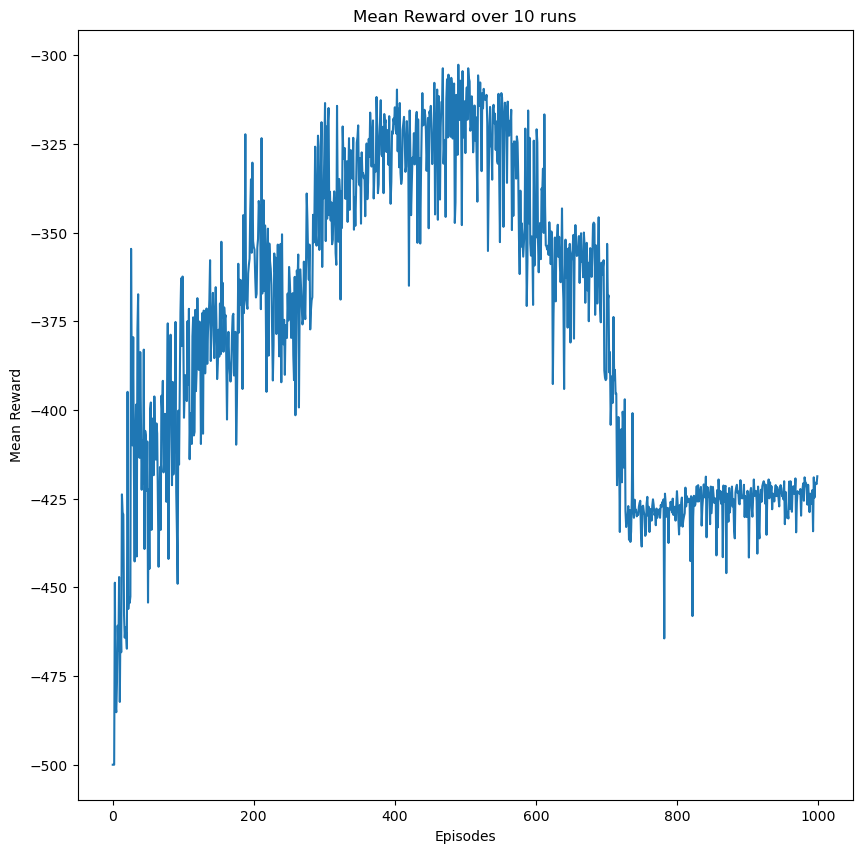

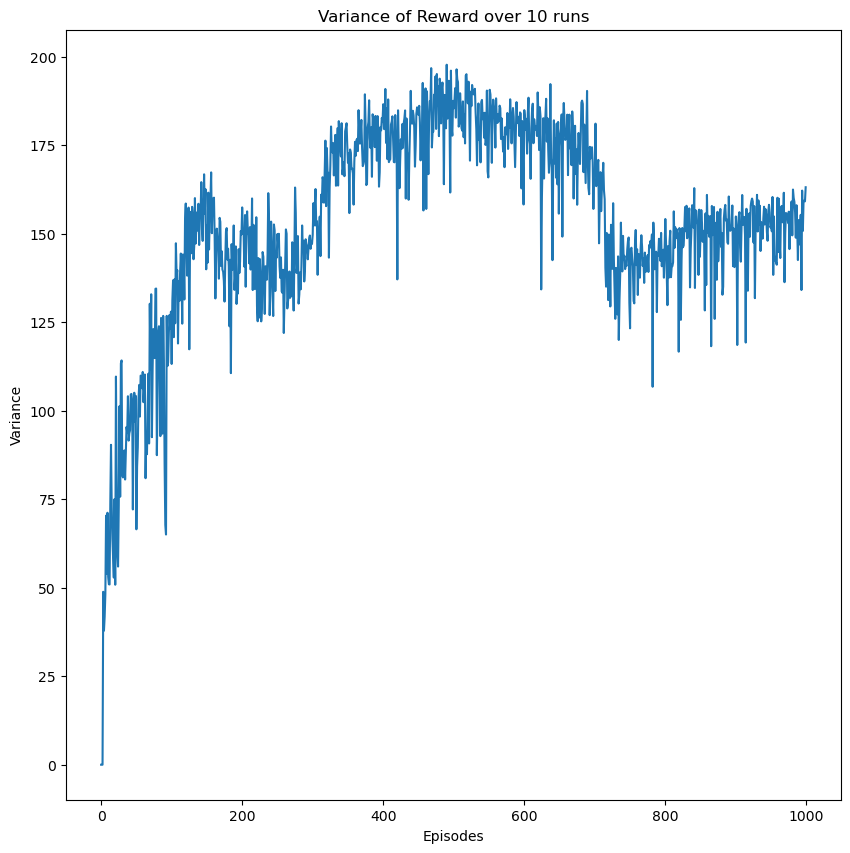

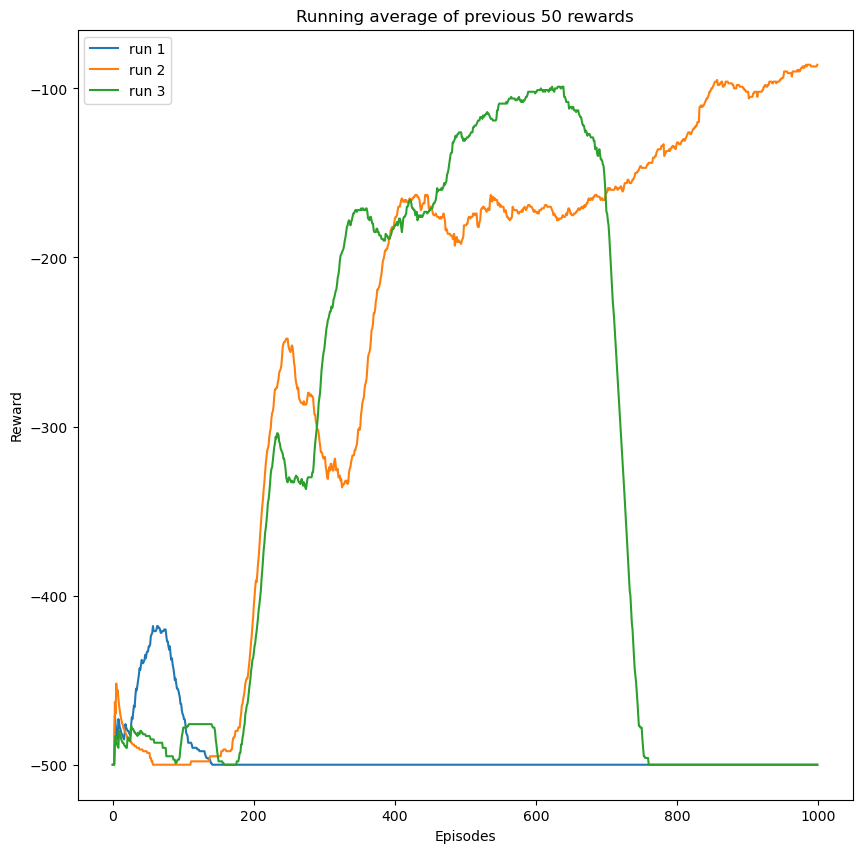

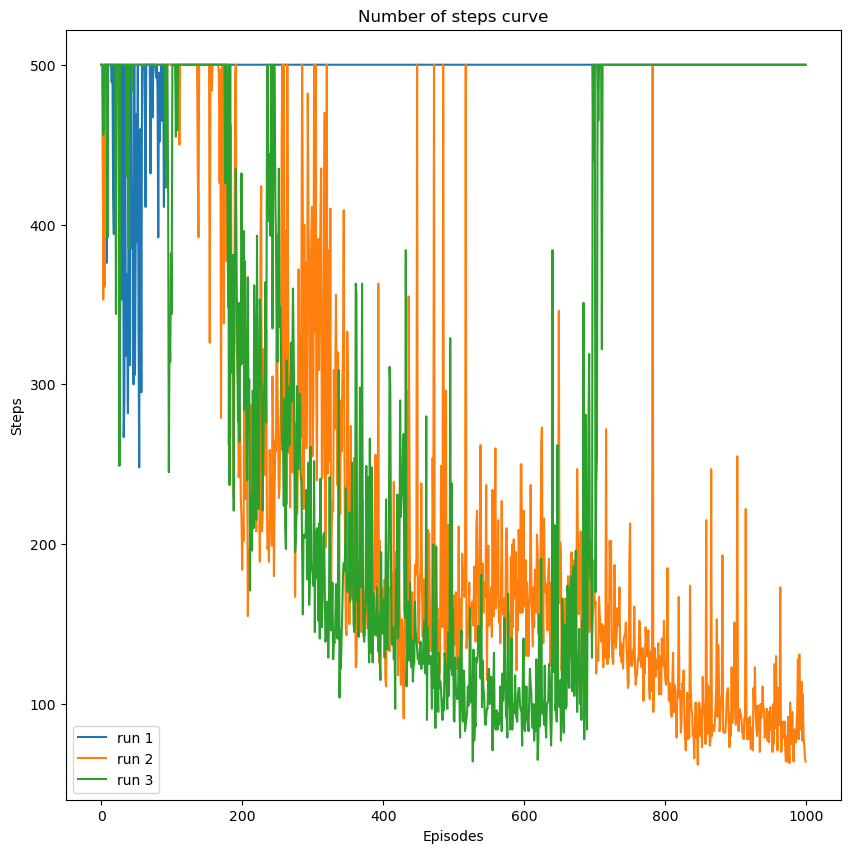

In [ ]:
NUM_HIDDEN = 3
HIDDEN_SIZES = [512, 1024, 512]
LR = 1e-4
NUM_EPISODES = 1000
AVG_NUM = 50
ENV_NAME = 'Acrobot-v1'
SOLVE_CUTOFF = -100.0
STEP = 5

ENV = gym.make(ENV_NAME)
mean_rewards, var_rewards, comp_list, reward_lists, step_lists = do_multiple_runs(env_name=ENV_NAME, num_runs=10)

data = [f'Number of Hidden Layers - {NUM_HIDDEN}', f'Hidden Sizes - {HIDDEN_SIZES}', f'Learning Rate - {LR}', 
        f'Run number of episodes to solve - {comp_list}', f'Mean number of episodes to solve- {np.mean(comp_list)}', 
        f'Number of episodes - {NUM_EPISODES}', f'Environment Name - {ENV_NAME}', f'NSTEP = {STEP}']

fname = f'hl={NUM_HIDDEN}_hs={HIDDEN_SIZES}_lr={LR}_env={ENV_NAME}_numep={NUM_EPISODES}_nstep={STEP}'
os.mkdir(PATH+'/'+fname)
gen_plots_and_save_data(fname, data, mean_rewards, var_rewards, reward_lists, step_lists)

#### MountainCar

/opt/conda/lib/python3.7/site-packages/gym/core.py:173: DeprecationWarning: WARN: Function `env.seed(seed)` is marked as deprecated and will be removed in the future. Please use `env.reset(seed=seed) instead.
  "Function `env.seed(seed)` is marked as deprecated and will be removed in the future. "


Episode  10 Reward -200.000000 Average Reward -200.000000
Episode  20 Reward -200.000000 Average Reward -200.000000
Episode  30 Reward -200.000000 Average Reward -200.000000
Episode  40 Reward -200.000000 Average Reward -200.000000
Episode  50 Reward -200.000000 Average Reward -200.000000
Episode  60 Reward -200.000000 Average Reward -200.000000
Episode  70 Reward -200.000000 Average Reward -200.000000
Episode  80 Reward -200.000000 Average Reward -200.000000
Episode  90 Reward -200.000000 Average Reward -200.000000
Episode  100 Reward -200.000000 Average Reward -200.000000
Episode  110 Reward -200.000000 Average Reward -200.000000
Episode  120 Reward -200.000000 Average Reward -200.000000
Episode  130 Reward -200.000000 Average Reward -200.000000
Episode  140 Reward -200.000000 Average Reward -200.000000
Episode  150 Reward -200.000000 Average Reward -200.000000
Episode  160 Reward -200.000000 Average Reward -200.000000
Episode  170 Reward -200.000000 Average Reward -200.000000
Episod

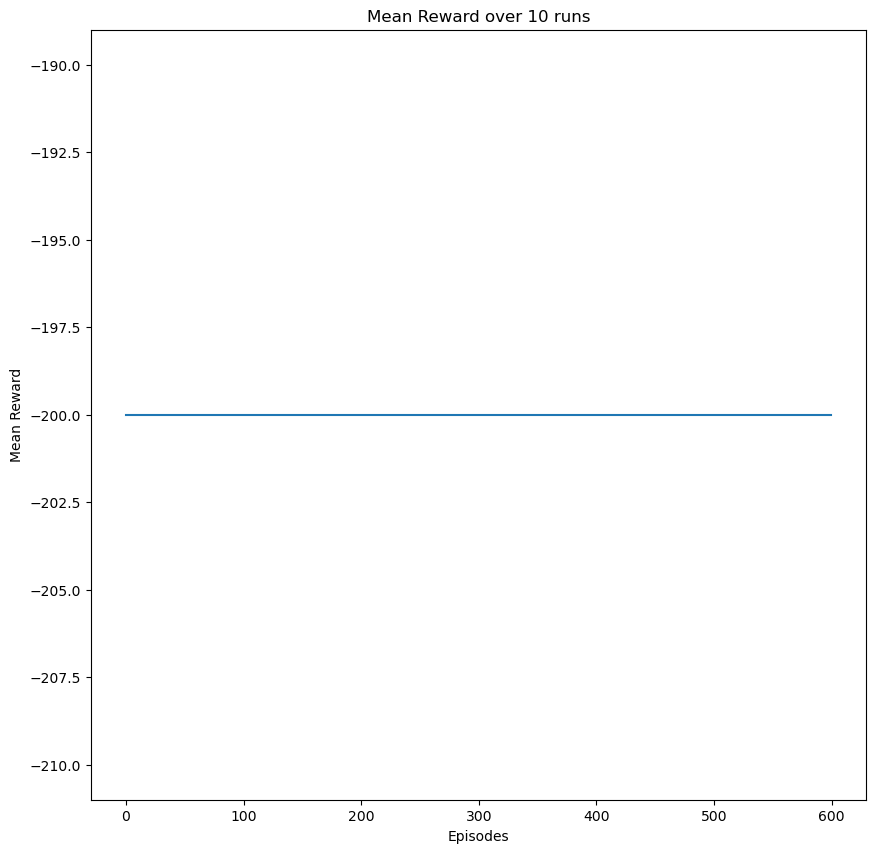

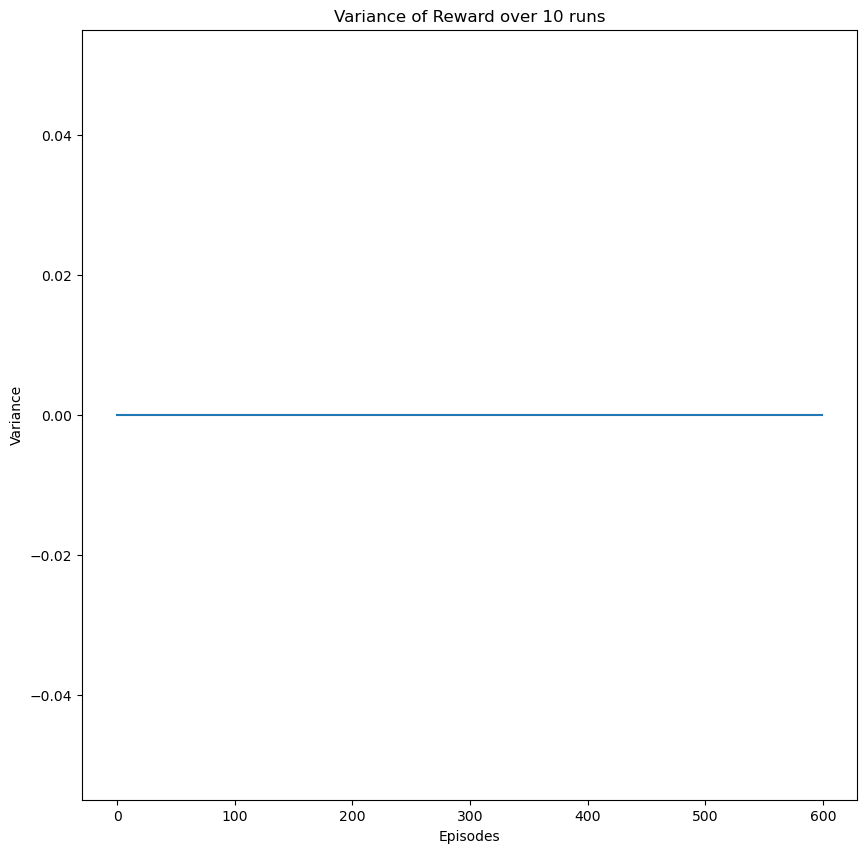

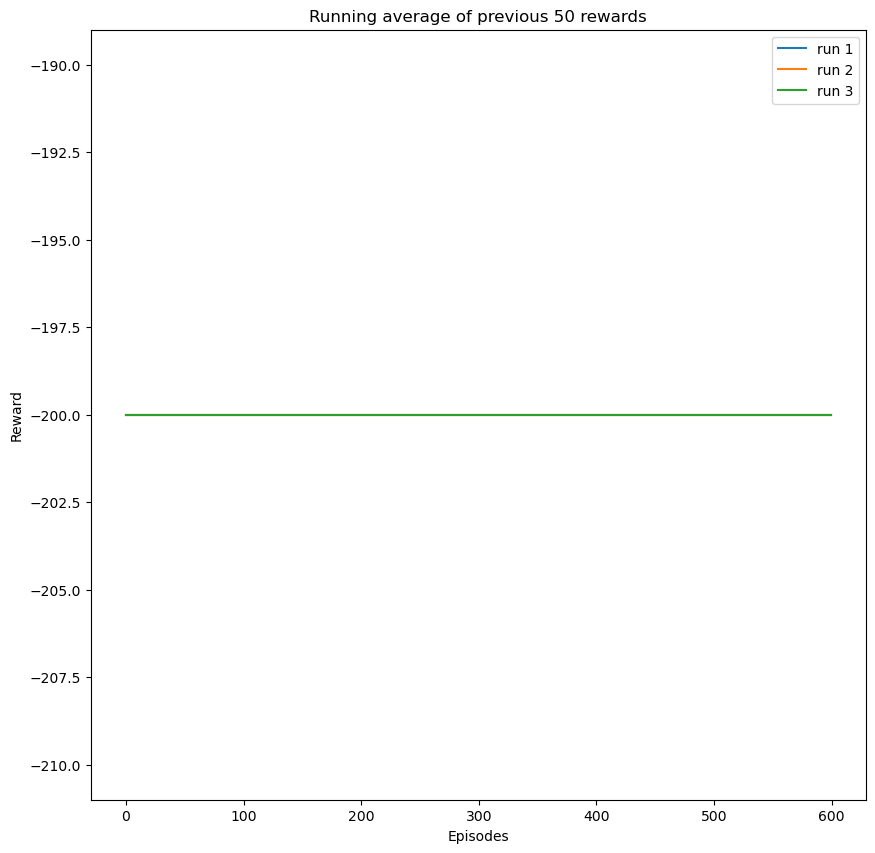

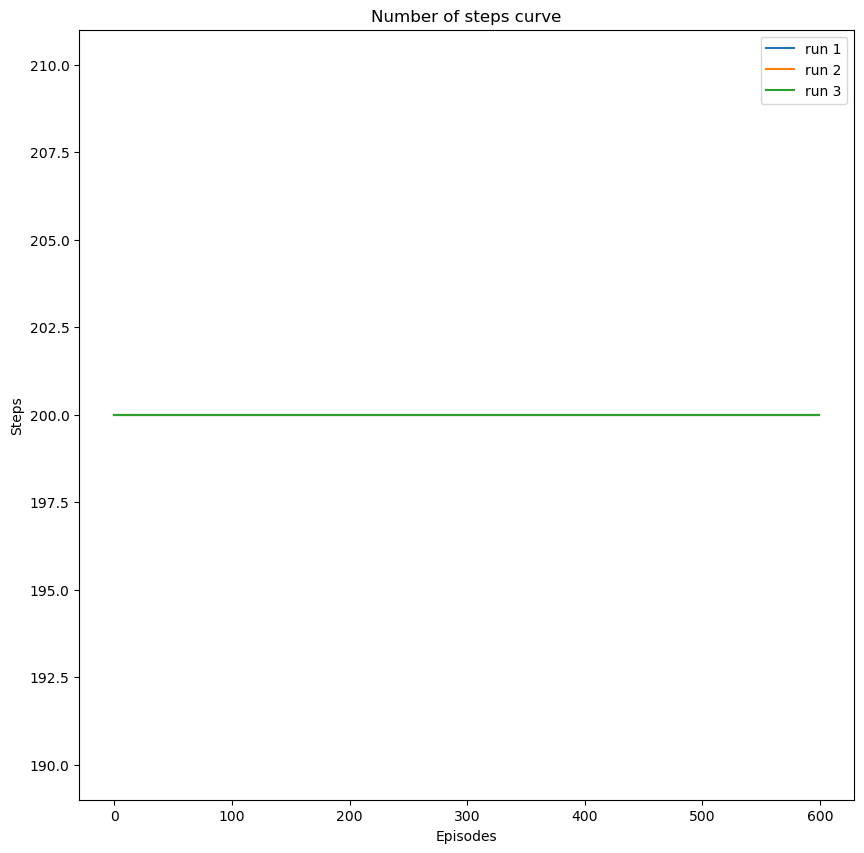

In [ ]:
NUM_HIDDEN = 2
HIDDEN_SIZES = [1024, 512]
LR = 1e-4
NUM_EPISODES = 600
AVG_NUM = 50
ENV_NAME = 'MountainCar-v0'
SOLVE_CUTOFF = -125
STEP = 5

ENV = gym.make(ENV_NAME)
mean_rewards, var_rewards, comp_list, reward_lists, step_lists = do_multiple_runs(env_name=ENV_NAME, num_runs=10)

data = [f'Number of Hidden Layers - {NUM_HIDDEN}', f'Hidden Sizes - {HIDDEN_SIZES}', f'Learning Rate - {LR}', 
        f'Run number of episodes to solve - {comp_list}', f'Mean number of episodes to solve- {np.mean(comp_list)}', 
        f'Number of episodes - {NUM_EPISODES}', f'Environment Name - {ENV_NAME}', f'NSTEP = {STEP}']

fname = f'hl={NUM_HIDDEN}_hs={HIDDEN_SIZES}_lr={LR}_env={ENV_NAME}_numep={NUM_EPISODES}_nstep={STEP}'
os.mkdir(PATH+'/'+fname)
gen_plots_and_save_data(fname, data, mean_rewards, var_rewards, reward_lists, step_lists)